# Setup

In [1]:
# main
import pandas as pd
import numpy as np
import operator
import re
import scipy.stats as stats
from scipy.stats import gaussian_kde
from statsmodels.distributions.empirical_distribution import ECDF

# diagnositcs and metrics
import shap
from sklearn.metrics import silhouette_score

# preprocessing
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import make_column_selector as selector, ColumnTransformer
from sklearn.pipeline import Pipeline
from feature_engine.timeseries.forecasting import LagFeatures
from statsmodels.tsa.tsatools import add_trend
from statsmodels.tsa.filters.hp_filter import hpfilter
from scipy.signal import savgol_filter
from scipy.stats import norm

# models
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.cross_decomposition import PLSRegression

# unsupervised models
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# bayesian modeling
import pytensor.tensor as pt
import pymc as pm

# # feature selection
# from sklearn.feature_selection import SequentialFeatureSelector
# from sklearn.model_selection import TimeSeriesSplit

# charts
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import seaborn as sns
import arviz as az
import matplotlib.colors as matcolors
from matplotlib import cm
import networkx as nx

# models (import)
from GAR.growth import calc_growth_rate
from GAR.tsfit import dist_fit, gen_PDF_and_CDF
from GAR.historical import get_model_quantiles, get_quantiles

# util
import pickle
from tqdm.notebook import tqdm
from dateutil import parser
from IPython.display import display

# setup
sns.reset_defaults()
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

In [2]:
class StandardScalerDF:

    def __init__(self, mean=None, std=None):
        self.mean_ = mean
        self.std_ = std

    def fit(self, X):
        self.mean_ = X.mean()
        self.std_ = X.std()
        return self

    def transform(self, X):
        if self.mean_ is None or self.std_ is None:
            raise ValueError("Scaler has not been fit yet.")
        scaled_X = (X - self.mean_) / self.std_
        return scaled_X

    def fit_transform(self, X):
        self.fit(X)
        return self.transform(X)

    def inverse_transform(self, X_scaled):
        if self.mean_ is None or self.std_ is None:
            raise ValueError("Scaler has not been fit yet.")
        X = X_scaled * self.std_ + self.mean_
        return X

In [3]:
# Custom transformer to scale and return DataFrame
class MinMaxScalerDF(BaseEstimator, TransformerMixin):

    def __init__(self, feature_range=(0, 1)):
        self.feature_range = feature_range

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        min_new, max_new = self.feature_range
        X_std = (X - X.min(axis=0)) / (X.max(axis=0) - X.min(axis=0))
        scaled_data = X_std * (max_new - min_new) + min_new
        return scaled_data

In [4]:
def ecdf_normalize(x):
    x = x.sort_values().copy()
    x_ecdf = ECDF(x).y[1:]
    return pd.Series(x_ecdf, index=x.index).sort_index()

In [5]:
def ewma(S, Cov0, lam=0.94, med=0.5):
    S_st = S - med
    SS = np.einsum('ij,ik->ijk', S_st, S_st)
    Cov = np.zeros(SS.shape)
    Cov[0] = Cov0

    # cov estimation
    for i in range(1, SS.shape[0]):
        Cov[i] = lam * Cov[i-1] + (1-lam) * SS[i]
    sigma2 = np.diagonal(Cov, axis1=1, axis2=2)
    sig_sig = np.einsum('ij,ik->ijk', np.sqrt(sigma2), np.sqrt(sigma2))

    # corr estimation
    Corr = Cov / sig_sig
    tl_indices = np.tril_indices(S_st.shape[1], k=-1)
    Corr_series = pd.DataFrame(Corr[:, tl_indices[0], tl_indices[1]], index=S_st.index)
    return Corr, Corr_series

In [6]:
# Kalman filter: Kalman_companion method below
def kalman_companion(data, S0, P0, L, R, T, Q):
    # scalar setup
    t, nvars = data.shape
    nstates_all = S0.shape[0]
    nstates = L.shape[0]

    # matrix setup
    S_pred = S0
    P_pred = P0
    S = np.zeros((data.shape[0], nstates_all))
    P = np.zeros((nstates_all**2, t))

    # Kalman filter step, extracting states
    for index, (date, y_i) in enumerate(data.iterrows()):
        nu = np.array(y_i) - L.T @ S_pred[:nstates]  # conditional forecast error
        f = L.T @ P_pred[:nstates, :nstates] @ L + R  # variance of the conditional forecast error
        finv = L @ np.linalg.inv(f)
        Stt = S_pred + (P_pred[:, :nstates] @ finv @ nu)
        Ptt = P_pred - P_pred[:, :nstates] @ finv @ (L.T @ P_pred[:nstates, :])
        if date < data.index[-1]:
            S_pred = T @ Stt
            P_pred = T @ Ptt @ T.T + Q
        S[index, :] = Stt
        P[:, index] = Ptt.reshape(-1)

    # Now we can draw Sdraw(T|T) ~ N(S(T|T), P(T|T))
    S_draw = np.zeros((t, nstates_all))
    S_draw[t-1, :] = S[t-1, :]

    # iterate 'down', drawing at each step, use modification for singular Q
    T_star = T[:nstates, :]
    Q_star = Q[:nstates, :nstates]

    # Kalman Smoothing step
    for i in range(1, t)[::-1]:
        Sf = S_draw[i, :nstates]
        Stt = S[i-1, :]
        Ptt = P[:, i-1].reshape(nstates_all, -1)
        f = T_star @ Ptt @ T_star.T + Q_star
        finv = T_star.T @ np.linalg.inv(f)
        nu = Sf - T_star @ Stt
        Smean = Stt + Ptt @ finv @ nu
        # Svar = Ptt - Ptt @ finv @ (T_star @ Ptt)
        S_draw[i-1, :] = Smean
    S_draw = S_draw[:, :nstates]
    return S_draw

In [7]:
def Minn_prior_KOOP(gamma, nstates, nlags, nvars):
    # This is the version of the Minnesota prior with no dependence on the
    # standard deviations of the univariate regressions. This prior allows
    # online estimation and forecasting of the large TVP-VAR.

    # 1. Minnesota Mean on VAR regression coefficients
    A_prior = np.concatenate((0.9*np.eye(nstates),
                              np.zeros(((nlags-1)*nstates, nstates))), axis=0).T
    a_prior = A_prior.T.reshape(-1)

    # 2. Minnesota Variance on VAR regression coefficients
    # Create an array of dimensions nvars x nstates, which will contain the nvars diagonal
    # elements of the covariance matrix, in each of the nstates equations.
    V_i = np.zeros((int(nvars/nstates), nstates))

    for i in range(nstates):
        for j in range(int(nvars/nstates)):
            V_i[j, i] = gamma / (np.ceil((j+1)/nstates))**2

    # 3. Now V (MINNESOTA VARIANCE) is a diagonal matrix with diagonal elements of V_i
    V_prior = np.diag(V_i.reshape(-1))  # this is the prior variance of the vector alpha
    return a_prior, V_prior

In [8]:
def create_RHS_NI(YY, nstates, nlags, t):
    K = nlags*(nstates**2)  # K is the number of elements in the state vector
    # Create x_t matrix
    # first find the zeros in matrix x_t
    x_t = np.zeros(((t-nlags)*nstates, K))
    for i in range(t-nlags):
        ztemp = np.array([]).reshape(nstates, -1)
        for j in range(nlags):
            xtemp = YY[i, j*nstates:(j+1)*nstates]
            xtemp = np.kron(np.eye(nstates), xtemp)
            ztemp = np.concatenate((ztemp, xtemp), axis=1)
        x_t[i*nstates:(i+1)*nstates, :] = ztemp
    return x_t, K

In [9]:
class TVP_FAVAR():
    # Function to estimate time-varying loadings, coefficients, and covariances
    # from a TVP-FAVAR, conditional on feeding in an estimate of the factors
    # (Principal Components). This function runs the Kalman filter and smoother
    # for all time-varying parameters using an adaptive algorithm (EWMA filter
    # for the covariances).
    # Written by Dimitris Korobilis, 2012, edited by YV
    def __init__(self, endog, exog, nlags=4, nfactors=1):
        nstates = exog.shape[1]
        t, nvars = endog.shape
        self.nlags = nlags
        self.nmacro = nstates - nfactors
        nstates_all = nstates*self.nlags
        nVAR = self.nlags*(nstates**2)

        # setup: lambda
        self.lambda_pred = np.zeros((nvars, nstates, t))
        self.lambda_update = np.zeros((nvars, nstates, t))

        for i in range(t):
            self.lambda_pred[:nstates, :nstates, i] = np.eye(nstates)
            self.lambda_update[:nstates, :nstates, i] = np.eye(nstates)

        # setup: beta
        self.beta_pred = np.zeros((nVAR, t))
        self.beta_update = np.zeros((nVAR, t))

        # setup: states
        self.Rl_t = np.zeros((nstates, nstates, nvars, t))
        self.Sl_t = np.zeros((nstates, nstates, nvars, t))
        self.Rb_t = np.zeros((nVAR, nVAR, t))
        self.Sb_t = np.zeros((nVAR, nVAR, t))

        # setup: expectations
        self.x_t_pred = np.zeros((t, nvars))
        self.e_t = np.zeros((nvars, t))
        self.lambda_t = np.zeros((nvars, nstates, t))
        self.beta_t = np.zeros((nstates_all, nstates_all, t))

        # setup: covariance
        self.Q_t = np.zeros((nstates, nstates, t))
        self.V_t = np.zeros((nvars, nvars, t))

        # define lags of the factors to be used in the state (VAR) equation
        lf = LagFeatures(periods=list(range(1, self.nlags+1)), drop_original=True)
        xx = lf.fit_transform(exog).dropna()
        yy = exog.loc[xx.index].copy()
        self.xx = np.array(xx)
        self.yy = np.array(yy)
        self.exog = np.array(exog)
        self.endog = np.array(endog)
        Flagtemp, m = create_RHS_NI(self.xx.copy(), nstates, self.nlags, t)
        self.Flag = np.concatenate((np.zeros((nstates_all, nVAR)), Flagtemp), axis=0)

    def kalman_setup(self, priors):
        # init
        t, nvars = self.endog.shape
        self.Q_t[:, :, 0] = priors['Q_0']
        self.V_t[:, :, 0] = np.diag(np.diag(priors['V_0']))
        self.lambda_pred[:, :, 0] = priors['lambda_0_mean']
        self.beta_pred[:, 0] = priors['beta_0_mean']
        self.beta_update[:, 0] = self.beta_pred[:, 0]
        self.Rb_t[:, :, 0] = priors['beta_0_var']
        for i in range(self.nmacro, nvars):
            self.Rl_t[:, :, i, 0] = priors['lambda_0_var']

    def kalman_update_coeffs(self, t):
        nstates = self.exog.shape[1]
        # Update VAR coefficients conditional on Principal Componets estimates
        Rx = self.Rb_t[:, :, t] @ self.Flag[t*nstates:(t+1)*nstates, :].T
        KV_b = self.Q_t[:, :, t] + self.Flag[t*nstates:(t+1)*nstates, :]  @ Rx
        KG = Rx @ np.linalg.inv(KV_b)
        beta_adj = KG @ (self.exog[t, :].T - self.Flag[t*nstates:(t+1)*nstates, :] @ self.beta_pred[:, t])
        self.beta_update[:, t] = self.beta_pred[:, t] + beta_adj
        Sb_adj = KG @ (self.Flag[t*nstates:(t+1)*nstates, :] @ self.Rb_t[:, :, t])
        self.Sb_t[:, :, t] = self.Rb_t[:, :, t] - Sb_adj

    def kalman_filter_early(self, t, decays, priors):
        nstates = self.exog.shape[1]
        exog_i = self.exog[t, :]

        # priors
        self.beta_pred[:, t] = priors['beta_0_mean']
        self.beta_update[:, t] = self.beta_pred[:, t]
        self.Rb_t[:, :, t] = priors['beta_0_var']

        # expectations
        Gf_t = 0.1*(exog_i.reshape(-1, 1) @ exog_i.reshape(1, -1))
        if t > 0:
            self.Q_t[:, :, t] = decays[1]*self.Q_t[:, :, t-1] + (1-decays[1])*Gf_t[:nstates, :nstates]

    def kalman_filter(self, t, decays):
        nstates = self.exog.shape[1]
        nstates_all = nstates*self.nlags
        yy_i = self.yy[t-self.nlags]
        xx_i = self.xx[t-self.nlags]

        # expectations
        ee_i = (yy_i - xx_i @ self.B[:nstates, :nstates_all].T)
        Gf_t = ee_i.reshape(-1, 1) @ ee_i.reshape(1, -1)
        self.Q_t[:, :, t] = decays[1]*self.Q_t[:, :, t-1] + (1-decays[1])*Gf_t[:nstates, :nstates]

        # update beta
        self.beta_pred[:, t] = self.beta_update[:, t-1]
        self.Rb_t[:, :, t] = (1 / decays[3]) * self.Sb_t[:, :, t-1]

    def kalman_predict(self, t, decays):
        nstates = self.exog.shape[1]
        nvars = self.endog.shape[1]
        n_undefined_rows = nstates*(self.nlags-1)
        p = self.nmacro

        # Kalman predict steps
        if t > 0:
            self.lambda_pred[:, :, t] = self.lambda_update[:, :, t-1]
            self.Rl_t[:, :, :, t] = (1/decays[2])*self.Sl_t[:, :, :, t-1]

        # One step ahead prediction based on PC factor
        self.x_t_pred[t, :] = self.lambda_pred[:, :, t] @ self.exog[t, :].T

        # Prediction error
        self.e_t[:, t] = self.endog[t, :] - self.x_t_pred[t, :]

        # Get the measurement error variance
        self.A_t = self.e_t[self.nmacro:, t].reshape(-1, 1) @ self.e_t[self.nmacro:, t].reshape(1, -1)
        if t > 0:
            self.V_t[p:, p:, t] = decays[0]*self.V_t[p:, p:, t-1] + (1-decays[0])*np.diag(np.diag(self.A_t))

        # Update loadings conditional on Principal Components estimates
        for i in range(self.nmacro, nvars):
            Rx = self.Rl_t[:nstates, :nstates, i, t] @ self.exog[t, :nstates].T
            KV_l = self.V_t[i, i, t] + self.exog[t, :nstates] @ Rx
            KG = Rx / KV_l
            lambda_adj = KG * (self.endog[t, i].T - self.lambda_pred[i, :nstates, t] @ self.exog[t, :nstates].T)
            self.lambda_update[i, :nstates, t] = self.lambda_pred[i, :nstates, t] + lambda_adj
            Sl_adj = KG.reshape(-1, 1) @ (self.exog[t, :nstates] @ self.Rl_t[:nstates, :nstates, i, t]).reshape(1, -1)
            self.Sl_t[:nstates, :nstates, i, t] = self.Rl_t[:nstates, :nstates, i, t] - Sl_adj

        # update coeffs
        if t >= self.nlags:
            self.kalman_update_coeffs(t)

        # Assign coefficients
        biga = self.beta_update[:, t].reshape(nstates, self.nlags, nstates).transpose(1, 0, 2).reshape(nstates, -1)
        b_other = np.concatenate((np.eye(n_undefined_rows), np.zeros((n_undefined_rows, nstates))), axis=1)
        self.B = np.concatenate((biga, b_other), axis=0)
        self.lambda_t[:, :, t] = self.lambda_update[:, :, t]
        if np.max(np.abs(np.linalg.eig(self.B)[0])) < 0.9999:
            self.beta_t[:, :, t] = self.B
        else:
            self.beta_t[:, :, t] = self.beta_t[:, :, t-1]
            self.beta_update[:, t] = 0.95*self.beta_update[:, t-1]

    def smoother_setup(self, t):
        self.lambda_new = 0*self.lambda_update
        self.lambda_new[:, :, t] = self.lambda_update[:, :, t]
        self.beta_new = 0*self.beta_update
        self.beta_new[:, t] = self.beta_update[:, t]
        self.Q_t_new = 0*self.Q_t
        self.Q_t_new[:, :, t] = self.Q_t[:, :, t]
        self.V_t_new = 0*self.V_t
        self.V_t_new[:, :, t] = self.V_t[:, :, t]

    def kalman_smoother(self, t):
        # init
        nstates = self.exog.shape[1]
        nvars = self.endog.shape[1]
        p = self.nmacro

        # smooth lambda
        self.lambda_new[:nstates, :, t] = self.lambda_update[:nstates, :, t]
        for i in range(nstates, nvars):
            Ul_t = self.Sl_t[:nstates, :nstates, i, t] @ np.linalg.inv(self.Rl_t[:nstates, :nstates, i, t+1])
            lambda_adj = (self.lambda_new[i, :nstates, t+1] - self.lambda_pred[i, :nstates, t+1]) @ Ul_t.T
            self.lambda_new[i, :nstates, t] = self.lambda_update[i, :nstates, t] + lambda_adj

        # smooth beta
        if np.sum(self.Rb_t[:, :, t+1]) == 0:
            self.beta_new[:, t] = self.beta_update[:, t]
        else:
            Ub_t = self.Sb_t[:, :, t] @ np.linalg.inv(self.Rb_t[:, :, t+1])
            self.beta_new[:, t] = self.beta_update[:, t] + Ub_t @ (self.beta_new[:, t+1] - self.beta_pred[:, t+1])

        # smooth Q_t
        self.Q_t_new[:, :, t] = 0.9*self.Q_t[:, :, t] + 0.1*self.Q_t_new[:, :, t+1]

        # smooth V_t
        self.V_t_new[p:, p:, t] = 0.9*self.V_t[p:, p:, t] + 0.1*self.V_t_new[p:, p:, t+1]

    def kalman_reassign_coefficients(self, t):
        nstates = self.exog.shape[1]
        n_undefined_rows = nstates*(self.nlags-1)
        biga = self.beta_new[:, t].reshape(nstates, self.nlags, nstates).transpose(1, 0, 2).reshape(nstates, -1)
        b_other = np.concatenate((np.eye(n_undefined_rows), np.zeros((n_undefined_rows, nstates))), axis=1)
        B = np.concatenate((biga, b_other), axis=0)
        self.lambda_t[:, :, t] = self.lambda_new[:, :, t]
        self.beta_t[:, :, t] = B

    def fit(self, decays, priors):
        # initialize matrices for filtering
        t = self.endog.shape[0]
        self.kalman_setup(priors)

        # perform predictions at time t=0
        self.kalman_predict(0, decays)

        # 1. Kalman filter
        for irep in range(1, t):
            # Update the state covariances,
            # get the variance of the factor and update Q[t]
            if irep <= self.nlags:
                self.kalman_filter_early(irep, decays, priors)
            else:
                self.kalman_filter(irep, decays)
            self.kalman_predict(irep, decays)

        # 2. Kalman smoother
        self.smoother_setup(t-1)
        for irep in range(t-2, -1, -1):
            self.kalman_smoother(irep)

        # using smoothed values for beta and lambda
        for irep in range(t):
            self.kalman_reassign_coefficients(irep)
        return self.beta_t, self.beta_new, self.lambda_t, self.V_t, self.Q_t

    def kalman_factor_update(self, t):
        # setup
        nstates = self.exog.shape[1]

        # One step ahead prediction based on Kalman factor
        self.x_t_predf[t, :] = self.lambda_t[:, :, t] @ self.factor_pred[:nstates, t]

        # Prediction error
        self.ef_t[:, t] = self.endog[t, :] - self.x_t_predf[t, :]

        # Update the factors conditional on the estimate of lambda_t and beta_t
        KV_f = self.V_t[:, :, t] + self.lambda_t[:, :, t] @ self.Rf_t[:nstates, :nstates, t] @ self.lambda_t[:, :, t].T
        KG = (self.Rf_t[:nstates, :nstates, t] @ self.lambda_t[:, :, t].T) @ np.linalg.inv(KV_f)
        self.factor_update[:nstates, t] = self.factor_pred[:nstates, t] + KG @ self.ef_t[:, t]
        self.Sf_t[:nstates, :nstates, t] = self.Rf_t[:nstates, :nstates, t] - KG @ (self.lambda_t[:, :, t] @ self.Rf_t[:nstates, :nstates, t])

    def factor_filter(self, priors):
        # setup
        t, nvars = self.endog.shape
        nstates = self.exog.shape[1]
        nstates_all = nstates*self.nlags

        # init
        self.factor_pred = np.zeros((nstates_all, t))
        self.factor_update = np.zeros((nstates_all, t))
        self.Rf_t = np.zeros((nstates_all, nstates_all, t))
        self.Sf_t = np.zeros((nstates_all, nstates_all, t))
        self.x_t_predf = np.zeros((t, nvars))
        self.ef_t = np.zeros((nvars, t))

        # priors
        self.factor_pred[:, 0] = priors['factor_0_mean']
        self.Rf_t[:, :, 0] = priors['factor_0_var']
        self.kalman_factor_update(0)

        # filtering step
        for irep in range(1, t):
            self.factor_pred[:, irep] = self.beta_t[:, :, irep-1] @ self.factor_update[:, irep-1]
            Sfb_t = self.beta_t[:, :, irep-1] @ self.Sf_t[:, :, irep-1] @ self.beta_t[:, :, irep-1].T
            Q_t_sparse = np.concatenate((self.Q_t[:, :, irep], np.zeros((nstates, nstates*(self.nlags-1)))), axis=1)
            Q_t_sparse = np.concatenate((Q_t_sparse, np.zeros((nstates*(self.nlags-1), nstates*nlags))), axis=0)
            self.Rf_t[:, :, irep] = Sfb_t + Q_t_sparse
            self.kalman_factor_update(irep)

    def factor_smoother(self):
        # setup
        t, nvars = self.endog.shape
        nstates = self.exog.shape[1]

        # fixed-interval smoother for the factors
        self.factor_new = 0*self.factor_update
        self.factor_new[:, t-1] = self.factor_update[:, t-1]
        self.Sf_t_new = 0*self.Sf_t
        self.Sf_t_new[:, :, t-1] = self.Sf_t[:, :, t-1]

        # smoothing
        for irep in range(t-2, -1, -1):
            self.Z_t = self.Sf_t[:, :, irep] @ self.beta_t[:, :, irep].T
            U_t = np.squeeze(self.Z_t[:nstates, :nstates] @ np.linalg.inv(self.Rf_t[:nstates, :nstates, irep+1]))
            factor_adj = U_t @ (self.factor_new[:nstates, irep+1] - self.factor_pred[:nstates, irep+1])
            self.factor_new[:nstates, irep] = self.factor_update[:nstates, irep] + factor_adj
            Sf_adj = U_t @ (self.Sf_t[:nstates, :nstates, irep+1] - self.Rf_t[:nstates, :nstates, irep+1]) @ U_t.T
            self.Sf_t_new[:nstates, :nstates, irep] = self.Sf_t[:nstates, :nstates, irep] + Sf_adj
        self.factor_new = self.factor_new[:nstates].T

    def gen_factors(self, priors):
        self.factor_filter(priors)
        self.factor_smoother()
        return self.factor_new, self.Sf_t_new

In [10]:
def get_silhouette_scores(corr, n_init='auto'):
    ss = {k: silhouette_score(corr, KMeans(n_clusters=k, n_init=n_init).fit_predict(corr)) for k in range(2, corr.shape[0])}
    return ss

In [11]:
# assign colours to edges depending on positive or negative correlation
def assign_colour(correlation):
    if correlation <= 0:
        return "#ffa09b"  # red
    else:
        return "#9eccb7"  # green


# assign edge thickness depending on magnitude of correlation
def assign_thickness(correlation, benchmark_thickness=2, scaling_factor=3):
    return benchmark_thickness * abs(correlation)**scaling_factor


def assign_node_size(degree, scaling_factor=50):
    return degree * scaling_factor


# define a function that "rounds" a number to 0 if it is lower than threshold, and to 1 if it is higher (or equal).
def truncate(f, threshold=0.92): 
    if (abs(f) < threshold):
        return 0
    else:
        return 1.0

In [12]:
# 'winner takes all' method - set minium correlation threshold to remove some edges from the diagram
def plot_minimum_spanning_tree(corr, threshold=0.4, node_size=200, width=1.2,
                               node_color="#e1575c", color_legend=None,
                               title=None, title_text_size=18,
                               node_colors=None):
    font_dict = {'fontsize': title_text_size}

    # convert matrix to list of edges and rename the columns
    edges = corr.stack().reset_index()
    edges.columns = ['asset_1', 'asset_2', 'correlation']

    # remove self correlations
    edges = edges.loc[edges['asset_1'] != edges['asset_2']].copy()

    # create a new graph from edge list
    Gx = nx.from_pandas_edgelist(edges, 'asset_1', 'asset_2', edge_attr=['correlation'])

    # list to store edges to remove
    remove = []

    # loop through edges in Gx and find correlations which are below the threshold
    for asset_1, asset_2 in Gx.edges():
        corr_i = Gx[asset_1][asset_2]['correlation']
        if abs(corr_i) < threshold:
            remove.append((asset_1, asset_2))

    # remove edges contained in the remove list
    Gx.remove_edges_from(remove)

    edge_colours = []
    edge_width = []
    for key, value in nx.get_edge_attributes(Gx, 'correlation').items():
        edge_colours.append(assign_colour(value))
        edge_width.append(assign_thickness(value))

    # assign node size depending on number of connections (degree)
    node_size = []
    for key, value in dict(Gx.degree).items():
        node_size.append(assign_node_size(value))

    # create minimum spanning tree layout from Gx (after small correlations have been removed)
    mst = nx.minimum_spanning_tree(Gx)

    edge_colours = []

    # assign edge colours
    for key, value in nx.get_edge_attributes(mst, 'correlation').items():
        edge_colours.append(assign_colour(value))

    #  Using a figure to setup the legend
    has_legend = isinstance(color_legend, type(None))
    if has_legend:
        f = plt.figure(1)
        ax = f.add_subplot(1, 1, 1)
        for label, color in color_legend.items():
            ax.plot([0], [0],
                    color=color,
                    label=label)

    # draw minimum spanning tree. Set node size and width to constant
    custom_color = [node_colors[node] for node in Gx] if type(node_color) != str else node_color
    nx.draw(mst, with_labels=True, pos=nx.fruchterman_reingold_layout(mst),
            node_size=node_size, node_color=custom_color,
            edge_color=edge_colours, width=width)

    # set title
    plt.title(title, fontdict=font_dict)
    if has_legend:
        plt.legend(loc='upper right')
        f.tight_layout()

In [13]:
def NegLog(x_i, min, min_pos):
    return np.log(((x_i - min) / (min_pos - min)) * min_pos)


def ApproxLogFunc(x_i, min, min_pos):
    if x_i >= min_pos:
        return np.log(x_i)
    else:
        return NegLog(x_i, min, min_pos)


def ApproxLog(x):
    if (x.isna().all()) or (x.sum() == 0):
        return x
    offset = x.std()
    min = x.min()
    if min > 0:
        return np.log(x)
    min = min - offset
    min_pos = np.where(x > 0, x, np.inf)
    min_pos = np.where(x >= 0, x, np.inf) if (min_pos == np.inf).all() else min_pos
    min_pos = np.NaN if (min_pos == np.inf).all() else x.iloc[min_pos.argmin()]
    min_pos = offset if min_pos == 0 else min_pos
    if (min_pos < 0) or np.isnan(min_pos):
        return -np.log(-x)
    return x.apply(lambda x_i: ApproxLogFunc(x_i, min, min_pos))

In [14]:
def cyclicalSin(x):
    if x.min() == x.max():
        return x
    elif x.max() == 0:
        x = x + 1
    return np.sin(x * (2 * np.pi / x.max()))


def cyclicalCos(x):
    if x.min() == x.max():
        return x
    elif x.max() == 0:
        x = x + 1
    return np.cos(x * (2 * np.pi / x.max()))


def cyclicalTransformer(X):
    X_sin = X.agg(cyclicalSin).add_suffix('_sin')
    X_cos = X.agg(cyclicalCos).add_suffix('_cos')
    return pd.concat([X_sin, X_cos], axis=1)

In [15]:
apply_op = lambda df, col, op, op_name: df.apply(lambda x: op(x, df[
    col])).add_suffix(f"_{op_name}_{col}")


def gen_relations(df, operations):
    X_rel = [
        apply_op(df, col, op, op_name)
        for col in df.columns
        for op_name, op in operations.items()
    ]
    X_rel = pd.concat(X_rel, axis=1)
    X_rel = X_rel.loc[:, ~X_rel.apply(lambda x: x.duplicated(), axis=1).all(
    )].copy()
    X_rel = pd.concat([df, X_rel], axis=1)
    return X_rel

In [16]:
def dynamically_weighted_amplification(x, pct_periods=4):
    """
    Amplifies sharp changes in a time series by weighting the level of the series
    with its dynamically scaled percentage change over a specified window.

    This method calculates the percentage change over a pct_periods window, normalizes
    the changes using a MinMaxScaler, and fills missing values with the mean of
    the scaled changes. The original series is then multiplied by the normalized
    percentage change to highlight sharp transitions.
    """
    mm = MinMaxScalerDF()
    level_weights = mm.fit_transform(x.pct_change(pct_periods))
    level_weights = level_weights.fillna(level_weights.mean())
    return x*level_weights

In [17]:
def smooth_series(x, window=4):
    filtered_data = savgol_filter(x, window_length=window, polyorder=1, mode='mirror')
    return pd.Series(filtered_data, index=x.index)

In [18]:
# Transformation pipeline
num_cols = selector(dtype_include=["float64", 'int64'])
generic_transformations_1 = ColumnTransformer(transformers=[
    ('Identity', FunctionTransformer(lambda X: X), num_cols),
    ('log_transform', FunctionTransformer(lambda X: X.agg(ApproxLog).add_suffix('_log')), num_cols),
    ('standardScaler', FunctionTransformer(lambda X: StandardScalerDF().fit_transform(X).add_suffix('_normalized')), num_cols),
    ('savgol_smooth', FunctionTransformer(lambda X: X.agg(smooth_series).add_suffix('_smooth')), num_cols)
    # ('cyclical_features', FunctionTransformer(cyclicalTransformer), num_cols)
], verbose_feature_names_out=False)
generic_transformations_1.set_output(transform='pandas')

generic_transformations_2 = ColumnTransformer(transformers=[
    ('Identity', FunctionTransformer(lambda X: X), num_cols),
    ('change_1y', FunctionTransformer(lambda X: X.diff(periods=4).add_suffix('_C_1y')), num_cols),
    ('change_2y', FunctionTransformer(lambda X: X.diff(periods=8).add_suffix('_C_2y')), num_cols),
    ('change_3y', FunctionTransformer(lambda X: X.diff(periods=12).add_suffix('_C_3y')), num_cols),
    ('pct_change_1y', FunctionTransformer(lambda X: X.pct_change(periods=4, fill_method=None).add_suffix('_PctC_1y')), num_cols),
    ('pct_change_2y', FunctionTransformer(lambda X: X.pct_change(periods=8, fill_method=None).add_suffix('_PctC_2y')), num_cols),
    ('pct_change_3y', FunctionTransformer(lambda X: X.pct_change(periods=12, fill_method=None).add_suffix('_PctC_3y')), num_cols),
], verbose_feature_names_out=False)

generic_transformations_2.set_output(transform='pandas')
operations = {'add': operator.add, 'sub': operator.sub, 'mul': operator.mul, 'div': operator.truediv}
relative_transformations = FunctionTransformer(gen_relations, kw_args={'operations': operations})

# Create the final feature engineering pipeline
feature_engineering_pipeline = Pipeline([
    # Step 1: create lags
    ('lag_features', LagFeatures(periods=list(range(1, 5)), missing_values='ignore')),
    # Step 2: Perform generic transformations 1
    ('generic_transformations_1', generic_transformations_1),
    # Step 3: Perform generic transformations 2
    ('generic_transformations_2', generic_transformations_2)
    # # Step 4: Perform relative transformations
    # ('relative_transformations', relative_transformations),
])

/Users/victoryerz/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_function_transformer.py:343: UserWarning: With transform="pandas", `func` should return a DataFrame to follow the set_output API.
  warnings.warn(


In [19]:
def normProbObs(x, m, s):
    if x >= m:
        return norm.sf(x, loc=m, scale=s) * 2
    else:
        return norm.cdf(x, loc=m, scale=s) * 2


In [20]:
class InverseTransformer():
    def __init__(self):
        pass

    @staticmethod
    def filter_series(x, window=4):
        filtered_data = savgol_filter(x, window_length=window, polyorder=1, mode='mirror')
        return pd.Series(filtered_data, index=x.index)

    @staticmethod
    def wdist(x):
        avg = np.average(x['mean'], weights=x['weights'])
        std = np.sqrt(np.average((x['mean']-avg)**2, weights=x['weights']))
        return pd.Series({'mean': avg, 'std': std})

    def oscillation_probability(self, series_filled, actual, window=4):
        af_missing = pd.merge(series_filled, actual.isna().rename('missing'), 'left', on=['country', 'date'])
        af_missing = af_missing['missing'].fillna(True)
        afn = series_filled.groupby('country').apply(
            MinMaxScalerDF().fit_transform).reset_index(level=0, drop=True)
        afnf = afn.groupby('country').apply(self.filter_series,
                                            window=window).reset_index(level=0, drop=True)
        oscillation_score = ((afn - afnf)**2).groupby(['country', af_missing])
        counts = oscillation_score.count().groupby('missing', group_keys=False)
        weights = counts.apply(lambda x: x/np.sum(x)).rename('weights')
        oscillation_score = pd.concat([oscillation_score.mean().rename('mean'), weights], axis=1)
        osd = oscillation_score.groupby('missing').apply(self.wdist)
        osc_prob = normProbObs(osd.loc[True, 'mean'], osd.loc[False, 'mean'], osd.loc[False, 'std'])
        return 1 - osc_prob

    @staticmethod
    def inv_scale(change_rates, actual):
        ssfits = actual.groupby('country').apply(lambda x: StandardScalerDF().fit(pd.DataFrame(x)))
        ms = ssfits.apply(lambda x: pd.Series({'mean': np.squeeze(x.mean_), 'sigma': np.squeeze(x.std_)}))
        # fill the fully missing ones using this
        gs = StandardScalerDF(*ms.median())
        ssfits.loc[ms[ms.isna().any(axis=1)].index] = gs
        level = change_rates.groupby('country', group_keys=False)
        level = level.apply(lambda x: ssfits[x.name].inverse_transform(pd.DataFrame(x)).squeeze())
        level.name = actual.name
        return level

    @staticmethod
    def inv_change(change_rates, actual, method='ptc', freq_years=1):
        # define the growth rates relative to the first valid index for freq
        is_ptc = method == 'ptc'
        agg_method = 'prod' if is_ptc else 'sum'
        adj_method = 'div' if is_ptc else 'sub'
        base_value = 1 if is_ptc else 0
        window = int(freq_years*4)
        change_rates = change_rates + 1 if is_ptc else change_rates
        months = change_rates.index.get_level_values('date').month
        x = change_rates.groupby(['country', months]).expanding()
        x = x.apply(lambda x: getattr(x.iloc[::-freq_years], agg_method)()).reset_index(
            level=[0, 1], drop=True).sort_index()

        # define initial x values for reference growth dates
        xs = x.groupby('country').apply(lambda x: x[x.first_valid_index(
        ):].iloc[:window]).reset_index(level=0, drop=True)
        xs.index = xs.index.set_levels((xs.index.get_level_values('date') -
                                        pd.DateOffset(years=freq_years)).unique(),
                                       level=1)
        xs = pd.Series(base_value, index=xs.index).sort_index()
        x = pd.concat([x, xs]).sort_index()
        xs.index.names = ['country', 'ref_date']
        x.name = method
        x = x.reset_index()

        # construct and add reference growth dates to x
        ref_date = pd.Series(xs.index.get_level_values('ref_date').unique())
        ref_dates = [ref_date]
        actual_dates = xs.index.get_level_values('ref_date').unique()
        end_date = x['date'].max()
        while actual_dates.max() < end_date:
            actual_dates = actual_dates.union(actual_dates +
                                              pd.DateOffset(years=freq_years))
            ref_dates.append(ref_date)
        ref_dates = pd.concat(ref_dates)
        ref_dates = ref_dates.iloc[:x['country'].value_counts().iloc[0]]

        # adding the reference dates
        x['ref_date'] = pd.concat([ref_dates] * x['country'].nunique()).values
        x = x.set_index(['country', 'date'])

        # extract vaild actual values
        a = actual.groupby('country').apply(lambda x: x[x.first_valid_index(
        ):].iloc[:window]).reset_index(0, drop=True)

        # define monthly dataframe for the actual and vaild values
        am = pd.merge(a, x, 'left', ['country', 'date'])
        am['ref_level'] = getattr(am[a.name], adj_method)(am[method])
        am = am.drop(columns=[method, a.name])

        # fill in the fully missing values with the mode values for each date
        date_means = am.groupby('ref_date')['ref_level'].mean()
        am['ref_level'] = am['ref_level'].fillna(am['ref_date'].replace(date_means))

        # use the initial actual values and the cumulative growth rates to derive the entire series
        af = pd.merge(x, am, 'left', ['country', 'ref_date']).set_index('ref_date')
        af = pd.Series(getattr(af, agg_method)(axis=1).values, index=x.index)
        af.name = a.name
        return af

    def transform(self, filled_series, actual, method='ptc', freq_years=1, filter_threshold=0.95):
        if isinstance(method, type(None)):
            return filled_series
        elif method == 'norm':
            return self.inv_scale(filled_series, actual)
        window = int(freq_years*4)
        af = self.inv_change(filled_series, actual, method=method, freq_years=freq_years)

        # filter the filled series in case of high oscillation
        to_filter = self.oscillation_probability(af, actual, window=window) > filter_threshold
        if to_filter:
            af_missing = pd.merge(af, actual.isna().rename('missing'), 'left', on=['country', 'date'])
            af_missing = af_missing['missing'].fillna(True)
            aff = af.groupby('country').apply(self.filter_series,
                                              window=window).reset_index(level=0, drop=True)
            af.loc[af_missing] = np.NaN
            af = af.fillna(aff)
        return af

In [21]:
def T_sigmoid(x, smoothness, threshold):
    """A centered sigmoid function."""
    center = 1 / (1 + pt.exp(smoothness*threshold))
    sig = 1 / (1 + pt.exp(-smoothness*(pt.abs(x) - threshold)))
    return sig - center

In [22]:
def T_sigmoid_numpy(x, smoothness, threshold):
    """A centered sigmoid function."""
    center = 1 / (1 + np.exp(smoothness*threshold))
    sig = 1 / (1 + np.exp(-smoothness*(np.abs(x) - threshold)))
    return sig - center

In [23]:
# Calculate the two-tailed p-value
def p_value_2_tail(pdr):
    p_value = 2 * np.min([
        np.mean(pdr <= 0),  # Proportion of draws <= 0
        np.mean(pdr > 0)   # Proportion of draws > 0
    ])
    return p_value

In [24]:
def prsquared(q, endog, resid):
    e = resid
    e = np.where(e < 0, (1 - q) * e, q * e)
    e = np.abs(e)
    ered = endog - stats.scoreatpercentile(endog, q * 100)
    ered = np.where(ered < 0, (1 - q) * ered, q * ered)
    ered = np.abs(ered)
    return 1 - np.sum(e) / np.sum(ered)

In [25]:
def bqr_results(trace, var_names, q_pred_name="μ"):
    bqcoef_col_names = {
        'mean': 'coeff', 'sd': 'se',
        'hdi_2.5%': 'lower', 'hdi_97.5%': 'upper'
    }
    stats_funcs = {
        'pval': p_value_2_tail
    }

    # indices, predictions and target
    date_index = pd.DatetimeIndex(trace.observed_data['date'], name='date')
    date_test_index = pd.DatetimeIndex(trace.posterior_predictive['date'], name='date')
    quantiles_index = pd.Series(trace.observed_data['quantiles'], name='quantile')
    y_pred = trace.posterior_predictive[q_pred_name].mean(("chain", "draw"))
    y_true = pd.Series(trace.observed_data['obs'][:, 1], index=date_index, name='actual')

    # extract coeffs
    bqcoef = az.summary(trace, var_names=var_names, hdi_prob=0.95, stat_funcs=stats_funcs, extend=True, kind="all")
    bqcoef = bqcoef.rename(columns=bqcoef_col_names).drop(columns=['mcse_mean', 'mcse_sd'])
    bqcoef_index = bqcoef.index.str.extract(r'^(.*?)(?:\[(?:([\w\s]+)?,?\s?(\d+\.\d+)?)?\])?$')
    bqcoef_index[0] = bqcoef_index[0]+bqcoef_index[1].apply(lambda x: f"_{x}" if pd.notna(x) else '')
    bqcoef_index = bqcoef_index.drop(columns=1).rename(columns={0: 'variable', 2: 'quantile'})
    bqcoef_index['quantile'] = bqcoef_index['quantile'].astype(float).fillna(0)
    bqcoef_index = pd.MultiIndex.from_frame(bqcoef_index)
    bqcoef = bqcoef.set_index(bqcoef_index)

    # extract predictions
    bqr_pred = pd.DataFrame(y_pred, columns=quantiles_index, index=date_test_index)
    bqr_pred = bqr_pred.stack().rename('conditional_mean')
    bqr_pred = pd.merge(bqr_pred, y_true, 'left', on='date').set_index(bqr_pred.index)
    bqr_pred['residual'] = bqr_pred['actual'] - bqr_pred['conditional_mean']

    # adding pseudo-r2 to coeffs
    pr2 = bqr_pred.dropna().groupby('quantile').apply(lambda x: prsquared(x.index[0][1], x['actual'], x['residual'])).rename('pseudoR2')
    bqcoef = pd.merge(bqcoef, pr2, 'left', on='quantile').set_index(bqcoef.index)

    # returning coeffs and predictions
    return bqcoef, bqr_pred

In [26]:
def summary_with_stars(bqcoef, q=[0.1, 0.5], prefix="GDP growth, "):
    """
    Generate a summary table with coefficients, standard errors, significance stars, and R2 for multiple models,
    displaying coefficients and standard errors on separate rows, with one column per model.

    Parameters:
    - bqcoef: Dataframe of models with "coeff", "se", "pval", "variable_name", and "R2" as columns.
    - q: A list of quantiles to for which to report summary statistics.

    Returns:
    - A pandas DataFrame with the summary table and significance stars.
    """

    # Define star levels based on p-values
    def significance_stars(pval):
        if pval <= 0.01:
            return '***'
        elif pval <= 0.05:
            return '**'
        elif pval <= 0.1:
            return '*'
        else:
            return ''

    # Create a list of rows with coefficients and standard errors for each model
    result_list = []

    # Create models dict
    model_info = bqcoef.reset_index('variable').groupby(['horizon', 'quantile'])
    model_info = model_info.apply(lambda x: x.to_dict('list'))
    target_models = model_info.index.get_level_values('quantile').isin(q)
    model_info = model_info[target_models].copy()
    model_info_names = model_info.index.to_frame().apply(lambda x: f"q={x['quantile']}, h={x['horizon']}", axis=1)
    model_info.index = model_info_names.values
    models = model_info.to_dict()

    # Assume all models have the same variable names (based on the first model)
    variable_names = models[next(iter(models))]["variable"]

    # Prepare the result for each model
    for i, var_name in enumerate(variable_names):
        row_coeff = {'variable': var_name}
        row_se = {
            'variable': ""
        }  # SE row will have an empty string for variable name

        for model_name, model_data in models.items():
            pmodel_name = f"{prefix}{model_name}"
            coeff = model_data["coeff"][i]
            se = model_data["se"][i]
            pval = model_data["pval"][i]

            # Coefficients and significance stars
            coeff_str = f'{coeff:.3f}{significance_stars(pval)}'
            se_str = f'({se:.1f})'

            # Add to row for each model
            row_coeff[pmodel_name] = coeff_str
            row_se[pmodel_name] = se_str

        result_list.append(row_coeff)
        result_list.append(row_se)

    # Add R2 row at the end of the table
    row_r2 = {'variable': 'Pseudo-R2'}
    for model_name, model_data in models.items():
        pmodel_name = f"{prefix}{model_name}"
        r2 = model_data["pseudoR2"][0]
        row_r2[pmodel_name] = f'{r2:.3f}'

    result_list.append(row_r2)

    # Create the final result DataFrame
    result = pd.DataFrame(result_list).set_index('variable')
    return result

In [27]:
def plot_qr_coeff(qcoef_table, variable, horizon=4, ax=None):
    variable_coeffs = qcoef_table.loc[horizon].loc[variable].copy()
    variable_coeffs = variable_coeffs.rename(columns={'coeff_scale': variable, 'coeff': variable})
    variable_coeffs.index = variable_coeffs.index.astype(float)
    ax = variable_coeffs.plot(y=variable, title=f"{variable} horizon={horizon}", ax=ax)
    ax.fill_between('quantile', 'lower', 'upper', data=variable_coeffs.reset_index(),
                    color='k', alpha=.1)
    ax.axhline(0, alpha=0.5)
    return ax

In [28]:
# def plot_qr_coeff_horizons(qcoef_table, v, e='forward', q=0.05, ax=None):
#     variable_coeffs = qcoef_table.xs(v, level='variable').xs(q, level='quantile').xs(e, level='expectation').copy()
#     variable_coeffs = variable_coeffs.rename(columns={'coeff_scale': variable, 'coeff': variable})
#     ax = variable_coeffs.plot(y=variable, title=f"{variable}, quantile={quantile}, e={expectation}", ax=ax)
#     ax.fill_between('horizon', 'lower', 'upper', data=variable_coeffs.reset_index(),
#                     color='k', alpha=.1)
#     ax.axhline(0, alpha=0.5)
#     return ax

In [29]:
def ridgeline_custom(X, Y, overlap=0.7, fill_color='y', fill=True, outline=True, line_color='k',
                     y_fontsize=10, y_interval=1, dist_density=None, inline=True):
    dates = X.index.unique()[::-1]
    if (dist_density) and (dist_density != 1):
        dates = pd.DatetimeIndex([x for i, x in enumerate(dates) if (i + 1) % dist_density != 0])
    ys = []
    for index, date in enumerate(dates):
        # Setting up inputs: PDF x and y
        xx = X.loc[date]
        yy = Y.loc[date]
        y = index*(1.0-overlap)
        zorder = len(dates)-index+1
        ys.append(y)

        # plotting each curve
        if inline:
            plt.plot(xx, yy+y, c=line_color, zorder=zorder)
        if fill:
            plt.fill_between(xx, np.ones(len(xx))*y, yy+y, zorder=zorder, color=fill_color)
        if outline:
            plt.plot(xx, yy+y, c=line_color, zorder=zorder)
    if isinstance(dates[0], pd.Timestamp):
        plt.yticks(ys[::y_interval], dates.strftime('%Y-%b')[::y_interval])
    else:
        plt.yticks(ys[::y_interval], dates[::y_interval], fontsize=y_fontsize)

# Dataset cleanup

Consistency based transformations

In [30]:
# loading datasets
arm_data = pd.read_excel('../data/arm_data/armenia_data.xlsx', index_col=0)

In [31]:
arm_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 87 entries, 2003-03-31 to 2024-09-30
Data columns (total 43 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   Real GDP                                   87 non-null     float64
 1   Credit GDP ratio                           87 non-null     float64
 2   Credit GDP gap                             87 non-null     float64
 3   Total loans/GDP Y-o-Y                      87 non-null     float64
 4   Credit to smooth GDP gap                   87 non-null     float64
 5   Consumer stock diff                        87 non-null     float64
 6   Mortgage stock diff                        87 non-null     float64
 7   Corporate stock diff                       87 non-null     float64
 8   Property prices y-o-y growt rate           87 non-null     float64
 9   Credit spread: households                  87 non-null     float64
 10  Credit s

In [32]:
# applying custom transformations
horizons = list(range(4, 20+1, 4))
yearfreq = 4
autoregressive = 'GDP_real_growth'

# adding GDP growth rate to the transformations set
Y = []
Ar = []
x = arm_data['Real GDP'].copy()
for horizon in horizons:
    annual_ar = ((x/x.shift(horizon))**(yearfreq/horizon)-1)*100
    annual_hz_gr = calc_growth_rate(x, horizon=horizon, yearfreq=yearfreq, method_growth='cpd')
    nyears = horizon/yearfreq
    Ar.append(annual_ar.rename(f'{autoregressive}_{nyears}y'))
    Y.append(annual_hz_gr.rename(f'{autoregressive}_hz_{nyears}y'))
Ar = pd.concat(Ar, axis=1)
Arr = Ar.copy()
for h, c in zip(horizons, Ar.columns):
    Arr[c] = Ar[c].shift(h)
Y = pd.concat(Y, axis=1)

In [33]:
# adding GDP growth rate to the transformations set
Y_avg = []
Ar_avg = []
x_avg = arm_data['Real GDP'].rolling(4).sum().copy()
for horizon in horizons:
    annual_ar = ((x_avg/x_avg.shift(horizon))**(yearfreq/horizon)-1)*100
    annual_hz_gr = calc_growth_rate(x_avg, horizon=horizon, yearfreq=yearfreq, method_growth='cpd')
    nyears = horizon/yearfreq
    Ar_avg.append(annual_ar.rename(f'{autoregressive}_avg_{nyears}y'))
    Y_avg.append(annual_hz_gr.rename(f'{autoregressive}_avg_hz_{nyears}y'))
Ar_avg = pd.concat(Ar_avg, axis=1)
Arr_avg = Ar_avg.copy()
for h, c in zip(horizons, Ar_avg.columns):
    Arr_avg[c] = Ar_avg[c].shift(h)
Y_avg = pd.concat(Y_avg, axis=1)

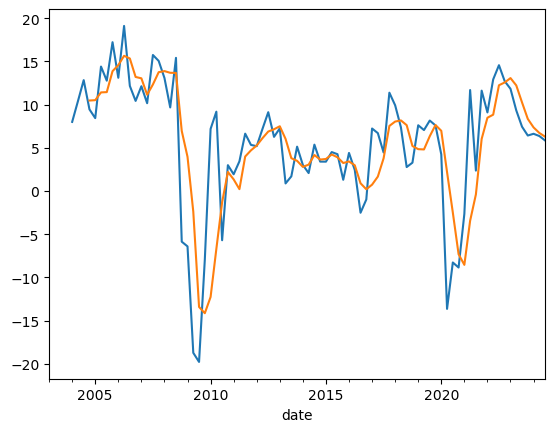

In [34]:
Ar['GDP_real_growth_1.0y'].plot()
Ar_avg['GDP_real_growth_avg_1.0y'].plot()
plt.show()

In [35]:
# generating inferred column
# calculate MPI
arm_data['MPI'] = arm_data['MP'].rolling(window=4, min_periods=1).sum()
arm_data['MPI_cumulative'] = arm_data['MP'].cumsum()

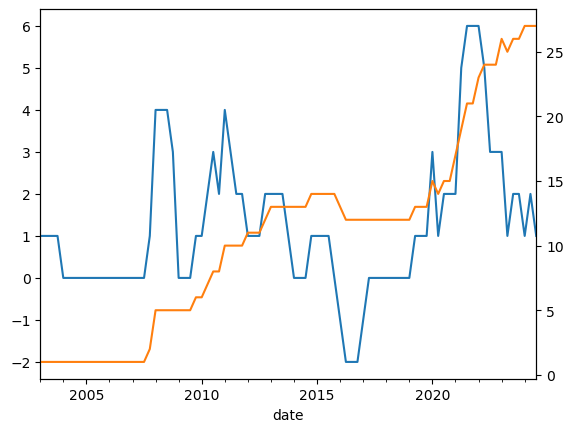

In [36]:
arm_data['MPI'].plot()
arm_data['MPI_cumulative'].plot(secondary_y=True)
plt.show()

In [37]:
X_raw = arm_data.iloc[:, 1:].copy()

# grouping columns based on origin
original_columns = list(X_raw.columns)
generated_sample = feature_engineering_pipeline.fit_transform(X_raw[[original_columns[0]]]).columns
col_lookup = re.compile(f"{original_columns[0]}", re.IGNORECASE)
generated_suffixes = [col_lookup.sub('', s) for s in generated_sample]
column_group_mapping = {c+s: c for s in generated_suffixes for c in original_columns}
column_groups = {c: [c+s for s in generated_suffixes] for c in original_columns}

# performing transformations
X_T = feature_engineering_pipeline.fit_transform(X_raw)

In [38]:
print(X_raw.columns)

Index(['Credit GDP ratio', 'Credit GDP gap', 'Total loans/GDP Y-o-Y',
       'Credit to smooth GDP gap', 'Consumer stock diff',
       'Mortgage stock diff', 'Corporate stock diff',
       'Property prices y-o-y growt rate', 'Credit spread: households',
       'Credit spread: non-financial corporations',
       'Trade account deficit/GDP', 'Short-term GB rate', 'Mid-term GB rate',
       'Long-term GB rate', 'Level', 'Steepness', 'Curvature', 'Bank RoE',
       'REER', 'VIX', 'Exchange rate', 'Liquidity excess', 'CAR excess',
       'Mortgage stock', 'Mortgage flow', 'Mortgage interest rate',
       'Construction loans', 'Real estate prices', 'DSTI', 'Trade balance',
       'Copper prices', 'CPI', 'Policy rate', 'Government debt',
       'Current account', 'Government expenditure', 'Unemployment rate',
       'MP_capital', 'MP_other', 'MP_T', 'MP_L', 'MP', 'MPI',
       'MPI_cumulative'],
      dtype='object')


,GDP_real_growth_1.0y,GDP_real_growth_hz_1.0y
Level_lag_1_log_PctC_2y,0.292574,0.264688
Level_lag_1_log_C_2y,0.288508,0.266755
Level_lag_1_normalized_C_2y,0.298790,0.235365
Level_lag_1_C_2y,0.298790,0.235365
Level_lag_1_PctC_2y,0.292813,0.239072
Level_smooth,0.320741,0.206471
Level_lag_1_smooth,0.319208,0.179380
Level_lag_1_log,0.334542,0.163307
Level_lag_3_log_PctC_1y,0.258952,0.237776
Level_log,0.316129,0.179503


GDP_real_growth_1.0y       0.302026
GDP_real_growth_hz_1.0y    0.139369
Name: Level, dtype: float64

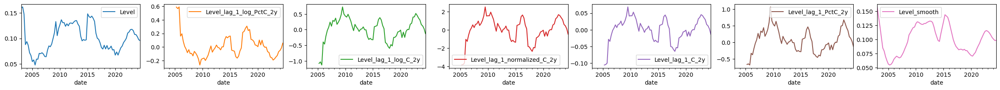

In [39]:
index = 14
v_name = list(column_groups.keys())[index]
v_series = X_T[list(column_groups.values())[index]]
var_data = pd.concat([Ar.iloc[:, 0], Y.iloc[:, 0], v_series], axis=1)
corr = var_data.corr().abs().iloc[2:, :2]
corr_best = corr.reindex(corr.mean(axis=1).sort_values(ascending=False).index).head(50)
display(corr_best)
display(corr.loc[v_name])
X_T[[v_name] + list(corr_best.index[:6])].plot(subplots=True, layout=(1, 7), figsize=(30, 2))
plt.show()

growth,GDP_real_growth_1.0y,GDP_real_growth_hz_1.0y
variable,,
Level_lag_1_log_PctC_2y,0.079,0.065
Level_lag_1_log_C_2y,0.078,0.066
Level_lag_1_log,0.096,0.040
Level_lag_1_normalized_C_2y,0.083,0.051
Level_lag_1_C_2y,0.083,0.051
Level_lag_1_PctC_2y,0.081,0.052
Level_smooth,0.078,0.055
Level_log,0.079,0.044
Level_lag_3_log_PctC_2y,0.082,0.040


growth
GDP_real_growth_1.0y       0.069470
GDP_real_growth_hz_1.0y    0.031731
Name: Level, dtype: float64

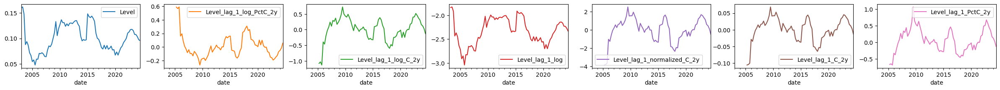

In [40]:
variable_performance = []
for v in v_series:
    for y_i, ar_i in [(Y, Ar), (Ar, Arr)]:
        y_v = y_i.iloc[:, 0]
        x_v = pd.concat([ar_i.iloc[:, 0], v_series[v]], axis=1)
        y_v = y_v.dropna()
        x_v = x_v.loc[y_v.index].dropna().copy()
        y_v = y_v.loc[x_v.index].copy()
        x_v = x_v.replace(np.inf, 0)
        model_ar = sm.OLS(y_v, sm.add_constant(x_v.iloc[:, [0]])).fit()
        model_v = sm.OLS(y_v, sm.add_constant(x_v)).fit()
        r2 = {'variable': v, 'growth': y_v.name, 'r2': model_v.rsquared - model_ar.rsquared}
        variable_performance.append(r2)
variable_performance = pd.DataFrame(variable_performance).pivot_table(values='r2', index='variable', columns='growth')
variable_pbest = variable_performance.reindex(variable_performance.mean(axis=1).sort_values(ascending=False).index).head(50)
display(variable_pbest.round(3))
display(variable_performance.loc[v_name])
X_T[[v_name] + list(variable_pbest.index[:6])].plot(subplots=True, layout=(1, 7), figsize=(30, 2))
plt.show()

In [41]:
consistent_columns = [
    'Credit GDP ratio_C_1y', 'Credit GDP gap',
    'Short-term GB rate', 'Mid-term GB rate',
    'Long-term GB rate', 'Level', 'Steepness',
    'Curvature', 'Bank RoE', 
    'REER', 'VIX',
    'Liquidity excess', 'CAR excess',
    'Mortgage stock_PctC_1y', 'Mortgage flow_PctC_1y',
    'Mortgage interest rate_lag_1_log', 'Construction loans_PctC_2y',
    'Real estate prices_PctC_1y', 'DSTI_C_2y', 'Exchange rate_PctC_1y',
    'Trade balance_lag_2', 'Copper prices_PctC_2y', 'CPI_PctC_1y',
    'Policy rate', 'Government debt_PctC_1y',
    'Current account_lag_3_normalized', 'Government expenditure_PctC_1y',
    'Unemployment rate_smooth_C_2y', 'MP', 'MPI'
]
# CAR excess_C_2y
# Mortgage stock_PctC_3y
# Mortgage flow_PctC_3y

X_selected = X_T[consistent_columns].copy()

# using base names for selected columns
X_selected = X_selected.rename(columns=column_group_mapping)
X_selected['CAR excess_C_2y'] = X_T['CAR excess_C_2y'].copy()

# Financial Cycle Index (FCyI)

In [42]:
col_order = [
    'Consumer stock diff', 'Mortgage stock diff', 'Corporate stock diff',
    'Property prices y-o-y growt rate', 'Total loans/GDP Y-o-Y',
    'Credit to smooth GDP gap', 'Trade account deficit/GDP',
    'Credit spread: households', 'Credit spread: non-financial corporations'
]
# selecting and sorting series
FCyI_data_raw = arm_data[col_order].copy()

# transformations
FCyI_data_ecdf = FCyI_data_raw.agg(ecdf_normalize)

In [43]:
# setup
contribution_names = [
    'Consumer flows', 'Mortgage flows', 'Corporate flows', 'REP growth rate',
    'Total loans GDP YoY', 'Credit to GDP gap', 'Trade account deficit/GDP',
    'Credit spread: households', 'Credit spread: NFC'
]
# initial covariance
Cov0 = np.array([
    [0.0846, 0.0348, 0.0112, -0.0103, 0.0506, 0.0808, 0.0650, 0.0076, 0.0170],
    [0.0348, 0.0846, 0.0600, -0.0297, -0.0015, 0.0189, 0.0044, 0.0681, 0.0591],
    [0.0112, 0.0600, 0.0846, -0.0557, 0.0001, 0.0044, -0.0089, 0.0686, 0.0676],
    [-0.0103, -0.0297, -0.0557, 0.0846, -0.0077, -0.0152, -0.0175, -0.0387, -0.0593],
    [0.0506, -0.0015, 0.0001, -0.0077, 0.0846, 0.0536, 0.0475, -0.0082, 0.0000],
    [0.0808, 0.0189, 0.0044, -0.0152, 0.0536, 0.0846, 0.0694, -0.0045, 0.0138],
    [0.0650, 0.0044, -0.0089, -0.0175, 0.0475, 0.0694, 0.0846, -0.0157, -0.0003],
    [0.0076, 0.0681, 0.0686, -0.0387, -0.0082, -0.0045, -0.0157, 0.0846, 0.0668],
    [0.0170, 0.0591, 0.0676, -0.0593, 0.0000, 0.0138, -0.0003, 0.0668, 0.0846]
])

# weights
w = np.array([0.2, 0.2, 0.05, 0.086, 0.08, 0.26, 0.048, 0.046,
              0.036])  # weights by paper

In [44]:
# FCyI ECDF
S_ecdf = FCyI_data_ecdf.copy()
S_w = np.array(w * S_ecdf)
Corr_ecdf, Corr_series = ewma(S_ecdf, Cov0, lam=0.94, med=0.5)
S_contribution = np.multiply(S_w, S_w @ np.ones(Corr_ecdf.shape[1:]))
S_contribution = pd.DataFrame(S_contribution, columns=contribution_names, index=S_ecdf.index)
fcyi = np.einsum('ij,ijk,ik->i', w * S_ecdf, Corr_ecdf, w * S_ecdf)
fcyi_p = np.einsum('ij,ijk,ik->i', w * S_ecdf, np.ones(Corr_ecdf.shape), w * S_ecdf)
Corr_contribution = pd.Series(fcyi - fcyi_p, index=FCyI_data_ecdf.index, name='Correlation contribution')
fcyi_smooth_ecdf = hpfilter(fcyi, lamb=0.5)[1]
fcyi_smooth_ecdf = pd.Series(fcyi_smooth_ecdf, index=FCyI_data_ecdf.index, name='Financial Cycle Index')
fcyi_data = pd.concat([fcyi_smooth_ecdf, S_contribution, Corr_contribution], axis=1)
fcyi_data.index = fcyi_data.index.to_period('Q').astype(str)

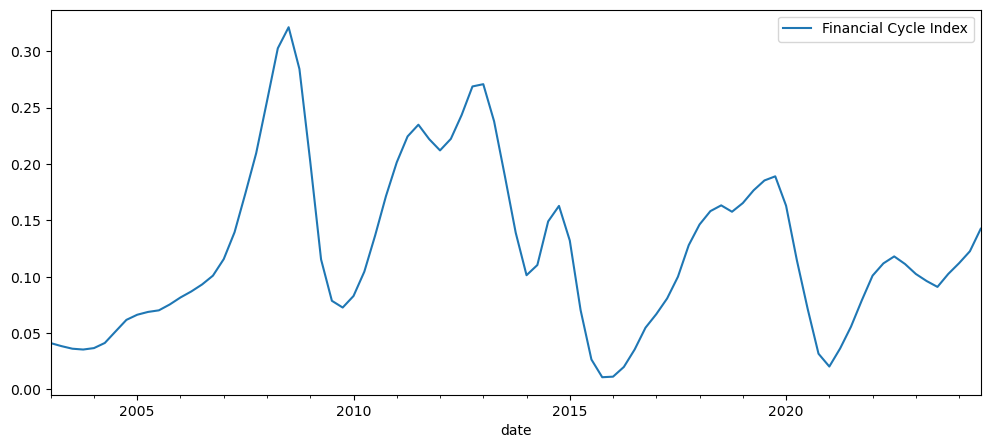

In [45]:
fig, ax = plt.subplots(figsize=(12, 5))
fcyi_smooth_ecdf.plot(ax=ax)
plt.legend()
plt.show()

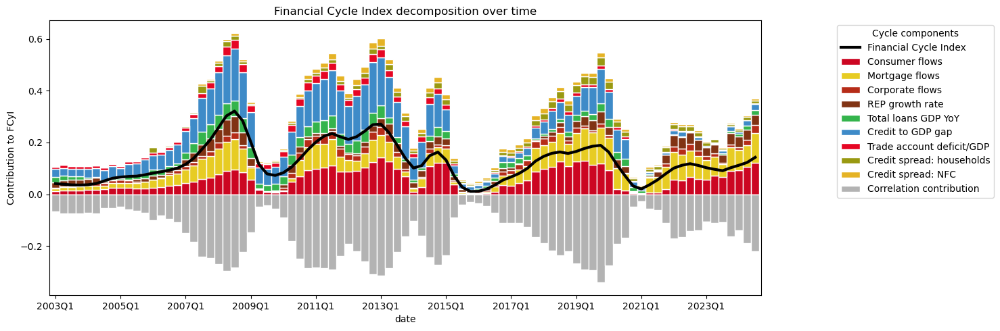

In [46]:
# plotting
fig, ax = plt.subplots(figsize=(15, 5))

# Define colormap and colors for the bar plot
colormap = cm.twilight_shifted
num_colors = fcyi_data.shape[1] - 1  # Assuming one column is 'Financial Cycle Index'
colors = ['#cc0622', '#e7cc23', '#b62c18', '#813314', '#34b44c',
          '#3e8bc8', '#e60624', '#999911', '#e5b325', '#b3b3b3']

# Plot the stacked bar chart
fcyi_data.iloc[:, 1:].plot(kind='bar', stacked=True, color=colors, ax=ax, legend=True, width=1, edgecolor='white')
ax.set_ylabel('Contribution to FCyI')
ax.set_xlabel('Time')
ax.set_xticks(range(0, len(fcyi_data.index), 8))

# Create a line plot
fcyi_data['Financial Cycle Index'].plot(kind='line', color='black', ax=ax, legend=True, lw=3)

# Adjust legend for each axis
ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1), title='Cycle components')
plt.title('Financial Cycle Index decomposition over time')
plt.tight_layout()
plt.savefig('../results/arm_FCyI_decomposition.png', bbox_inches='tight', dpi=300)
plt.show()

In [47]:
X_raw['Financial Cycle Index'] = fcyi_smooth_ecdf
X_selected['Financial Cycle Index'] = fcyi_smooth_ecdf

# make sure to add FCI to the search space
column_group_mapping['Financial Cycle Index'] = 'Financial Cycle Index'
column_groups['Financial Cycle Index'] = ['Financial Cycle Index']

# Financial Conditions Index (FCI)

In [48]:
# exog
exog_cols_fci = [
    # 'Level',
    'Steepness',
    # 'Curvature',
    'Short-term GB rate',
    'Mid-term GB rate',
    'Long-term GB rate',
    'Bank RoE',
    'REER',
    'VIX',
    # 'Mortgage interest rate',
]
# 'Short-term GB rate_lag_1_log', 'Mid-term GB rate_lag_1_log',
# 'Long-term GB rate_lag_1_log', 'Level_lag_1_log', 'Steepness_PctC_2y',
# 'Curvature_smooth_C_1y', 'Bank RoE_smooth',
# 'REER', 'VIX',
X_fci = X_selected[exog_cols_fci].copy()

# endog
endog_cols = ['CPI', 'Policy rate']
Y_fci = pd.concat([Ar.loc[:, 'GDP_real_growth_1.0y'], X_selected[endog_cols]], axis=1).copy()

In [49]:
X_fci_desc = X_fci.describe().T
X_fci_desc = X_fci_desc.apply(lambda x: x.round(3) if x.name != 'count' else x.astype(int))
display(X_fci_desc)

,count,mean,std,min,25%,50%,75%,max
Steepness,87,0.039,0.020,-0.008,0.027,0.039,0.056,0.074
Short-term GB rate,87,0.081,0.024,0.037,0.060,0.081,0.099,0.144
Mid-term GB rate,87,0.102,0.031,0.049,0.076,0.099,0.135,0.165
Long-term GB rate,87,0.120,0.031,0.054,0.097,0.116,0.154,0.186
Bank RoE,84,0.110,0.074,-0.044,0.066,0.097,0.155,0.326
REER,87,96.400,17.457,61.074,91.741,97.276,101.095,138.168
VIX,87,19.199,8.182,9.510,13.715,16.740,22.610,53.540


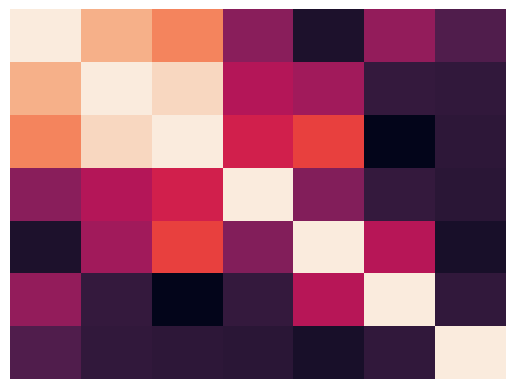

{0: ['Short-term GB rate',
  'Mid-term GB rate',
  'Long-term GB rate',
  'Bank RoE'],
 1: ['Steepness', 'REER', 'VIX']}

In [50]:
# clustering the X_fci columns
sil_scores = get_silhouette_scores(X_fci.corr().abs(), n_init=10)
best_k = max(sil_scores, key=sil_scores.get)
best_k = 2
kmeans = KMeans(n_clusters=best_k, n_init=10)
labels = kmeans.fit_predict(X_fci.corr().abs())
X_fci_col_order = np.argsort(labels)
X_fci_cm = {label: [X_fci.columns[i] for i, l in enumerate(labels) if l == label] for label in set(labels)}
sns.heatmap(X_fci.corr().abs().iloc[X_fci_col_order, X_fci_col_order], cbar=False, yticklabels=False, xticklabels=False)
plt.show()
display(X_fci_cm)

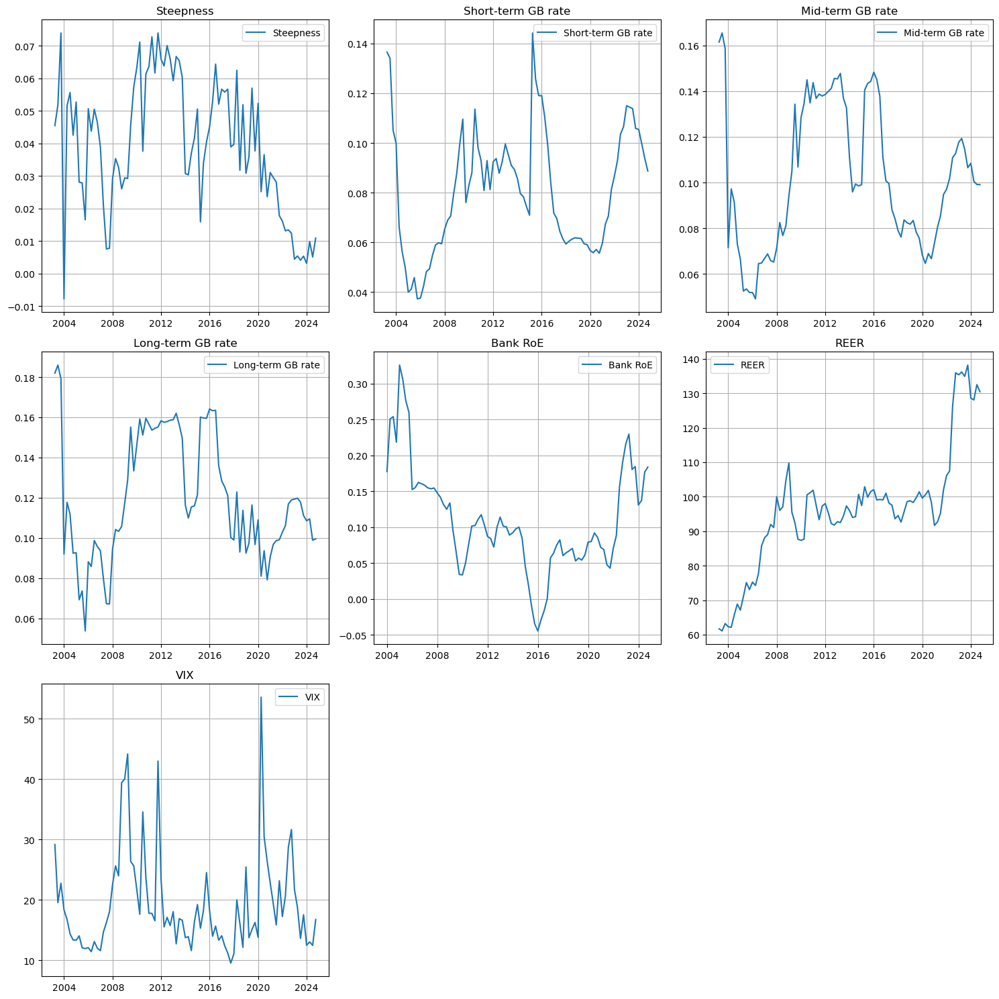

In [51]:
# Determine the layout
num_cols = 3
num_plots = X_fci.shape[1]
num_rows = int(np.ceil(num_plots / num_cols))

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5 * num_rows), sharex=False)
axes = axes.flatten()

# Plot each column in a subplot
for i, column in enumerate(X_fci.columns):
    axes[i].plot(X_fci.index, X_fci[column], label=column)
    axes[i].set_title(column)
    axes[i].legend()
    axes[i].grid(True)

# Hide unused subplots (if any)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [52]:
# transform data to emphasize periods of sharp changes
# funcs: ecdf_normalize, ApproxLog, cyclicalSin, cyclicalCos, smooth_series, dynamically_weighted_amplification
sharp_cols = ['Level', 'Short-term GB rate', 'Mid-term GB rate', 'Long-term GB rate']
X_fci_sharp = X_fci.copy()
for col in (set(sharp_cols) & set(X_fci_sharp.columns)):
    X_fci_sharp[col] = dynamically_weighted_amplification(X_fci_sharp[col], pct_periods=4)
# X_fci_sharp['Steepness'] = dynamically_weighted_amplification(X_fci_sharp['Steepness'], pct_periods=4)

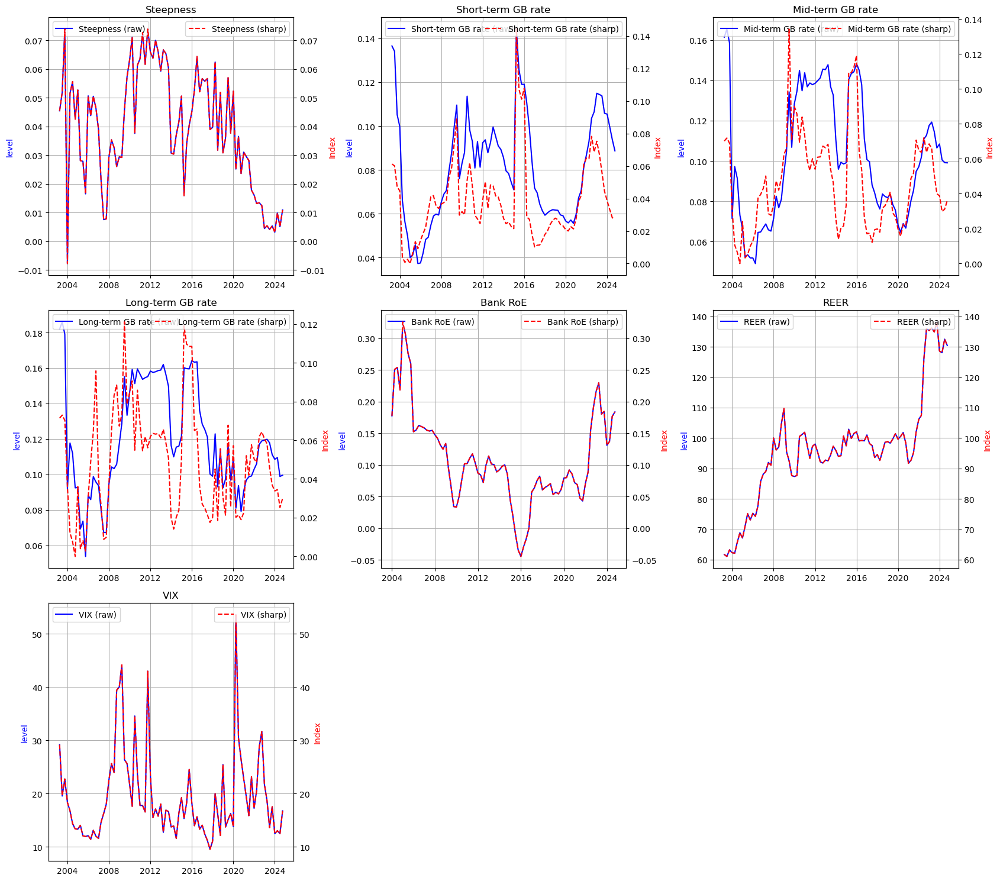

In [53]:
# Determine the layout
num_cols = 3
num_plots = X_fci.shape[1]
num_rows = int(np.ceil(num_plots / num_cols))

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(17, 5 * num_rows), sharex=False)
axes = axes.flatten()

# Plot each column in a subplot
for i, column in enumerate(X_fci.columns):
    ax1 = axes[i]  # Primary y-axis
    ax2 = ax1.twinx()  # Secondary y-axis

    # plot on primary y-axis
    ax1.plot(X_fci.index, X_fci[column], label=f"{column} (raw)", color="blue")
    ax1.set_ylabel("level", color="blue")

    # plot on secondary y-axis
    ax2.plot(X_fci_sharp.index, X_fci_sharp[column], label=f"{column} (sharp)", color="red", linestyle="--")
    ax2.set_ylabel("Index", color="red")

    ax1.set_title(column)
    ax1.grid(True)
    ax1.legend(loc="upper left")
    ax2.legend(loc="upper right")

# Hide unused subplots (if any)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

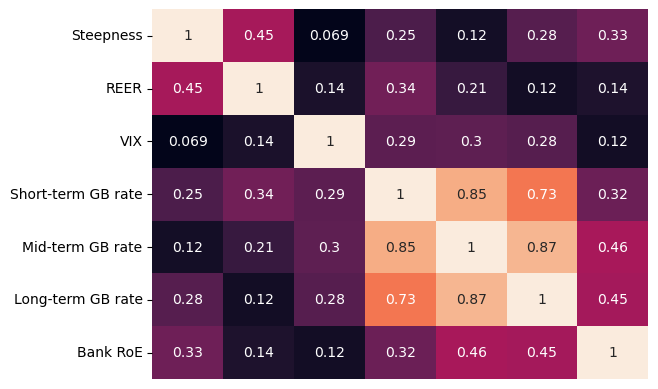

{0: ['Steepness', 'REER', 'VIX'],
 1: ['Short-term GB rate',
  'Mid-term GB rate',
  'Long-term GB rate',
  'Bank RoE']}

In [54]:
# clustering the X_fci columns
sil_scores = get_silhouette_scores(X_fci_sharp.corr().abs(), n_init=10)
best_k = max(sil_scores, key=sil_scores.get)
best_k = 2
kmeans = KMeans(n_clusters=best_k, n_init=10)
labels = kmeans.fit_predict(X_fci_sharp.corr().abs())
X_fci_sharp_col_order = np.argsort(labels)
X_fci_sharp_cm = {label: [X_fci_sharp.columns[i] for i, l in enumerate(labels) if l == label] for label in set(labels)}
sns.heatmap(X_fci_sharp.corr().abs().iloc[X_fci_sharp_col_order, X_fci_sharp_col_order], annot=True, cbar=False, yticklabels=True, xticklabels=False)
plt.show()
display(X_fci_sharp_cm)

In [55]:
# standardize data
ss = StandardScalerDF()
X_fci_st = ss.fit_transform(X_fci_sharp)
Y_fci_st = ss.fit_transform(Y_fci)

# fillna with 0
X_fci_st = X_fci_st.fillna(0)
Y_fci_st = Y_fci_st.fillna(0)

# standardize again for some reason
X_fci_st = ss.fit_transform(X_fci_st)
Y_fci_st = ss.fit_transform(Y_fci_st)

FCI using PCA

In [56]:
pca_model = PCA(n_components=1, svd_solver='full', tol=0,
                iterated_power='auto', n_oversamples=10,
                power_iteration_normalizer='auto',
                random_state=42)
pca_model.fit(X_fci_st)

# make sure to match the stress scenario with high FCI
n = X_fci_st.shape[1]
pca_loadings = pca_model.components_.T * np.sqrt(n)
is_fci_stress_crisis = (pca_loadings / n).reshape(-1) @ X_fci_st.loc['2009-09-30'] > 0
flip_fci = 1 if is_fci_stress_crisis else -1
pca_loadings = flip_fci * pca_loadings

# calculate series and contributions
fci_pca = (X_fci_st @ (pca_loadings / n)).squeeze().rename('fci_pca')
fci_contributions = (pca_loadings / n).T * X_fci_st
print('Explained Variance:', pca_model.explained_variance_ratio_[0].round(4))
print('Singular values:', pca_model.singular_values_[0].round(4))

Explained Variance: 0.4448
Singular values: 16.3644


FCI using the method by Doz, Giannone and Reichlin (2011)

In [57]:
t = Y_fci_st.shape[0]
YF = pd.concat([Y_fci_st, fci_pca], axis=1)
YX = pd.concat([Y_fci_st, X_fci_st], axis=1)
t, nvars = YX.shape
nlags = 4
nstates = YF.shape[1]
n_undefined_rows = nstates*(nlags-1)
nstates_doz = nstates*nlags

In [58]:
# measurement model
measurement_model = sm.OLS(YX, YF).fit()
L = np.array(measurement_model.params)
e = measurement_model.resid
measurement_sigma = np.diag(np.diag((e.T @ e) / t))
R = measurement_sigma + 1e-10*np.eye(nvars)
# sigma2 = np.diag((e**2).sum() / t)

# state model
lf = LagFeatures(periods=list(range(1, nlags+1)), drop_original=True)
yf_lags = lf.fit_transform(YF).dropna()
yf_lags_cov_inv = np.linalg.inv(yf_lags.T @ yf_lags)
yf = YF.loc[yf_lags.index].copy()
t = yf.shape[0]
state_model = sm.OLS(yf, yf_lags).fit()
T = np.array(state_model.params)
e = state_model.resid
sigmaf = (e.T @ e) / (t-1)
state_beta_var = np.kron(sigmaf, yf_lags_cov_inv)
bb = T.reshape(nstates, nlags, nstates).transpose(0, 2, 1).reshape(-1)

# state model as VAR
ar_identity = np.concatenate((np.eye(n_undefined_rows), np.zeros((n_undefined_rows, nstates))), axis=1)
T_doz = np.concatenate((T.T, ar_identity), axis=0)
Q_doz = np.concatenate((sigmaf, np.zeros((nstates, n_undefined_rows))), axis=1)
Q_doz = np.concatenate((Q_doz, np.zeros((n_undefined_rows, nstates_doz))), axis=0)

# drawing states from Kalman filter (smoothing)
S0 = np.zeros(nstates_doz)
P0 = 10*np.eye(nstates_doz)
S_draws = kalman_companion(YX, S0, P0, L, R, T_doz, Q_doz)
S_draws = pd.DataFrame(S_draws, index=YF.index, columns=YF.columns).rename(columns={'fci_pca': 'fci_doz'})
fci_doz = S_draws['fci_doz']

FCI using the method by Koop and Korobilis (2013)

In [59]:
# step 1: Update Parameters Conditional on PC
# the  decays include:
# 1) decay factor for measurement error variance
# 2) decay factor for factor error variance
# 3) decay factor for loadings error variance
# 4) decay factor for VAR coefficients error variance
decays = np.array([0.96, 0.96, 0.99, 0.99])
nfactors = 1
nlags = 4
nstates = YF.shape[1]
nmacro = nstates - nfactors
t, nvars = YX.shape
nstates_all = nstates*nlags
nVAR = nlags*(nstates**2)  # number of VAR parameters

# Priors
priors = {}

# initial condition on the factors
priors['factor_0_mean'] = np.zeros(nstates_all)
priors['factor_0_var'] = 10*np.eye(nstates_all)

# initial condition on lambda_t
priors['lambda_0_mean'] = np.zeros((nvars, nstates))
priors['lambda_0_var'] = 1*np.eye(nstates)

# initial condition on beta_t
gamma = 0.1
b_prior, Vb_prior = Minn_prior_KOOP(gamma, nstates, nlags, nVAR)  # Obtain a Minnesota-type prior
priors['beta_0_mean'] = b_prior
priors['beta_0_var'] = Vb_prior

# initial condition on the covariance matrices
priors['V_0'] = 0.1*np.eye(nvars)
priors['V_0'][:nmacro, :nmacro] = 0
priors['Q_0'] = 0.1*np.eye(nstates)

In [60]:
tvp_favar_korobilis = TVP_FAVAR(YX, YF, nlags, nfactors)
beta_t, beta_new, lambda_t, V_t, Q_t = tvp_favar_korobilis.fit(decays, priors)
factor_new, Sf_t_new = tvp_favar_korobilis.gen_factors(priors)
S_knk = pd.DataFrame(factor_new, index=YF.index, columns=YF.columns).rename(columns={'fci_pca': 'fci_knk'})
fci_knk = S_knk['fci_knk'].copy()
fci_data = pd.concat([fci_knk.rename('Financial Conditions Index'), fci_contributions], axis=1)
fci_data.index = fci_data.index.to_period('Q').astype(str)

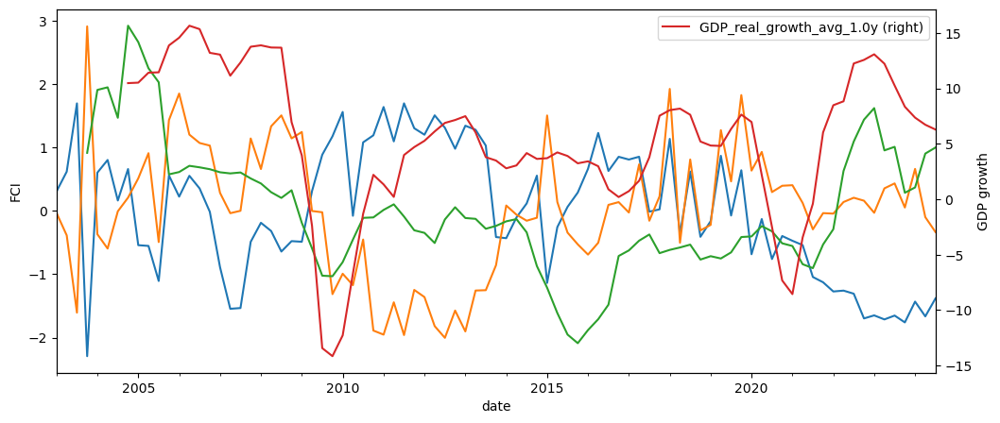

In [61]:
fig, ax = plt.subplots(figsize=(12, 5))
ss.fit_transform(X_selected['Steepness']).plot(ax=ax)
ss.fit_transform(X_selected['Curvature']).plot(ax=ax)
ss.fit_transform(X_selected['Bank RoE']).plot(ax=ax)
plt.ylabel("FCI")
Ar_avg['GDP_real_growth_avg_1.0y'].plot(secondary_y=True, ax=ax)
plt.ylabel("GDP growth")
plt.legend()
plt.show()

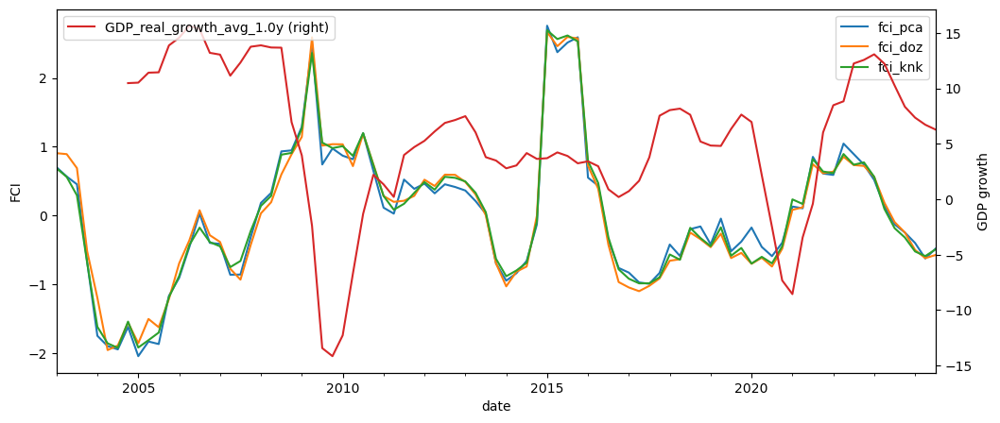

In [62]:
fig, ax = plt.subplots(figsize=(12, 5))
ss.fit_transform(fci_pca).plot(ax=ax)
ss.fit_transform(fci_doz).plot(ax=ax)
ss.fit_transform(fci_knk).plot(ax=ax)
plt.ylabel("FCI")
plt.legend()
Ar_avg['GDP_real_growth_avg_1.0y'].plot(secondary_y=True, ax=ax)
plt.ylabel("GDP growth")
plt.legend(loc='upper left')
# plt.savefig('../results/FCI-Armenia.png', bbox_inches='tight', dpi=300)
plt.show()

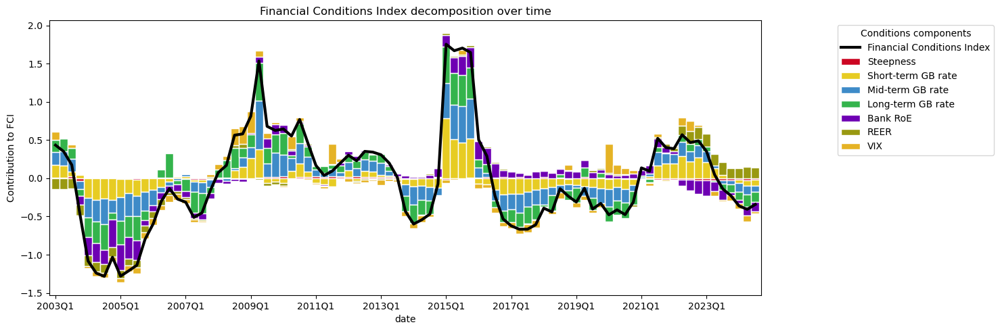

In [63]:
# plotting
fig, ax = plt.subplots(figsize=(15, 5))

# Define colormap and colors for the bar plot
colormap = cm.twilight_shifted
num_colors = fci_data.shape[1] - 1
colors = ['#cc0622', '#e7cc23', '#3e8bc8', '#34b44c',
          '#6e00b3', '#999911', '#e5b325']

# Plot the stacked bar chart
fci_data.iloc[:, 1:].plot(kind='bar', stacked=True, color=colors, ax=ax, legend=True, width=1, edgecolor='white')
ax.set_ylabel('Contribution to FCI')
ax.set_xlabel('Time')
ax.set_xticks(range(0, len(fci_data.index), 8))

# Create a line plot
fci_data['Financial Conditions Index'].plot(kind='line', color='black', ax=ax, legend=True, lw=3)

# Adjust legend for each axis
ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1), title='Conditions components')
plt.title('Financial Conditions Index decomposition over time')
plt.tight_layout()
plt.savefig('../results/arm_FCI_decomposition.png', bbox_inches='tight', dpi=300)
plt.show()

In [64]:
endog_fci_test = Ar['GDP_real_growth_1.0y']
ar = endog_fci_test.shift(4)
exog_fci_test = sm.add_constant(pd.concat([ar, fci_knk], axis=1).dropna())
endog_fci_test = endog_fci_test.loc[exog_fci_test.index]
qr_tail = sm.QuantReg(endog_fci_test, exog_fci_test).fit(q=0.1, max_iter=1000)
print('Psudo-rsquared:', qr_tail.prsquared)

Psudo-rsquared: 0.1123323545208258


In [65]:
X_raw['Financial Conditions Index'] = fci_knk
X_selected['Financial Conditions Index'] = fci_knk

# make sure to add FCI to the search space
column_group_mapping['Financial Conditions Index'] = 'Financial Conditions Index'
column_groups['Financial Conditions Index'] = ['Financial Conditions Index']

# Macroeconomic Indicator

In [66]:
macro_columns = [
    'Exchange rate', 'Trade balance', 'Copper prices', 'CPI', 'Policy rate',
    'Government debt', 'Current account', 'Government expenditure',
    'Unemployment rate'
]
X_macro_raw = X_selected[macro_columns].copy()
y_macro_raw = Ar.loc[:, 'GDP_real_growth_1.0y'].copy()
ar_macro = Arr.loc[:, 'GDP_real_growth_1.0y'].rename('autoregressive').copy()
macro_data = pd.concat([y_macro_raw, X_macro_raw], axis=1).copy()
y_macro = y_macro_raw.dropna().copy()
X_macro = pd.concat([ar_macro, X_macro_raw], axis=1).loc[y_macro.index].dropna().copy()
y_macro = y_macro.loc[X_macro.index].copy()

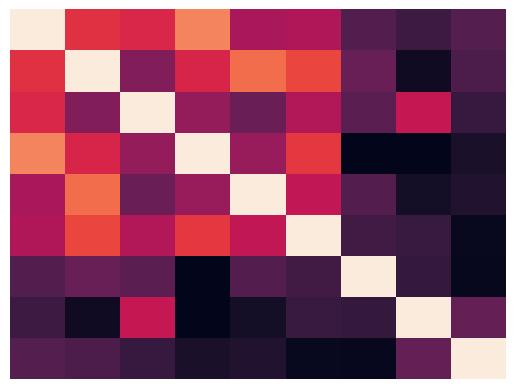

In [67]:
# clustering the X_fci columns
sil_scores = get_silhouette_scores(X_macro_raw.corr().abs(), n_init=10)
best_k = max(sil_scores, key=sil_scores.get)
best_k = 2
kmeans = KMeans(n_clusters=best_k, n_init=10)
labels = kmeans.fit_predict(X_macro_raw.corr().abs())
X_macro_col_order = np.argsort(labels)
X_macro_cm = {label: [X_macro_raw.columns[i] for i, l in enumerate(labels) if l == label] for label in set(labels)}
sns.heatmap(X_macro_raw.corr().abs().iloc[X_macro_col_order, X_macro_col_order], cbar=False, 
            yticklabels=False, xticklabels=False)
plt.show()

In [68]:
display(X_macro[X_macro_cm[0]].corr())

,Exchange rate,Trade balance,Copper prices,Government debt,Current account,Unemployment rate
Exchange rate,1.000000,-0.567137,-0.551531,0.746190,-0.417577,0.444468
Trade balance,-0.567137,1.000000,0.340293,-0.520777,0.691163,-0.625036
Copper prices,-0.551531,0.340293,1.000000,-0.385149,0.287276,-0.453167
Government debt,0.746190,-0.520777,-0.385149,1.000000,-0.374043,0.591542
Current account,-0.417577,0.691163,0.287276,-0.374043,1.000000,-0.487497
Unemployment rate,0.444468,-0.625036,-0.453167,0.591542,-0.487497,1.000000


In [69]:
display(X_macro[X_macro_cm[1]].corr())

,CPI,Policy rate,Government expenditure
CPI,1.000000,0.172998,-0.052675
Policy rate,0.172998,1.000000,-0.240330
Government expenditure,-0.052675,-0.240330,1.000000


In [70]:
display(macro_data.corr().iloc[:, 0])

GDP_real_growth_1.0y      1.000000
Exchange rate            -0.623053
Trade balance             0.562897
Copper prices             0.499146
CPI                       0.120866
Policy rate              -0.072330
Government debt          -0.614145
Current account           0.477723
Government expenditure    0.234265
Unemployment rate        -0.530282
Name: GDP_real_growth_1.0y, dtype: float64

R2: 0.5193293639444383


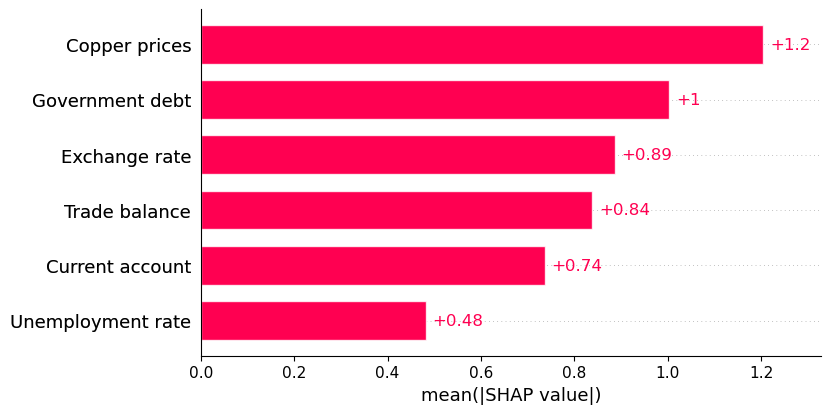

In [71]:
# fit a linear regression model
select_largest_set = np.argmax(list(map(len, X_macro_cm.values())))
X_macro_input = X_macro[X_macro_cm[select_largest_set]].copy()

macro_model = LinearRegression().fit(X_macro_input, y_macro)
print('R2:', macro_model.score(X_macro_input, y_macro))

# compute the SHAP values for the linear model
explainer = shap.Explainer(macro_model.predict, X_macro_input)
shap_values = explainer(X_macro_input)
shap.plots.bar(shap_values, max_display=11)

variable
Exchange rate             0.379
Government debt           0.356
Trade balance             0.296
Unemployment rate         0.277
Copper prices             0.239
Current account           0.207
Government expenditure    0.067
CPI                       0.014
Policy rate               0.002
Name: r2, dtype: float64

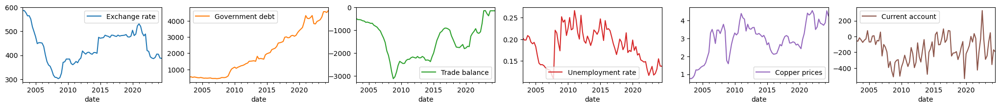

In [72]:
variable_performance = []
for v in X_macro_raw.columns:
    model_ar = sm.OLS(y_macro, sm.add_constant(X_macro.loc[:, ['autoregressive']])).fit()
    model_v = sm.OLS(y_macro, sm.add_constant(X_macro.loc[:, ['autoregressive', v]])).fit()
    r2 = {'variable': v, 'r2': model_v.rsquared - model_ar.rsquared}
    variable_performance.append(r2)
variable_performance = pd.DataFrame(variable_performance).set_index('variable')['r2']
variable_pbest = variable_performance.reindex(variable_performance.sort_values(ascending=False).index)
display(variable_pbest.round(3))
X_T[list(variable_pbest.index[:6])].plot(subplots=True, layout=(1, 7), figsize=(30, 2))
plt.show()

In [73]:
# macro data reset
X_macro = X_selected[macro_columns].copy()
ar_macro = Arr.loc[:, 'GDP_real_growth_1.0y'].rename('autoregressive').copy()
X_macro = pd.concat([ar_macro, X_macro], axis=1)
y_macro = Ar.loc[:, 'GDP_real_growth_1.0y'].copy()

Principal component analysis

In [74]:
# standardize data
ss = StandardScalerDF()
pca_selected_columns = [
    'Exchange rate', 'Trade balance', 'Copper prices',
    'Current account', 'Unemployment rate', 'Government debt',
    # 'Government expenditure', 'CPI', 'Policy rate',
    # 'autoregressive'
]
X_macro_st = ss.fit_transform(X_macro[pca_selected_columns])
Y_macro_st = ss.fit_transform(y_macro)

# fillna with 0
X_macro_st = X_macro_st.fillna(0)
Y_macro_st = Y_macro_st.fillna(0)

# standardize again for some reason
X_macro_st = ss.fit_transform(X_macro_st)
Y_macro_st = ss.fit_transform(Y_macro_st)

In [75]:
is_fci_stress_crisis = (pca_loadings / n).reshape(-1) @ X_fci_st.loc['2009-09-30'] > 0
flip_fci = 1 if is_fci_stress_crisis else -1
pca_loadings = flip_fci * pca_loadings

# calculate series and contributions
fci_pca = (X_fci_st @ (pca_loadings / n)).squeeze().rename('fci_pca')
fci_contributions = (pca_loadings / n).T * X_fci_st

In [76]:
pca_macro_model = PCA(n_components=1, svd_solver='full', tol=0,
                      iterated_power='auto', n_oversamples=10,
                      power_iteration_normalizer='auto',
                      random_state=42)
pca_macro_model.fit(X_macro_st)
n = X_macro_st.shape[1]
pca_loadings = pca_macro_model.components_.T * np.sqrt(n)
is_macro_crisis = (pca_loadings / n).reshape(-1) @ X_macro_st.loc['2009-09-30'] < 0
flip_macro = 1 if is_macro_crisis else -1
pca_loadings = flip_macro * pca_loadings
macro_pca = (X_macro_st @ (pca_loadings / n)).squeeze().rename('macro_pca')
print('Explained Variance:', pca_macro_model.explained_variance_ratio_[0].round(4))
print('Singular values:', pca_macro_model.singular_values_[0].round(4))

Explained Variance: 0.5834
Singular values: 17.3504


Linear Discriminant Analysis

In [77]:
lda_selected_columns = [
    'Exchange rate', 'Trade balance', 'Copper prices',
    'Current account', 'Unemployment rate', 'Government debt',
    # 'Government expenditure', 'CPI', 'Policy rate',
    # 'autoregressive'
]
X_macro_st = ss.fit_transform(X_macro[lda_selected_columns])
Y_macro_st = ss.fit_transform(y_macro)

# fillna with 0
X_macro_st = X_macro_st.fillna(0)
Y_macro_st = Y_macro_st.fillna(0)

# standardize again for some reason
X_macro_st = ss.fit_transform(X_macro_st)
Y_macro_st = ss.fit_transform(Y_macro_st)

In [78]:
quantile_cutoff = 0.15
y_macro_crisis = (y_macro <= y_macro.quantile(quantile_cutoff)).astype(int)
lda_macro_model = LinearDiscriminantAnalysis(solver='svd', shrinkage=None, 
                                             priors=None, n_components=1, 
                                             store_covariance=False, tol=0.0001,
                                             covariance_estimator=None)
lda_macro_model.fit(X_macro_st, y_macro_crisis)
lda_loadings = lda_macro_model.coef_.T * np.sqrt(n)
is_macro_crisis = (lda_loadings / n).reshape(-1) @ X_macro_st.loc['2009-09-30'] < 0
flip_macro = 1 if is_macro_crisis else -1
lda_loadings = flip_macro * lda_loadings
macro_lda = (X_macro_st @ (lda_loadings / n)).squeeze().rename('macro_lda')

Partial Least Squares

In [79]:
pls_selected_columns = [
    'Exchange rate', 'Trade balance', 'Copper prices',
    'Current account', 'Unemployment rate', 'Government debt',
    'Government expenditure', 'CPI', 'Policy rate',
    # 'autoregressive'
]
X_macro_st = ss.fit_transform(X_macro[pls_selected_columns])
Y_macro_st = ss.fit_transform(y_macro)

# fillna with 0
X_macro_st = X_macro_st.fillna(0)
Y_macro_st = Y_macro_st.fillna(0)

# standardize again for some reason
X_macro_st = ss.fit_transform(X_macro_st)
Y_macro_st = ss.fit_transform(Y_macro_st)

In [80]:
pls1_macro_model = PLSRegression(n_components=1, scale=True,
                                 max_iter=500, tol=1e-06)
pls1_macro_model.fit(X_macro_st, Y_macro_st)
pls_loadings = pls1_macro_model.coef_.copy() * np.sqrt(n)
is_macro_crisis = (pls_loadings / n).reshape(-1) @ X_macro_st.loc['2009-09-30'] < 0
flip_macro = 1 if is_macro_crisis else -1
pls_loadings = flip_macro * pls_loadings
macro_pls = (X_macro_st @ (pls_loadings / n)).squeeze().rename('macro_pls')
macro_contributions = (pls_loadings / n).T * X_macro_st
macro_indicator_data = pd.concat([macro_pls.rename('Macroeconomic Indicator'), macro_contributions], axis=1)
macro_indicator_data.index = macro_indicator_data.index.to_period('Q').astype(str)

/Users/victoryerz/anaconda3/lib/python3.11/site-packages/sklearn/cross_decomposition/_pls.py:503: FutureWarning: The attribute `coef_` will be transposed in version 1.3 to be consistent with other linear models in scikit-learn. Currently, `coef_` has a shape of (n_features, n_targets) and in the future it will have a shape of (n_targets, n_features).
  warnings.warn(


Factor-Augmented Vector Autoregressive Regression (FAVAR, order=1, error=1)

In [81]:
# macro reset
X_macro_raw = X_selected[macro_columns].copy()
y_macro_raw = Ar.loc[:, 'GDP_real_growth_1.0y'].copy()
ar_macro = Arr.loc[:, 'GDP_real_growth_1.0y'].rename('autoregressive').copy()
macro_data = pd.concat([y_macro_raw, X_macro_raw], axis=1).copy()
y_macro = y_macro_raw.dropna().copy()
X_macro = pd.concat([ar_macro, X_macro_raw], axis=1).loc[y_macro.index].dropna().copy()
y_macro = y_macro.loc[X_macro.index].copy()

In [82]:
favar_macro_endog = pd.concat([y_macro, X_macro.drop(columns='autoregressive')], axis=1)
favar_macro_model = sm.tsa.DynamicFactor(favar_macro_endog, k_factors=1, factor_order=1, error_order=1)
initial_res = favar_macro_model.fit(method='powell', disp=False)
favar_macro_model_res = favar_macro_model.fit(initial_res.params, disp=False)
macro_favar = pd.Series(favar_macro_model_res.factors.filtered[0], index=y_macro.index, name='macro_favar')
is_macro_crisis = macro_favar.loc['2009-09-30'] < 0
flip_macro = 1 if is_macro_crisis else -1
macro_favar = flip_macro*macro_favar

/Users/victoryerz/anaconda3/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency Q-DEC will be used.
  self._init_dates(dates, freq)


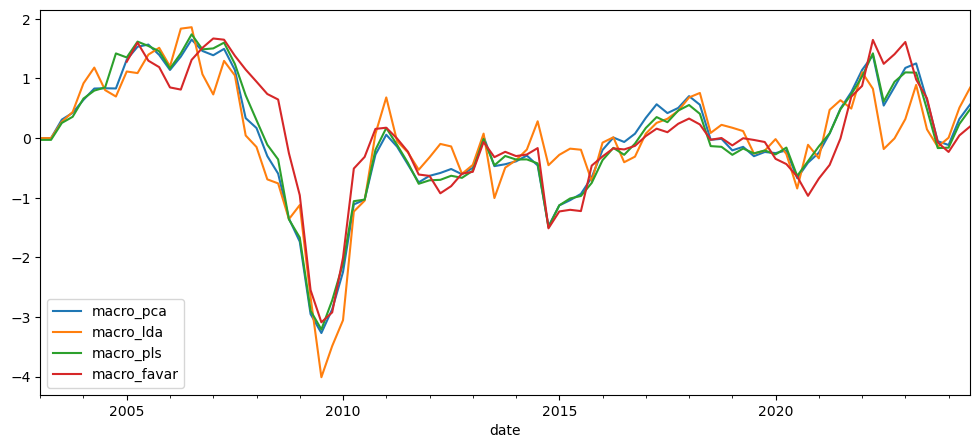

In [83]:
fig, ax = plt.subplots(figsize=(12, 5))
ss.fit_transform(macro_pca).plot(ax=ax)
ss.fit_transform(macro_lda).plot(ax=ax)
ss.fit_transform(macro_pls).plot(ax=ax)
ss.fit_transform(macro_favar).plot(ax=ax)
plt.legend()
plt.show()

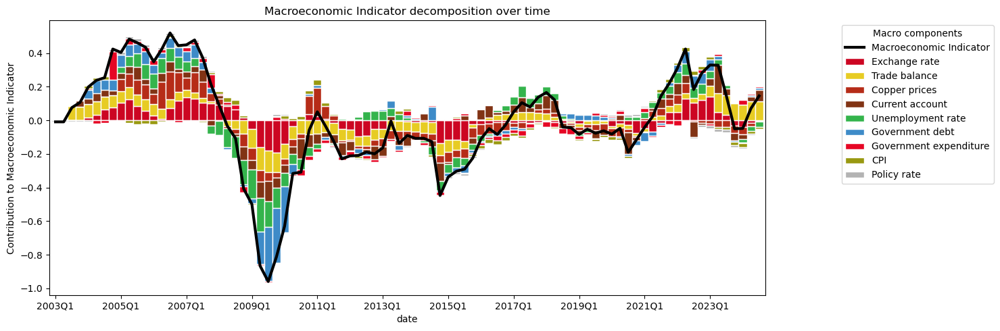

In [84]:
# plotting
fig, ax = plt.subplots(figsize=(15, 5))

# Define colormap and colors for the bar plot
colormap = cm.twilight_shifted
num_colors = macro_indicator_data.shape[1] - 1  # Assuming one column is 'Financial Cycle Index'
colors = ['#cc0622', '#e7cc23', '#b62c18', '#813314', '#34b44c',
          '#3e8bc8', '#e60624', '#999911', '#b3b3b3']

# Plot the stacked bar chart
macro_indicator_data.iloc[:, 1:].plot(kind='bar', stacked=True, color=colors, ax=ax, legend=True, width=1, edgecolor='white')
ax.set_ylabel('Contribution to Macroeconomic Indicator')
ax.set_xlabel('Time')
ax.set_xticks(range(0, len(fcyi_data.index), 8))

# Create a line plot
macro_indicator_data['Macroeconomic Indicator'].plot(kind='line', color='black', ax=ax, legend=True, lw=3)

# Adjust legend for each axis
ax.legend(loc='upper left', bbox_to_anchor=(1.1, 1), title='Macro components')
plt.title('Macroeconomic Indicator decomposition over time')
plt.tight_layout()
plt.savefig('../results/arm_MI_decomposition.png', bbox_inches='tight', dpi=300)
plt.show()

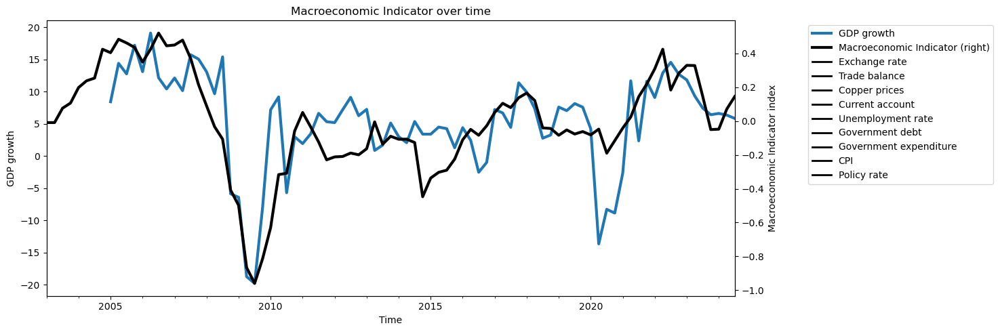

In [85]:
# plotting
fig, ax = plt.subplots(figsize=(15, 5))

# Create a line plot
y_macro.plot(legend=True, lw=3, label='GDP growth', ax=ax)
macro_pls.rename('Macroeconomic Indicator').plot(kind='line', color='black', secondary_y=True, legend=True, lw=3, ax=ax)
ax.set_ylabel('GDP growth')
ax.right_ax.set_ylabel('Macroeconomic Indicator index')
ax.set_xlabel('Time')

# Create custom legend entries (without adding actual lines to the plot)
macro_comps = list(macro_indicator_data.columns[1:])
custom_legend = []
for c in macro_comps:
    custom_line = Line2D([0], [0], color='black', lw=2, label=c)
    custom_legend.append(custom_line)

# Adjust legend for each axis
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax.right_ax.get_legend_handles_labels()
ax.legend(lines + lines2 + custom_legend, labels + labels2 + macro_comps, loc='upper left', bbox_to_anchor=(1.1, 1))
plt.title('Macroeconomic Indicator over time')
plt.tight_layout()
plt.savefig('../results/arm_MI_and_GDP.png', bbox_inches='tight', dpi=300)
plt.show()

In [86]:
macro_estimates = pd.concat([X_macro['autoregressive'], macro_pca, macro_lda, macro_pls, macro_favar], axis=1).dropna()
macro_comparison = pd.concat([y_macro, macro_estimates], axis=1)
macro_comparison.corr()

,GDP_real_growth_1.0y,autoregressive,macro_pca,macro_lda,macro_pls,macro_favar
GDP_real_growth_1.0y,1.000000,0.106368,0.713724,0.674059,0.730034,0.738837
autoregressive,0.106368,1.000000,0.270556,0.222774,0.284847,0.320351
macro_pca,0.713724,0.270556,1.000000,0.923397,0.994514,0.927947
macro_lda,0.674059,0.222774,0.923397,1.000000,0.911772,0.805865
macro_pls,0.730034,0.284847,0.994514,0.911772,1.000000,0.943871
macro_favar,0.738837,0.320351,0.927947,0.805865,0.943871,1.000000


In [87]:
variable_performance = []
for v in macro_estimates.columns[1:]:
    model_ar = sm.OLS(y_macro, sm.add_constant(macro_estimates.loc[:, ['autoregressive']])).fit()
    model_v = sm.OLS(y_macro, sm.add_constant(macro_estimates.loc[:, ['autoregressive', v]])).fit()
    r2 = {'variable': v, 'r2': model_v.rsquared - model_ar.rsquared}
    variable_performance.append(r2)
variable_performance = pd.DataFrame(variable_performance).set_index('variable')['r2']
variable_pbest = variable_performance.reindex(variable_performance.sort_values(ascending=False).index)
display(variable_pbest.round(3))

variable
macro_favar    0.553
macro_pls      0.533
macro_pca      0.506
macro_lda      0.445
Name: r2, dtype: float64

In [88]:
variable_performance = []
for v in macro_estimates.columns[1:]:
    # median model
    model_ar_med = sm.QuantReg(y_macro, sm.add_constant(macro_estimates.loc[:, ['autoregressive']])).fit(q=0.5)
    model_v_med = sm.QuantReg(y_macro, sm.add_constant(macro_estimates.loc[:, ['autoregressive', v]])).fit(q=0.5)
    r2_diff_med = model_v_med.prsquared - model_ar_med.prsquared

    # tail model
    model_ar_tail = sm.QuantReg(y_macro, sm.add_constant(macro_estimates.loc[:, ['autoregressive']])).fit(q=0.15)
    model_v_tail = sm.QuantReg(y_macro, sm.add_constant(macro_estimates.loc[:, ['autoregressive', v]])).fit(q=0.15)
    r2_diff_tail = model_v_tail.prsquared - model_ar_tail.prsquared

    # saving results
    r2 = {'variable': v, 'r2_median': r2_diff_med, 'r2_tail': r2_diff_tail}
    variable_performance.append(r2)
variable_performance = pd.DataFrame(variable_performance).set_index('variable')
variable_pbest = variable_performance.reindex(variable_performance.mean(axis=1).sort_values(ascending=False).index)
display(variable_pbest.round(3))

,r2_median,r2_tail
variable,,
macro_favar,0.276,0.445
macro_pls,0.265,0.422
macro_pca,0.238,0.425
macro_lda,0.203,0.413


In [89]:
X_raw['Macroeconomic Indicator'] = macro_pls
X_selected['Macroeconomic Indicator'] = macro_pls

# make sure to add MI to the search space
column_group_mapping['Macroeconomic Indicator'] = 'Macroeconomic Indicator'
column_groups['Macroeconomic Indicator'] = ['Macroeconomic Indicator']

# Dataset overview

In [90]:
col_order = [
    'Financial Cycle Index', 'Credit GDP ratio', 'Credit GDP gap',
    'Financial Conditions Index', 'Short-term GB rate', 'Mid-term GB rate',
    'Long-term GB rate', 'Level', 'Steepness', 'Curvature', 'Bank RoE',
    'Liquidity excess', 'CAR excess', 'CAR excess_C_2y', 'Mortgage stock',
    'Mortgage flow', 'Mortgage interest rate', 'Construction loans',
    'Real estate prices', 'DSTI', 'Macroeconomic Indicator', 'Exchange rate',
    'Trade balance', 'Copper prices', 'CPI', 'Policy rate', 'Government debt',
    'Current account', 'Government expenditure', 'Unemployment rate', 'MP',
    'MPI'
]
drop_intermediate_variables = [
    'Credit GDP ratio', 'Credit GDP gap', 'Short-term GB rate',
    'Mid-term GB rate', 'Long-term GB rate', 'Level', 'Steepness', 'Curvature',
    'Bank RoE', 'CAR excess_C_2y', 'Exchange rate', 'Trade balance',
    'Copper prices', 'CPI', 'Policy rate', 'Government debt', 'Current account',
    'Government expenditure', 'Unemployment rate'
]

main_important_cols = [
    'Financial Cycle Index', 'Financial Conditions Index', 'CAR excess',
    'Macroeconomic Indicator', 'MPI'
]

# reorder and drop columns from FCI
arm_dataset = X_selected[col_order].copy()
arm_dataset = arm_dataset.drop(columns=drop_intermediate_variables)
arm_dataset = pd.concat([Ar.loc[:, 'GDP_real_growth_1.0y'], arm_dataset],
                        axis=1)
arm_dataset_desc = arm_dataset.describe().T
arm_dataset_desc = arm_dataset_desc.apply(
    lambda x: x.round(2) if x.name != 'count' else x.astype(int))

In [91]:
display(arm_dataset_desc)
# arm_dataset_desc.to_excel('../results/arm_dataset_desc.xlsx')
# print(arm_dataset_desc[['count', 'mean', 'std', 'min', '50%', 'max']].to_latex())

,count,mean,std,min,25%,50%,75%,max
GDP_real_growth_1.0y,83,5.64,7.38,-19.79,3.00,6.69,10.27,19.10
Financial Cycle Index,87,0.12,0.07,0.01,0.07,0.11,0.17,0.32
Financial Conditions Index,87,-0.02,0.66,-1.28,-0.45,-0.13,0.37,1.75
Liquidity excess,87,0.18,0.07,0.09,0.12,0.16,0.21,0.35
CAR excess,87,0.10,0.06,0.02,0.05,0.06,0.15,0.23
Mortgage stock,72,0.34,0.37,-0.01,0.11,0.23,0.36,1.64
Mortgage flow,72,0.37,0.56,-0.77,-0.01,0.21,0.58,1.64
Mortgage interest rate,64,-2.11,0.13,-2.29,-2.23,-2.10,-2.07,-1.63
Construction loans,77,0.69,0.65,-0.11,0.29,0.55,0.77,3.01
Real estate prices,81,0.08,0.12,-0.15,0.00,0.06,0.14,0.38


In [92]:
corr = arm_dataset.corr()
corr_target = corr.iloc[0]
corr_target = corr_target.loc[corr_target.abs().sort_values(ascending=False).index]
display(corr_target)

GDP_real_growth_1.0y          1.000000
Macroeconomic Indicator       0.733561
Mortgage flow                 0.655645
Real estate prices            0.645380
Mortgage stock                0.458968
DSTI                         -0.408745
Liquidity excess              0.405529
Financial Conditions Index   -0.334918
Mortgage interest rate       -0.290147
CAR excess                    0.262460
Construction loans           -0.118789
MPI                           0.100952
Financial Cycle Index         0.087870
MP                            0.056298
Name: GDP_real_growth_1.0y, dtype: float64

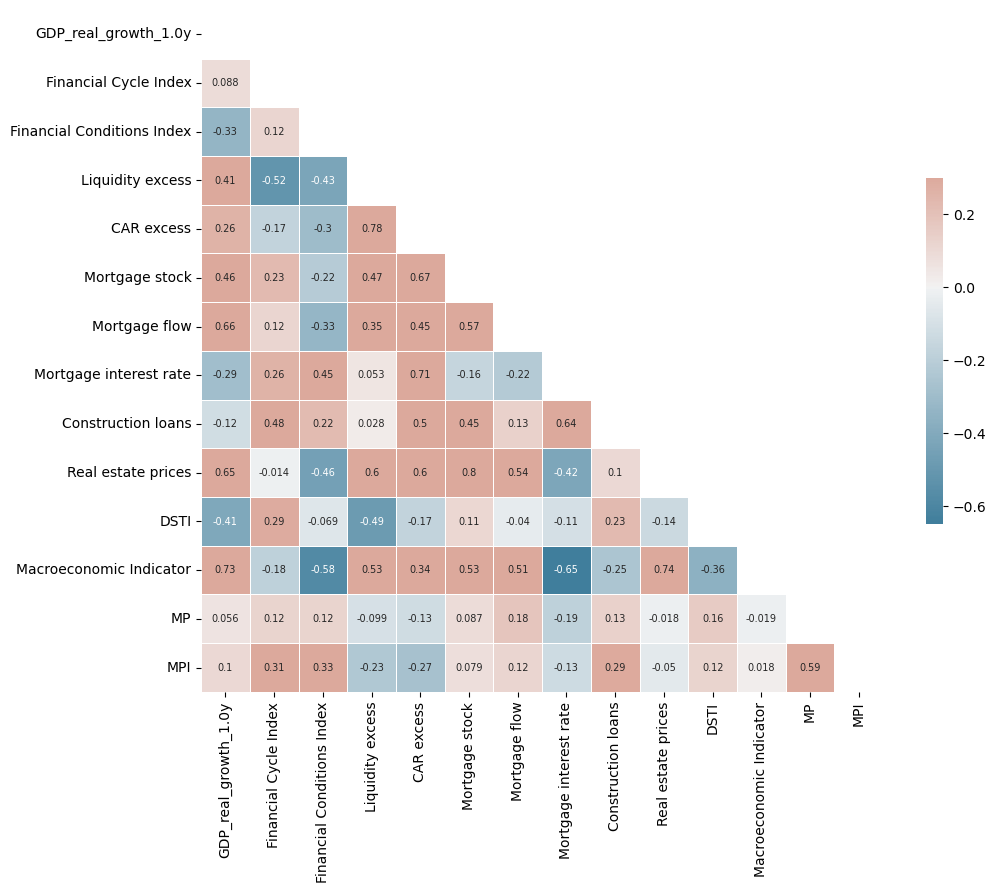

In [93]:
# Compute the correlation matrix
corr = arm_dataset.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"fontsize": 7})
plt.show()

In [94]:
arm_overview_tomorrow = pd.concat([Y, arm_dataset.iloc[:, 1:]], axis=1)
corr = arm_overview_tomorrow.corr()
corr_target = corr.loc['GDP_real_growth_hz_1.0y']
corr_target = corr_target.loc[corr_target.abs().sort_values(ascending=False).index]
display(corr_target)

GDP_real_growth_hz_1.0y       1.000000
GDP_real_growth_hz_2.0y       0.738689
GDP_real_growth_hz_3.0y       0.562321
Financial Cycle Index        -0.551932
Liquidity excess              0.539105
Macroeconomic Indicator       0.459501
GDP_real_growth_hz_5.0y       0.402536
GDP_real_growth_hz_4.0y       0.386820
Mortgage interest rate       -0.377095
Construction loans           -0.376367
DSTI                         -0.310819
Financial Conditions Index   -0.310397
CAR excess                    0.283295
Real estate prices            0.198813
MPI                          -0.182944
MP                           -0.103930
Mortgage stock               -0.021177
Mortgage flow                 0.002468
Name: GDP_real_growth_hz_1.0y, dtype: float64

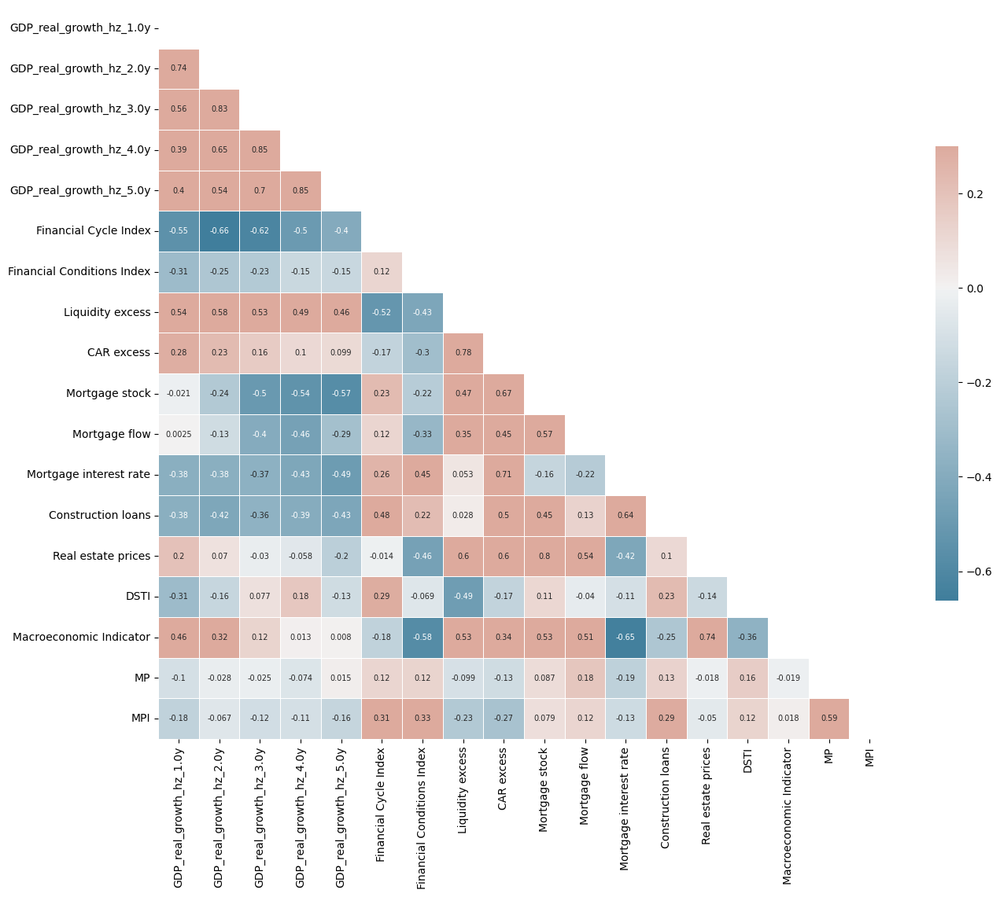

In [95]:
# Compute the correlation matrix
corr = arm_overview_tomorrow.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(15, 15))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"fontsize": 7})
plt.show()

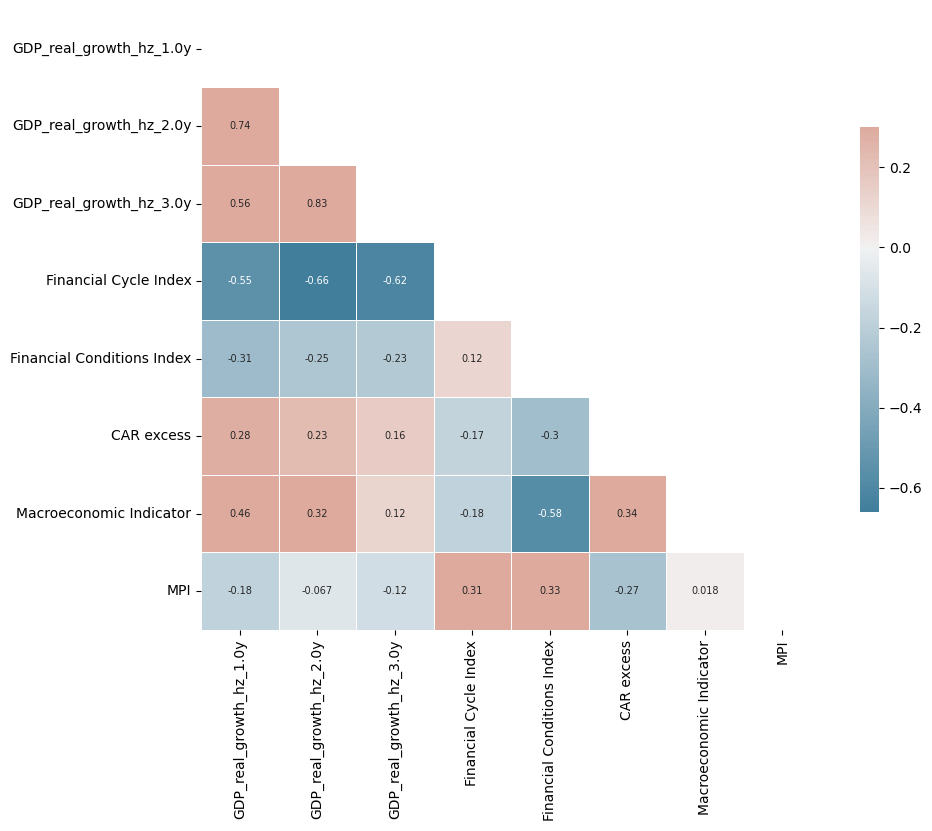

In [96]:
# Compute the correlation matrix
corr = arm_overview_tomorrow[list(arm_overview_tomorrow.columns[:3]) + main_important_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(10, 10))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, annot=True,
            square=True, linewidths=.5, cbar_kws={"shrink": .5}, annot_kws={"fontsize": 7})
plt.show()

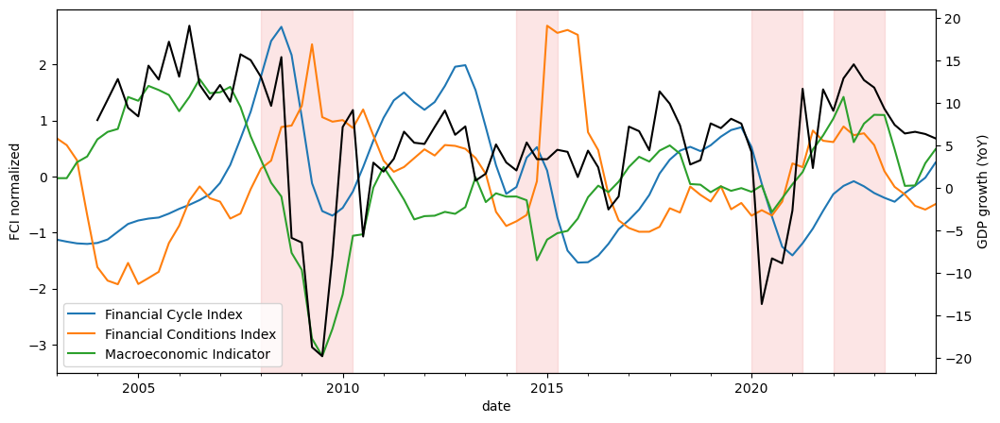

In [97]:
fcyi_s = ss.fit_transform(arm_dataset['Financial Cycle Index'])
fci_s = ss.fit_transform(arm_dataset['Financial Conditions Index'])
macro_indicator_s = ss.fit_transform(arm_dataset['Macroeconomic Indicator'])
growth = arm_dataset['GDP_real_growth_1.0y']

fig, ax = plt.subplots(figsize=(12, 5))
fcyi_s.plot(ax=ax)
fci_s.plot(ax=ax)
macro_indicator_s.plot(ax=ax)
ax.axvspan('2008-03-31', '2010-06-30', alpha=0.2, color='lightcoral')
ax.axvspan('2014-06-30', '2015-06-30', alpha=0.2, color='lightcoral')
ax.axvspan('2020-03-31', '2021-06-30', alpha=0.2, color='lightcoral')
ax.axvspan('2022-03-31', '2023-06-30', alpha=0.2, color='lightcoral')
plt.ylabel('FCI normalized')
growth.plot(ax=ax, color='black', secondary_y=True)
ax.legend(loc='lower left')
# plt.legend(loc='lower right')
plt.ylabel('GDP growth (YoY)')
# plt.savefig('../results/arm_systemic_risks_yoy.png', bbox_inches='tight', dpi=300)
plt.show()

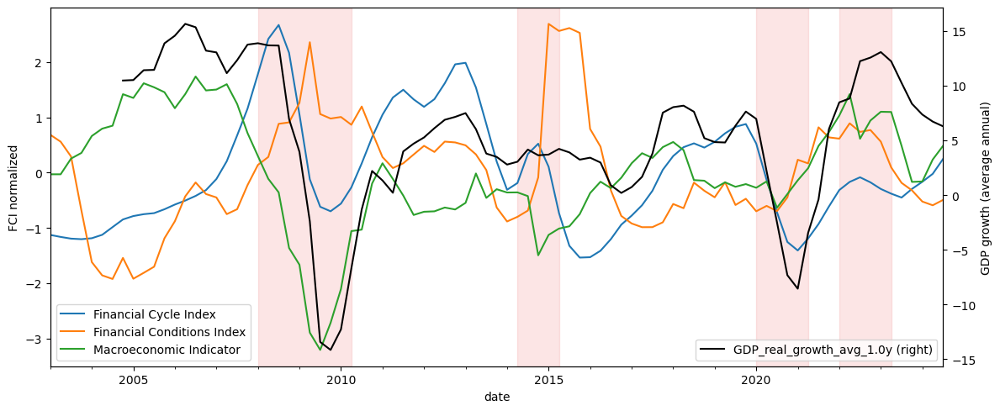

In [98]:
growth = Ar_avg['GDP_real_growth_avg_1.0y']

fig, ax = plt.subplots(figsize=(12, 5))
fcyi_s.plot(ax=ax)
fci_s.plot(ax=ax)
macro_indicator_s.plot(ax=ax)
ax.axvspan('2008-03-31', '2010-06-30', alpha=0.2, color='lightcoral')
ax.axvspan('2014-06-30', '2015-06-30', alpha=0.2, color='lightcoral')
ax.axvspan('2020-03-31', '2021-06-30', alpha=0.2, color='lightcoral')
ax.axvspan('2022-03-31', '2023-06-30', alpha=0.2, color='lightcoral')
plt.ylabel('FCI normalized')
growth.plot(ax=ax, color='black', secondary_y=True)
ax.legend(loc='lower left')
plt.legend(loc='lower right')
plt.ylabel('GDP growth (average annual)')
plt.tight_layout()
plt.savefig('../results/arm_systemic_risks_aa.png', bbox_inches='tight', dpi=300)
plt.show()

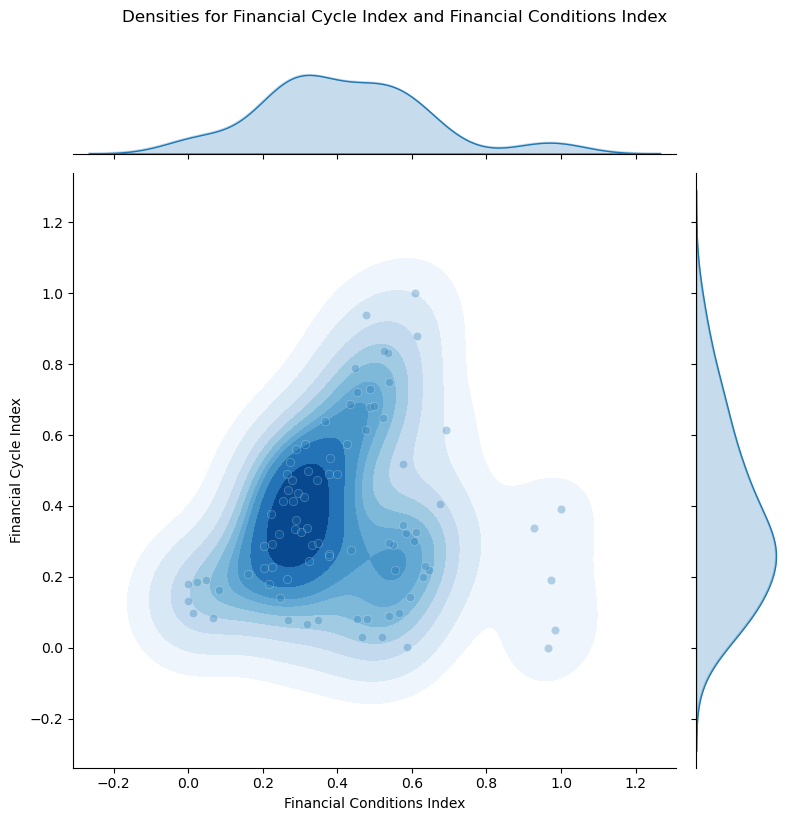

In [99]:
mm = MinMaxScalerDF()
fcyi_s = mm.fit_transform(arm_dataset['Financial Cycle Index'])
fci_s = mm.fit_transform(arm_dataset['Financial Conditions Index'])

# Create a joint plot
g = sns.jointplot(
    x=fci_s, 
    y=fcyi_s, 
    kind="kde",
    fill=True,
    cmap="Blues",
    height=8,  # Increase overall figure size
    ratio=6,   # Make marginal plots thinner
    space=0.1,  # Reduce space between plots
)

# Add scatter plot on top of the KDE in the center
g.plot(sns.scatterplot, sns.kdeplot, alpha=0.3)

# Enhance the plot
g.fig.suptitle("Densities for Financial Cycle Index and Financial Conditions Index", y=1.02)

plt.tight_layout()
plt.savefig('../results/arm_FCyI_and_FCI_densities.png', bbox_inches='tight', dpi=300)
plt.show()

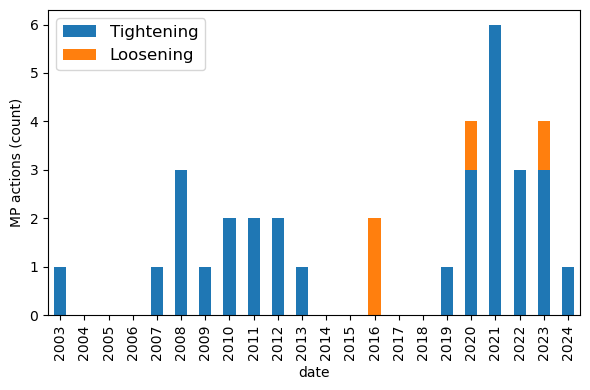

In [99]:
mp_tightening = X_raw['MP_T'].copy()
mp_loosening = X_raw['MP_L'].copy()
mp_actions = pd.DataFrame({'Tightening': mp_tightening, 'Loosening': mp_loosening})
mp_actions = mp_actions.groupby(mp_actions.index.year).sum()
# mp_actions.columns.name = 'Action'
# mp_actions = mp_actions.stack().reset_index(name='count').set_index('date')
fig, ax = plt.subplots(figsize=(6, 4))
mp_actions.plot(kind='bar', stacked=True, ax=ax)
ax.legend(fontsize=12)
ax.set_ylabel('MP actions (count)')
plt.tight_layout()
plt.savefig('../results/arm_MPI_actions.png', bbox_inches='tight', dpi=300)
plt.show()

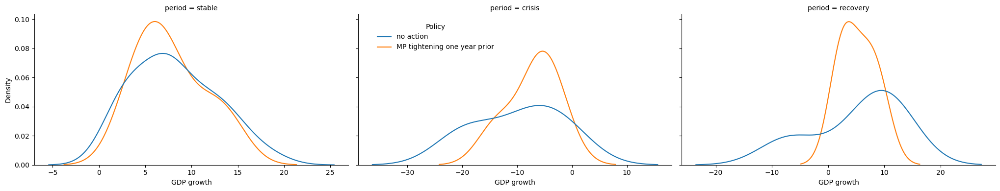

In [100]:
arm_overview = arm_dataset.copy()
period_crisis = (arm_overview['GDP_real_growth_1.0y'] < 0).astype(int)*10
period_recovery = (arm_overview['GDP_real_growth_1.0y'] < 0).astype(int).shift(4).fillna(0)
arm_overview['period'] = (period_crisis + period_recovery).replace({0: 'stable', 10: 'crisis', 11: 'recovery', 1:'recovery'})
arm_overview['MP tightening action'] = X_raw['MP_T']
arm_overview['MP loosening action'] = X_raw['MP_L']
arm_overview['MP tightening'] = (arm_overview['MP tightening action'] != 0).astype(int)
arm_overview['MP loosening'] = (arm_overview['MP loosening action'] != 0).astype(int)
arm_overview['Policy'] = arm_overview['MP tightening'].shift(4).fillna(0).replace({0: 'no action', 1: 'MP tightening one year prior'})

ax = sns.displot(arm_overview,
                 x="GDP_real_growth_1.0y",
                 col="period",
                 hue="Policy",
                 kind="kde",
                 height=4,
                 aspect=1.5,
                 common_norm=False,
                 facet_kws={'sharey': True, 'sharex': False})
ax.set(xlabel='GDP growth')
sns.move_legend(obj=ax, loc='upper right', bbox_to_anchor=(0.5, 0.9))
plt.tight_layout()
# plt.savefig('../results/arm_MPI_tightening_gdp_dist.png', bbox_inches='tight', dpi=300)
plt.show()

In [101]:
# saving results
X_selected.to_pickle('../data/working_data/arm_X_selected.pkl')
Y.to_pickle('../data/working_data/arm_Y.pkl')
Ar.to_pickle('../data/working_data/arm_Ar.pkl')
Arr.to_pickle('../data/working_data/arm_Arr.pkl')

# Modeling

In [156]:
# loading data and resetting plot options
X_selected = pd.read_pickle('../data/working_data/arm_X_selected.pkl')
Y = pd.read_pickle('../data/working_data/arm_Y.pkl')
Ar = pd.read_pickle('../data/working_data/arm_Ar.pkl')
Arr = pd.read_pickle('../data/working_data/arm_Arr.pkl')
sns.reset_defaults()

In [157]:
# dimension setup
mm = MinMaxScalerDF()
horizons = list(range(4, 20+1, 4))
horizons_short = list(range(4, 12+1, 4))
quantiles = np.arange(0.05, 0.95, 0.05).round(2)
model_select_cols = [
    'const',
    # 'Credit GDP ratio', 'Credit GDP gap',
    'Financial Cycle Index',
    # 'Short-term GB rate', 'Mid-term GB rate',
    # 'Long-term GB rate', 'Level',
    # 'Steepness', 'Curvature', 'Bank RoE',
    'Financial Conditions Index',
    # 'Liquidity excess',
    # 'CAR excess_C_2y',
    # 'CAR excess',
    # 'MP',
    # 'MPI',
    # 'FCI x FCyI',
    # 'MPI x FCyI', 'MPI x FCI',
    # 'MPI x CAR',
    # 'Mortgage stock', 'Mortgage flow',
    # 'Mortgage interest rate', 'Construction loans',
    # 'Real estate prices', 'Real house price',
    # 'DSTI',
    # 'Exchange rate', 'Trade balance', 'Copper prices',
    # 'CPI', 'Policy rate', 'Government debt',
    # 'Current account', 'Government expenditure',
    # 'Fiscal impulse QPM', 'Unemployment rate',
    'Macroeconomic Indicator'
]
# usable:
# Short-term GB rate
# DSTI

In [158]:
# exog variable setup
exog_all = X_selected.copy()
exog_all = add_trend(exog_all, trend='c')

# adding interaction effects
exog_mpi = exog_all['MPI'].copy()
exog_fcyi_norm = mm.fit_transform(exog_all['Financial Cycle Index']).rename('N(FCyI)')
exog_fci_norm = mm.fit_transform(exog_all['Financial Conditions Index']).rename('N(FCI)')
exog_car_excess = exog_all['CAR excess'].copy()
exog_fcyi_fci = ((1 - exog_fcyi_norm) * exog_fci_norm).rename('FCI x FCyI')
# # adding real house prices using CPI
# exog['Real house price'] = exog['Real estate prices'] - np.log(exog['CPI'])
exog_other = exog_all[model_select_cols].copy()
exog = pd.concat([exog_other, exog_fcyi_norm, exog_fci_norm, exog_car_excess, exog_mpi], axis=1)

In [159]:
# setup dataset
macro_dataset = []
horizon_namer = re.compile(r'_([\d\.]+)y')

# for forward expectations
for index, y_name in enumerate(Y):
    horizon_years = horizon_namer.search(y_name).group(1)
    horizon = float(horizon_years) * 4
    endog = Y[y_name].copy()
    ar = Ar.iloc[:, index].copy()
    endog_new_name = horizon_namer.sub('', ar.name)
    macro_data = pd.concat([ar.rename('autoregressive'), exog], axis=1)
    macro_data = pd.concat([endog.rename(endog_new_name), macro_data], axis=1)
    macro_data['horizon'] = horizon

    # remove extra rows
    cutoff_date = macro_data.isna().groupby('date').sum().sum(axis=1).idxmin()
    macro_data = macro_data[macro_data.index.get_level_values('date') >= cutoff_date].copy()

    # add to the dataset
    macro_dataset.append(macro_data)
macro_dataset = pd.concat(macro_dataset).reset_index().set_index(['horizon', 'date']).sort_index()

In [160]:
# model specification (input data)
poly_terms = np.array(["intercept", "slope", "quadratic", "cubic"])
gamma_terms = np.array(["intercept", "intercept_fcyi", "intercept_fci",
                        "slope", "quadratic", "multiplier_car"])
quantile_powers = np.stack([quantiles**i for i in range(len(poly_terms))], axis=0)

# train
model_data = {}
for horizon in horizons:
    model_data_h = {}
    # column setup
    macro_data = macro_dataset.loc[horizon].copy()
    target_name = macro_data.columns[0]
    macro_data = macro_data[macro_data[target_name].notna()].copy()
    y_h = macro_data[target_name].copy()
    date_h = y_h.index.copy()
    y_stack_h = np.stack([y_h.values] * len(quantiles)).T
    X_h = macro_data[['autoregressive'] + model_select_cols].copy()
    variables_h = X_h.columns.copy()
    fcyi_norm_h = macro_data['N(FCyI)'].values.copy()
    fci_norm_h = macro_data['N(FCI)'].values.copy()
    car_excess_h = macro_data['CAR excess'].values.copy()
    mpi_h = macro_data['MPI'].values.copy()
    X_h = X_h.values.copy()
    coords_h = {"date": date_h, "variables": variables_h, "quantiles": quantiles,
                "poly_terms": poly_terms, "gamma_terms": gamma_terms}

    # exporting data
    model_data_h['coords'] = coords_h
    model_data_h['y'] = y_stack_h
    model_data_h['X'] = X_h
    model_data_h['MPI'] = mpi_h
    model_data_h['N(FCyI)'] = fcyi_norm_h
    model_data_h['N(FCI)'] = fci_norm_h
    model_data_h['CAR excess'] = car_excess_h
    model_data[horizon] = model_data_h

# test
model_data_test = {}
for horizon in horizons:
    model_data_h = {}
    # column setup
    macro_data = macro_dataset.loc[horizon].copy()
    target_name = macro_data.columns[0]
    y_h = macro_data[target_name].copy()
    date_h = y_h.index.copy()
    y_stack_h = np.stack([y_h.values] * len(quantiles)).T
    X_h = macro_data[['autoregressive'] + model_select_cols].copy()
    variables_h = X_h.columns.copy()
    fcyi_norm_h = macro_data['N(FCyI)'].values.copy()
    fci_norm_h = macro_data['N(FCI)'].values.copy()
    car_excess_h = macro_data['CAR excess'].values.copy()
    mpi_h = macro_data['MPI'].values.copy()
    X_h = X_h.values.copy()
    coords_h = {"date": date_h, "variables": variables_h, "quantiles": quantiles,
                "poly_terms": poly_terms, "gamma_terms": gamma_terms}

    # exporting data
    model_data_h['coords'] = coords_h
    model_data_h['y'] = y_stack_h
    model_data_h['X'] = X_h
    model_data_h['MPI'] = mpi_h
    model_data_h['N(FCyI)'] = fcyi_norm_h
    model_data_h['N(FCI)'] = fci_norm_h
    model_data_h['CAR excess'] = car_excess_h
    model_data_test[horizon] = model_data_h

In [161]:
# model definition and fitting
model_data_sample = model_data[4]
# γ_offsets = np.array([0, 0, 0, 0, 0, 0, 1])
# y_slope - y_s2 >= 0 or 1
# γ_offsets = np.array([1, 0.2, 0.4, 2, 9, 0.3])
γ_offsets = np.array([-1, 4, 0.2, 1, 2, 0.4])

# auto, const, FCyI, FCI, MI
β_coeff_means = np.zeros((len(variables_h), len(poly_terms)))
β_coeff_sigmas = np.ones((len(variables_h), len(poly_terms)))*100

# FCyI_const, FCyI_slope, FCyI_other
β_coeff_means[2, 0] = -50
β_coeff_sigmas[2, 0] = 1
β_coeff_means[2, 1] = 125
β_coeff_sigmas[2, 1] = 1
β_coeff_sigmas[2, 2:] = 1

# λ_offset = 1
with pm.Model(coords=model_data_sample['coords']) as bqr_model_nie:
    # data containers
    y_stack = pm.Data(name="y", value=model_data_sample["y"], dims=("date", "quantiles"))
    X_data = pm.Data(name="X", value=model_data_sample["X"], dims=("date", "variables"))
    mpi = pm.Data(name="MPI", value=model_data_sample["MPI"], dims="date")
    fcyi_norm = pm.Data(name="N(FCyI)", value=model_data_sample["N(FCyI)"], dims="date")
    fci_norm = pm.Data(name="N(FCI)", value=model_data_sample["N(FCI)"], dims="date")
    car_excess = pm.Data(name="CAR excess", value=model_data_sample["CAR excess"], dims="date")

    # hyperparameter
    a_ref = 1
    λ_smoothness = 2

    # policy coefficients
    γ_coeffs_raw = pm.HalfNormal("γ_coeffs_raw", sigma=0.1, dims=("gamma_terms",))
    γ_coeffs = γ_coeffs_raw + γ_offsets
    γ_coeffs = pt.set_subtensor(γ_coeffs[4], γ_coeffs[3] + γ_coeffs[4])
    γ_coeffs = pm.Deterministic("γ_coeffs", γ_coeffs, dims=("gamma_terms",))
    γ_const = γ_coeffs[0] + γ_coeffs[1]*fcyi_norm + γ_coeffs[2]*fci_norm
    γ_const = pm.Deterministic("γ_const", γ_const, dims=("date",))
    γ_slope = -(γ_coeffs[3] + (γ_coeffs[1] / 0.5)*fcyi_norm + (γ_coeffs[2] / 0.1)*fci_norm)
    γ_slope = pm.Deterministic("γ_slope", γ_slope, dims=("date",))
    γ_poly = (γ_coeffs[4])*quantiles**2 - (γ_coeffs[4] / 10)*quantiles**3
    γ_poly = pm.Deterministic("γ_poly", γ_poly, dims=("quantiles",))

    # policy effects
    γ = (γ_coeffs[5]*(1 - car_excess))[:, None]*(γ_const[:, None] + γ_slope[:, None]*quantiles + γ_poly)
    γ = pm.Deterministic("γ", γ, dims=("date", "quantiles"))

    # nonlinear policy impact function
    f_γ = pm.Deterministic("f(γ, MPI)", 2*γ*T_sigmoid(mpi, λ_smoothness, a_ref)[:, None], dims=("date", "quantiles"))

    # exog parameters
    β_coeffs = pm.Normal("β_coeffs", β_coeff_means, β_coeff_sigmas, dims=("variables", "poly_terms"))
    β = pm.Deterministic("β", β_coeffs @ quantile_powers, dims=("variables", "quantiles"))

    # estimation
    σ = pm.HalfNormal("σ", 10)
    μ_mpi = pm.Deterministic('μ_mpi', mpi[:, None] * f_γ, dims=("date", "quantiles"))  # outer product
    μ_other = pm.Deterministic('μ_other', X_data @ β, dims=("date", "quantiles"))
    μ = pm.Deterministic('μ', μ_other + μ_mpi, dims=("date", "quantiles"))

    # likelihood function
    obs = pm.AsymmetricLaplace("obs", mu=μ, b=σ, q=quantiles, observed=y_stack, dims=("date", "quantiles"))

    # # constraints
    # qt_index = pt.where(quantiles == 0.2)[0][0]
    # γ_penalty_t = pm.Deterministic('γ_penalty_t', pm.math.mean(γ[:, :qt_index+1] < 0))
    # γ_penalty_m = pm.Deterministic('γ_penalty_m', pm.math.mean(γ[:, qt_index+1:] > 0))
    # pm.Potential("γ_penalty", -15*(γ_penalty_t+γ_penalty_m))

In [162]:
# model_graph = pm.model_to_graphviz(model=bqr_model_nie, save='../results/bqr_model_graph.png')
# display(model_graph)

In [163]:
# sampling
model_trace = {}

# training step
for hz, md in list(model_data.items()):
    data_cols_hz = {v.name: md[v.name] for v in bqr_model_nie.data_vars}
    with bqr_model_nie:
        pm.set_data(data_cols_hz, coords=md['coords'])
        # sampling: target_accept default is 0.8
        # pymc, numpyro
        trace_nie_hz = pm.sample(
            nuts_sampler="numpyro",
            tune=1_000,
            draws=1_000,
            chains=4,
            idata_kwargs={"log_likelihood": True},
            # nuts_sampler_kwargs={"max_treedepth": 10, "target_accept": 0.95}
        )
    model_trace[hz] = trace_nie_hz

# testing step (prediction)
for hz, md in list(model_data_test.items()):
    data_cols_hz = {v.name: md[v.name] for v in bqr_model_nie.data_vars}
    with bqr_model_nie:
        pm.set_data(data_cols_hz, coords=md['coords'])
        posterior_predictive = pm.sample_posterior_predictive(model_trace[hz], var_names=["μ", "γ"])
        model_trace[hz].extend(posterior_predictive)

/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/si

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
2024-12-17 14:12:25.811541: E external/xla/xla/service/slow_operation_alarm.cc:65] Constant folding an instruction is taking > 1s:

  %reduce.25 = f64[4,1000,79,18]{3,2,1,0} reduce(f64[4,1000,1,79,18]{4,3,2,1,0} %broadcast.6, f64[] %constant.29), dimensions={2}, to_apply=%region_8.186, metadata={op_name="jit(process_fn)/jit(main)/reduce_prod[axes=(2,)]" source_file="/var/folders/7z/4b2s0xm51xqdf1pg3f_vwj180000gp/T/tmpbo9_tcy2" source_line=85}

This isn't necessarily a bug; constant-folding is inherently a trade-off between compilation time and speed at runtime. XLA has some guards that attempt to keep constant folding from taking too long, but fundamentally you'll always be able to come up with an input program that takes a long time.

If you'd like to file a bug, run with envvar XLA_FLAGS=--xla_du

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893:

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893:

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893:

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

/Users/victoryerz/anaconda3/lib/python3.11/site-packages/pytensor/tensor/math.py:893: FutureWarning: sgn is deprecated and will stop working in the future, use sign instead.
  warnings.warn(
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details
Sampling: []


Output()

Sampling: []


Output()

Sampling: []


Output()

Sampling: []


Output()

Sampling: []


Output()

In [164]:
arm_bqcoef_nie = []
arm_bqr_pred_nie = []
trace_nie = model_trace[4]
for hz, trace in model_trace.items():
    trace.posterior["γ_const_mean"] = trace.posterior["γ_const"].mean(dim="date")
    trace.posterior["γ_slope_mean"] = trace.posterior["γ_slope"].mean(dim="date")
    trace.posterior["γ_mean"] = trace.posterior["γ"].mean(dim="date")
    arm_bqcoef, arm_bqr_pred = bqr_results(trace, var_names=['β', 'γ_coeffs', 'γ_const_mean', 'γ_slope_mean',
                                                             'γ_mean', 'σ'])
    # exporting coefficients
    arm_bqcoef['horizon'] = hz
    arm_bqcoef.set_index(['horizon'], append=True, inplace=True)
    arm_bqcoef = arm_bqcoef.reorder_levels(['horizon', 'variable', 'quantile'])
    arm_bqcoef_nie.append(arm_bqcoef)

    # exporting predictions
    arm_bqr_pred['horizon'] = hz
    arm_bqr_pred.set_index(['horizon'], append=True, inplace=True)
    arm_bqr_pred = arm_bqr_pred.reorder_levels(['horizon', 'date', 'quantile'])
    arm_bqr_pred_nie.append(arm_bqr_pred)

arm_bqcoef_nie = pd.concat(arm_bqcoef_nie, axis=0)
arm_bqr_pred_nie = pd.concat(arm_bqr_pred_nie, axis=0)

# generating a summary table
summary_nie = summary_with_stars(arm_bqcoef_nie, q=[0.1, 0.5], prefix='GDP growth, ')

In [165]:
display(arm_bqcoef_nie[arm_bqcoef_nie['r_hat'] > 1.01])

coeff     se   lower   upper  \
horizon variable                     quantile                                  
4       γ_mean                       0.60      -0.383  0.034  -0.451  -0.320   
                                     0.65      -0.409  0.034  -0.475  -0.341   
                                     0.70      -0.429  0.035  -0.499  -0.361   
                                     0.75      -0.445  0.036  -0.512  -0.370   
                                     0.80      -0.456  0.038  -0.524  -0.378   
                                     0.85      -0.462  0.039  -0.535  -0.383   
                                     0.90      -0.464  0.040  -0.542  -0.385   
8       β_autoregressive             0.05      -0.675  0.059  -0.804  -0.565   
        β_const                      0.05       7.742  0.551   6.713   8.860   
        β_Financial Conditions Index 0.05      -2.416  0.971  -4.247  -0.512   
                                     0.10      -1.550  0.633  -2.835  -0.404   
                                     0.15      -0.820  0.428  -1.642   0.013   
                                     0.30       0.641  0.367  -0.097   1.321   
                                     0.35       0.912  0.365   0.177   1.585   
                                     0.40       1.088  0.345   0.405   1.759   
                                     0.45       1.179  0.316   0.548   1.788   
                                     0.70       0.628  0.293   0.063   1.220   
                                     0.75       0.375  0.292  -0.207   0.942   
        β_Macroeconomic Indicator    0.05       5.550  1.653   2.784   9.195   
                                     0.30      10.742  0.885   9.007  12.491   
                                     0.35      11.801  0.870  10.152  13.563   
        γ_coeffs_intercept_fci       0.00       0.248  0.033   0.200   0.311   
        γ_slope_mean                 0.00      -5.427  0.165  -5.745  -5.146   
12      β_autoregressive             0.05      -0.435  0.083  -0.590  -0.268   
        β_const                      0.05       7.167  0.525   6.146   8.160   
        β_Financial Conditions Index 0.05      -1.452  0.521  -2.455  -0.444   
                                     0.25      -0.631  0.301  -1.190  -0.024   
                                     0.30      -0.429  0.299  -0.995   0.160   
                                     0.35      -0.237  0.285  -0.786   0.317   
                                     0.40      -0.057  0.263  -0.549   0.466   
        β_Macroeconomic Indicator    0.05      -0.565  1.411  -3.213   2.176   
16      β_autoregressive             0.05      -0.268  0.114  -0.477  -0.037   
        β_const                      0.05       5.686  0.674   4.322   6.925   
        β_Financial Conditions Index 0.05      -0.825  0.568  -1.954   0.263   
                                     0.30      -0.075  0.254  -0.645   0.355   
                                     0.35       0.161  0.247  -0.348   0.639   
20      β_autoregressive             0.05      -0.423  0.089  -0.597  -0.252   
        β_const                      0.05       6.212  0.452   5.317   7.059   
                                     0.90       2.865  0.797   1.265   4.300   
        β_Financial Conditions Index 0.05      -2.357  0.447  -3.244  -1.507   
                                     0.10      -2.371  0.292  -2.955  -1.820   
                                     0.70      -0.008  0.185  -0.369   0.353   
        β_Macroeconomic Indicator    0.05      -4.581  0.928  -6.341  -2.723   
                                     0.30      -2.454  0.560  -3.437  -1.291   
                                     0.35      -2.035  0.544  -3.008  -0.913   

                                               ess_bulk  ess_tail  r_hat  \
horizon variable                     quantile                              
4       γ_mean                       0.60         556.0     282.0   1.02   
                                     0.65         565.0    

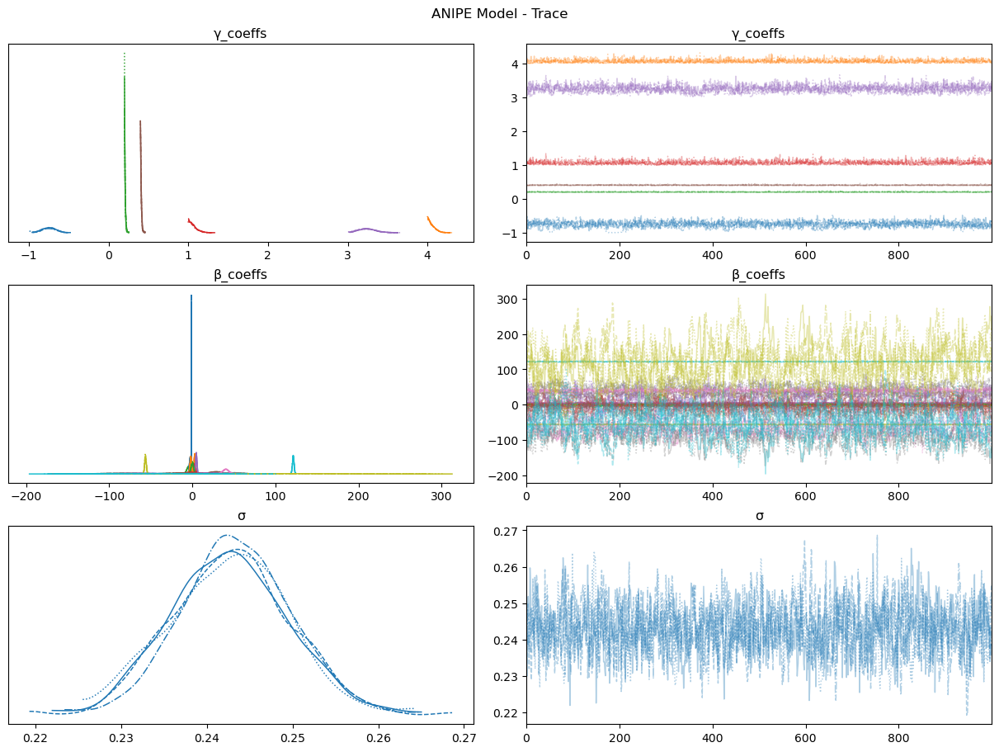

In [166]:
axes = az.plot_trace(
    data=trace_nie,
    var_names=['γ_coeffs', 'β_coeffs', 'σ'],
    compact=True,
    backend_kwargs={
        "figsize": (12, 9),
        "layout": "constrained"
    },
)
fig = axes[0][0].get_figure()
fig.suptitle("ANIPE Model - Trace")

plt.show()

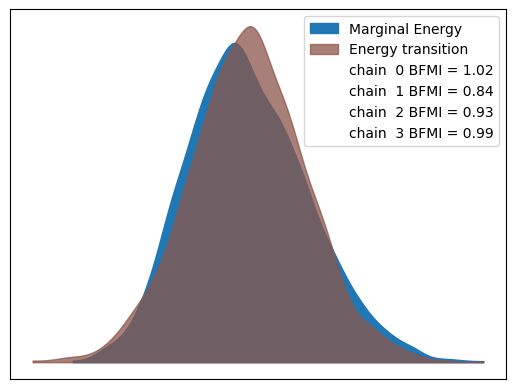

In [167]:
az.plot_energy(trace_nie)
plt.show()

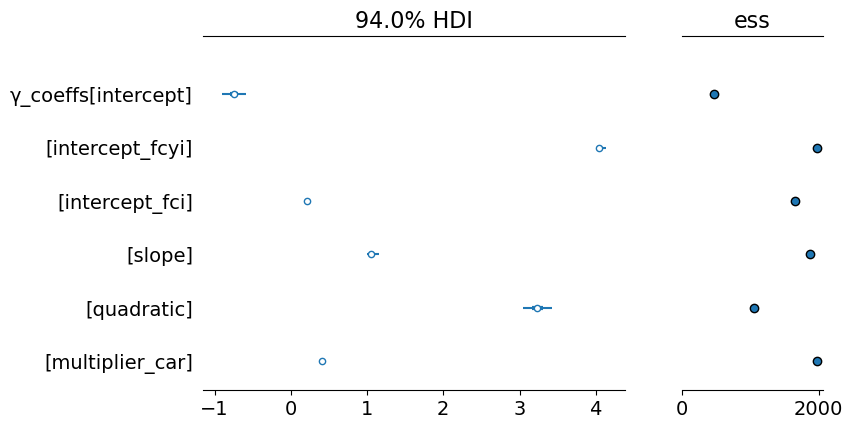

In [168]:
az.plot_forest(trace_nie, var_names=["γ_coeffs"], combined=True, ess=True)  # Exclude 'obs' for clarity
plt.show()

In [169]:
display(summary_nie.iloc[:, :-4])
display(arm_bqcoef_nie[arm_bqcoef_nie.index.get_level_values('quantile').isin([0])].loc[[4, 8, 12]])

,"GDP growth, q=0.1, h=4.0","GDP growth, q=0.5, h=4.0","GDP growth, q=0.1, h=8.0","GDP growth, q=0.5, h=8.0","GDP growth, q=0.1, h=12.0","GDP growth, q=0.5, h=12.0"
variable,,,,,,
β_autoregressive,-0.749***,-0.330***,-0.650***,-0.733***,-0.416***,-0.531***
,(0.1),(0.0),(0.0),(0.0),(0.1),(0.0)
β_const,7.041***,8.377***,8.181***,9.456***,7.403***,6.521***
,(0.4),(0.3),(0.4),(0.3),(0.4),(0.3)
β_Financial Cycle Index,-44.165***,3.683***,-45.650***,1.376,-45.523***,0.783
,(1.0),(1.1),(1.0),(1.1),(0.9),(1.0)
β_Financial Conditions Index,-0.097,0.562,-1.550***,1.192***,-1.252***,0.249
,(0.7),(0.3),(0.6),(0.3),(0.4),(0.2)
β_Macroeconomic Indicator,32.540***,18.284***,6.505***,14.639***,-0.620,1.844***


coeff     se  lower  upper  \
horizon variable                quantile                               
4       γ_coeffs_intercept      0.0      -0.747  0.085 -0.912 -0.581   
        γ_coeffs_intercept_fcyi 0.0       4.055  0.046  4.000  4.143   
        γ_coeffs_intercept_fci  0.0       0.207  0.007  0.200  0.222   
        γ_coeffs_slope          0.0       1.062  0.051  1.000  1.163   
        γ_coeffs_quadratic      0.0       3.241  0.105  3.047  3.446   
        γ_coeffs_multiplier_car 0.0       0.408  0.008  0.400  0.422   
        γ_const_mean            0.0       0.880  0.087  0.713  1.058   
        γ_slope_mean            0.0      -5.012  0.069 -5.148 -4.897   
        σ                       0.0       0.243  0.007  0.229  0.255   
8       γ_coeffs_intercept      0.0      -0.564  0.087 -0.733 -0.404   
        γ_coeffs_intercept_fcyi 0.0       4.113  0.074  4.001  4.250   
        γ_coeffs_intercept_fci  0.0       0.248  0.033  0.200  0.311   
        γ_coeffs_slope          0.0       1.053  0.044  1.000  1.139   
        γ_coeffs_quadratic      0.0       3.134  0.073  3.014  3.281   
        γ_coeffs_multiplier_car 0.0       0.442  0.029  0.401  0.500   
        γ_const_mean            0.0       1.189  0.095  0.999  1.363   
        γ_slope_mean            0.0      -5.427  0.165 -5.745 -5.146   
        σ                       0.0       0.327  0.009  0.310  0.347   
12      γ_coeffs_intercept      0.0      -0.460  0.075 -0.613 -0.322   
        γ_coeffs_intercept_fcyi 0.0       4.097  0.066  4.000  4.220   
        γ_coeffs_intercept_fci  0.0       0.218  0.016  0.200  0.250   
        γ_coeffs_slope          0.0       1.052  0.044  1.000  1.139   
        γ_coeffs_quadratic      0.0       3.225  0.098  3.043  3.417   
        γ_coeffs_multiplier_car 0.0       0.487  0.038  0.410  0.555   
        γ_const_mean            0.0       1.357  0.079  1.218  1.529   
        γ_slope_mean            0.0      -5.476  0.100 -5.668 -5.299   
        σ                       0.0       0.472  0.015  0.443  0.501   

                                          ess_bulk  ess_tail  r_hat  pval  \
horizon variable                quantile                                    
4       γ_coeffs_intercept      0.0          502.0     238.0   1.01   0.0   
        γ_coeffs_intercept_fcyi 0.0         1205.0     865.0   1.00   0.0   
        γ_coeffs_intercept_fci  0.0          831.0     711.0   1.01   0.0   
        γ_coeffs_slope          0.0         1052.0     643.0   1.00   0.0   
        γ_coeffs_quadratic      0.0          879.0     596.0   1.01   0.0   
        γ_coeffs_multiplier_car 0.0         1105.0     703.0   1.00   0.0   
        γ_const_mean            0.0          561.0     253.0   1.01   0.0   
        γ_slope_mean            0.0         1412.0    1598.0   1.00   0.0   
        σ                       0.0         1007.0    1769.0   1.00   0.0   
8       γ_coeffs_intercept      0.0          414.0     491.0   1.01   0.0   
        γ_coeffs_intercept_fcyi 0.0          418.0     543.0   1.01   0.0   
        γ_coeffs_intercept_fci  0.0          452.0     385.0   1.02   0.0   
        γ_coeffs_slope          0.0          621.0     420.0   1.01   0.0   
        γ_coeffs_quadratic      0.0          986.0    1023.0   1.00   0.0   
        γ_coeffs_multiplier_car 0.0          480.0     611.0   1.00   0.0   
        γ_const_mean            0.0          405.0     536.0   1.01   0.0   
        γ_slope_mean            0.0          492.0     726.0   1.02   0.0   
        σ                       0.0          570.0    1165.0   1.00   0.0   
12      γ_coeffs_intercept      0.0          463.0     984.0   1.01   0.0   
        γ_coeffs_intercept_fcyi 0.0          802.0     560.0   1.00   0.0   
        γ_coeffs_intercept_fci  0.0          661.0     545.0   1.01   0.0   
        γ_coeffs_slope          0.0          572.0     529.0   1.01   0.0   
        γ_coeffs_quadratic      0.0          635.0     459.0   1.01   0.0   
        γ_coeffs_multiplier_

In [170]:
display(arm_bqcoef_nie[arm_bqcoef_nie.index.get_level_values('quantile').isin([0])].loc[8]['coeff'].values[:-3])

array([-0.564,  4.113,  0.248,  1.053,  3.134,  0.442])

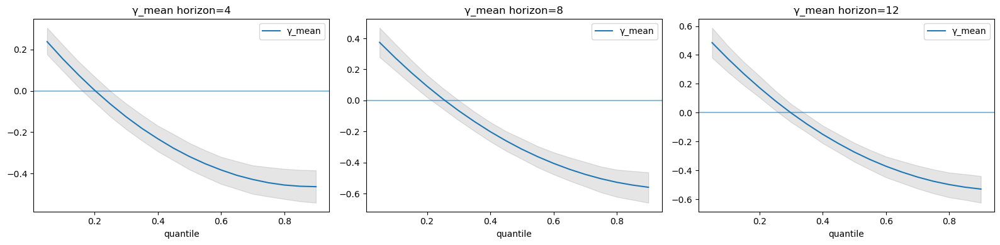

In [171]:
fig, axes = plt.subplots(1, len(horizons_short), figsize=(16, 4))
for h_index, h in enumerate(horizons_short):
    axes[h_index] = plot_qr_coeff(arm_bqcoef_nie, 'γ_mean', h, axes[h_index])
plt.tight_layout()
# plt.savefig('../results/arm_MPI_bcoeff_quantiles.png', bbox_inches='tight', dpi=300)
plt.show()

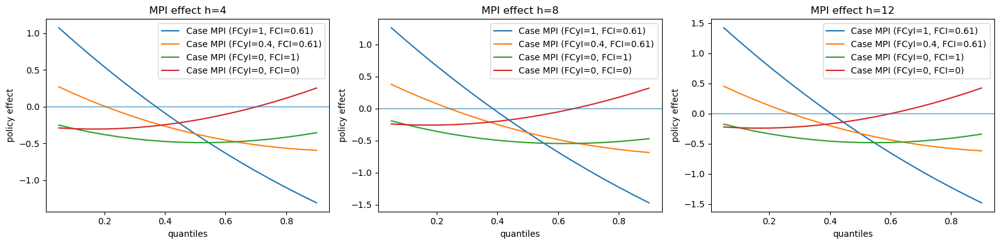

In [172]:
# generating scenarios for MPI
γ_coeffs_names = [
    'γ_coeffs_intercept', 'γ_coeffs_intercept_fcyi', 'γ_coeffs_intercept_fci',
    'γ_coeffs_slope', 'γ_coeffs_quadratic', 'γ_coeffs_multiplier_car'
]
fcyi_cond_values = [1, 0.4, 0, 0]
fci_cond_values = [0.61, 0.61, 1, 0]
mpi_cases = [f'MPI (FCyI={cy}, FCI={co})' for cy, co in zip(fcyi_cond_values, fci_cond_values)]
gamma_data = arm_bqcoef_nie[arm_bqcoef_nie.index.get_level_values('variable').isin(γ_coeffs_names)]['coeff']

# plotting the mpi effect curve
fig, axes = plt.subplots(1, len(horizons_short), figsize=(16, 4))
for h_index, hz in enumerate(horizons_short):
    ax = axes[h_index]
    gamma_coeffs = np.array(gamma_data.loc[hz].reset_index('quantile', drop=True)).copy()
    for cy, co, case in zip(fcyi_cond_values, fci_cond_values, mpi_cases):
        gamma_const = gamma_coeffs[0] + gamma_coeffs[1]*cy + gamma_coeffs[2]*co
        gamma_slope = -(gamma_coeffs[3] + (gamma_coeffs[1] / 0.5)*cy + (gamma_coeffs[2] / 0.1)*co)
        gamma_ploy = (gamma_coeffs[4])*quantiles**2 - (gamma_coeffs[4] / 10)*quantiles**3
        gamma_case = gamma_coeffs[5]*(1 - 0.1)*(gamma_const + gamma_slope*quantiles + gamma_ploy)
        ax.plot(quantiles, gamma_case, label=f'Case {case}')
    ax.axhline(0, alpha=0.5)
    ax.set_title(f'MPI effect h={hz}')
    ax.set_xlabel('quantiles')
    ax.set_ylabel('policy effect')
    ax.legend()
plt.tight_layout()
# plt.savefig('../results/arm_conditional_MPI_bcoeff_quantiles.png', bbox_inches='tight', dpi=300)
plt.show()

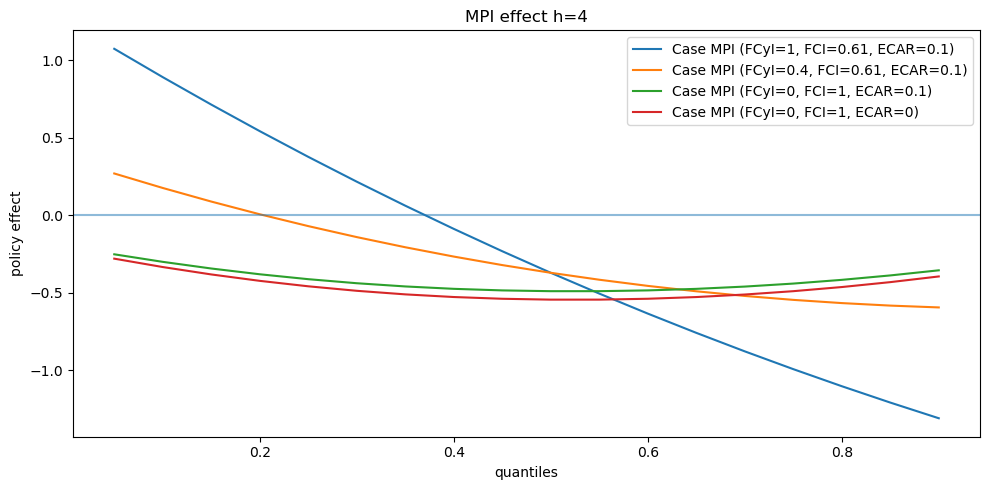

In [184]:
# plotting aggregate effects (forward)
fcyi_cond_values = [1, 0.4, 0, 0]
fci_cond_values = [0.61, 0.61, 1, 1]
car_cond_values = [0.9, 0.9, 0.9, 1]
mpi_cases = [f'MPI (FCyI={cy}, FCI={co}, ECAR={np.round(1-car, 1)})' for cy, co, car in zip(fcyi_cond_values, fci_cond_values, car_cond_values)]
fig, ax = plt.subplots(figsize=(10, 5))
gamma_coeffs = np.array(gamma_data.loc[4].reset_index('quantile', drop=True)).copy()
for cy, co, car, case in zip(fcyi_cond_values, fci_cond_values, car_cond_values, mpi_cases):
    gamma_const = gamma_coeffs[0] + gamma_coeffs[1]*cy + gamma_coeffs[2]*co
    gamma_slope = -(gamma_coeffs[3] + (gamma_coeffs[1] / 0.5)*cy + (gamma_coeffs[2] / 0.1)*co)
    gamma_ploy = (gamma_coeffs[4])*quantiles**2 - (gamma_coeffs[4] / 10)*quantiles**3
    gamma_case = gamma_coeffs[5]*car*(gamma_const + gamma_slope*quantiles + gamma_ploy)
    ax.plot(quantiles, gamma_case, label=f'Case {case}')
ax.axhline(0, alpha=0.5)
ax.set_title(f'MPI effect h={4}')
ax.set_xlabel('quantiles')
ax.set_ylabel('policy effect')
ax.legend()
plt.tight_layout()
plt.savefig('../results/arm_conditional_MPI_bcoeff_quantiles_h4.png', bbox_inches='tight', dpi=300)
plt.show()

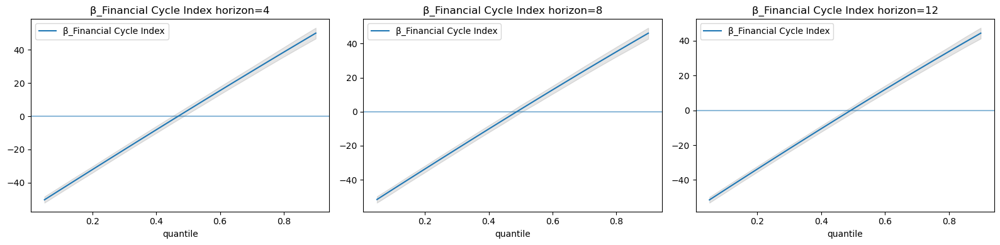

In [174]:
fig, axes = plt.subplots(1, len(horizons_short), figsize=(16, 4))
for h_index, h in enumerate(horizons_short):
    axes[h_index] = plot_qr_coeff(arm_bqcoef_nie, 'β_Financial Cycle Index', h, axes[h_index])
plt.tight_layout()
# plt.savefig('../results/arm_FCyI_bcoeff_quantiles.png', bbox_inches='tight', dpi=300)
plt.show()

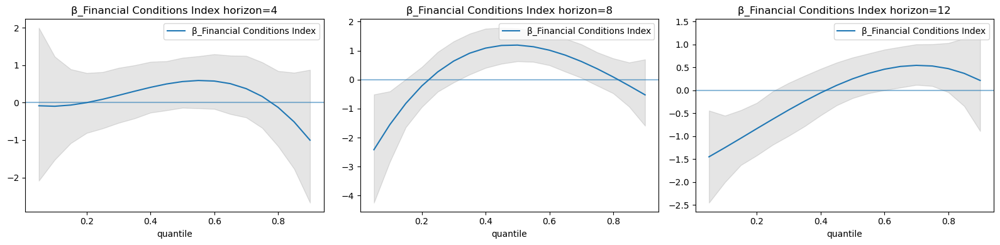

In [175]:
fig, axes = plt.subplots(1, len(horizons_short), figsize=(16, 4))
for h_index, h in enumerate(horizons_short):
    axes[h_index] = plot_qr_coeff(arm_bqcoef_nie, 'β_Financial Conditions Index', h, axes[h_index])
plt.tight_layout()
# plt.savefig('../results/arm_FCI_bcoeff_quantiles.png', bbox_inches='tight', dpi=300)
plt.show()

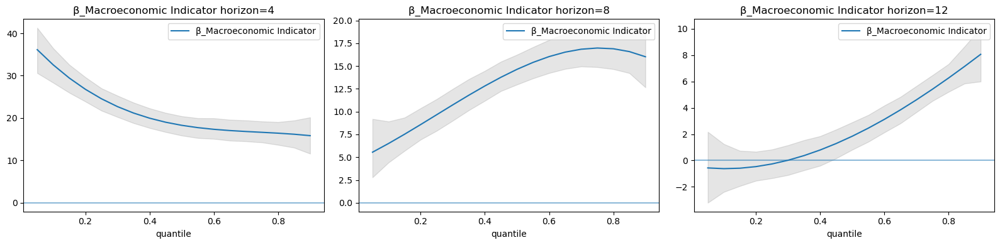

In [176]:
fig, axes = plt.subplots(1, len(horizons_short), figsize=(16, 4))
for h_index, h in enumerate(horizons_short):
    axes[h_index] = plot_qr_coeff(arm_bqcoef_nie, 'β_Macroeconomic Indicator', h, axes[h_index])
plt.tight_layout()
# plt.savefig('../results/arm_MI_bcoeff_quantiles.png', bbox_inches='tight', dpi=300)
plt.show()

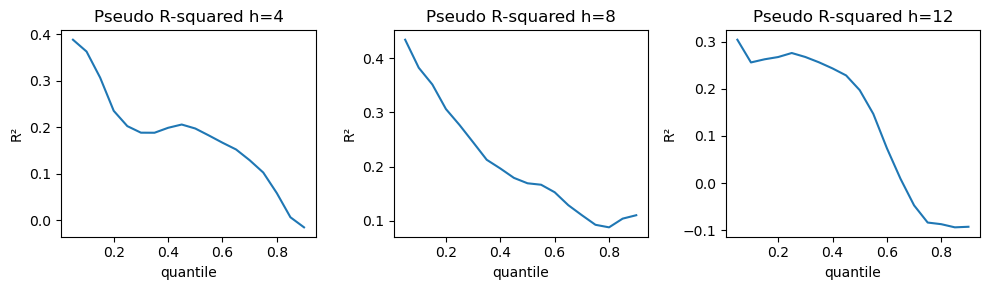

In [177]:
r2s = arm_bqcoef_nie['pseudoR2'].groupby(['horizon', 'quantile']).mean()
fig, axes = plt.subplots(1, len(horizons_short), figsize=(10, 3))

for h_index, h in enumerate(horizons_short):
    r2_h = r2s.loc[h].copy()
    r2_h.index = r2_h.index.astype(float)
    axes[h_index] = r2_h.plot(ax=axes[h_index], title=f'Pseudo R-squared h={h}')
    axes[h_index].set_ylabel('R²')
plt.tight_layout()
# plt.savefig('../results/arm_bqr_r2.png', bbox_inches='tight', dpi=300)
plt.show()

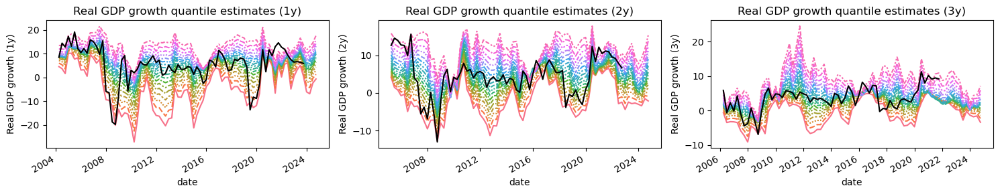

In [178]:
y_pred = arm_bqr_pred_nie['conditional_mean'].unstack('quantile')
actual = arm_bqr_pred_nie['actual'].unstack()[0.5]

fig, axes = plt.subplots(1, len(horizons_short), figsize=(15, 3))
for h_index, h in enumerate(horizons_short):
    ax = axes[h_index]
    g = sns.lineplot(data=y_pred.loc[h], ax=ax, legend=False)
    actual.loc[h].plot(color='black', ax=ax)
    ax.set_ylabel(f"Real GDP growth ({int(h/4)}y)")
    ax.set_title(f"Real GDP growth quantile estimates ({int(h/4)}y)")
plt.tight_layout()
# plt.savefig('../results/arm_bqr_predictions.png', bbox_inches='tight', dpi=300)
plt.show()

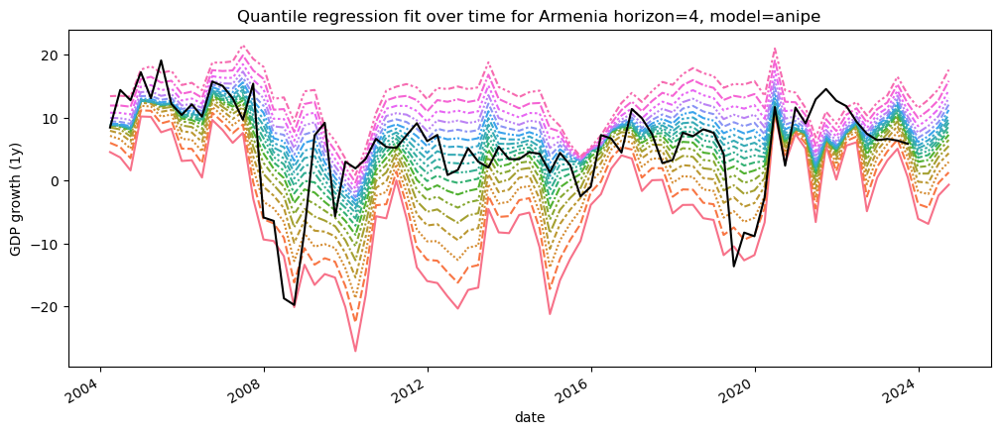

In [179]:
horizon = 4
fig, ax = plt.subplots(figsize=(12, 5))
g = sns.lineplot(data=y_pred.loc[horizon], ax=ax)
actual.loc[horizon].plot(color='black', ax=ax)
plt.title(f'Quantile regression fit over time for Armenia horizon={4}, model=anipe')
plt.ylabel(f'GDP growth ({int(1)}y)')
plt.legend([], [], frameon=False)
# plt.savefig('../results/arm_bqr_predictions_h4.png', bbox_inches='tight', dpi=300)
plt.show()

Sampling: [obs, β_coeffs, γ_coeffs_raw, σ]


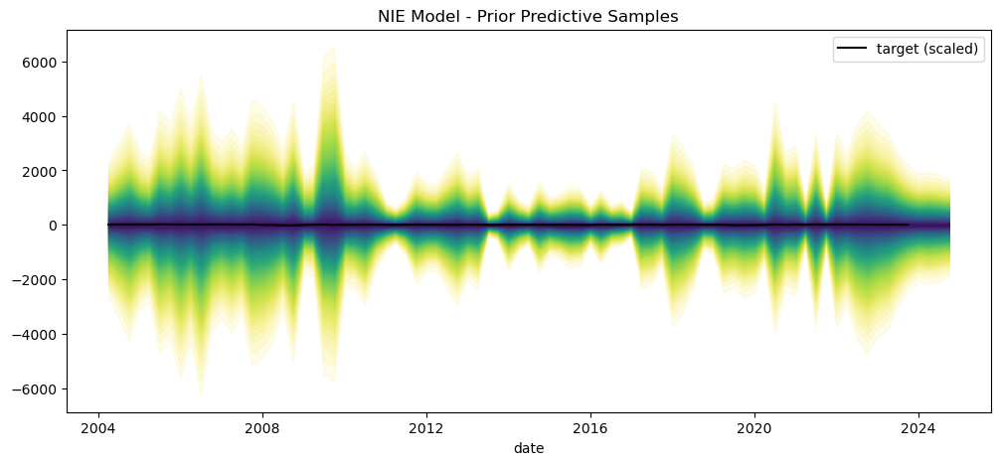

In [180]:
horizon = 4
data_cols_hz = {v.name: model_data_test[horizon][v.name] for v in bqr_model_nie.data_vars}
with bqr_model_nie:
    pm.set_data(data_cols_hz, coords=model_data_test[horizon]['coords'])
nie_prior_predictive = pm.sample_prior_predictive(model=bqr_model_nie)

# useful way to color the distribution
palette = "viridis_r"
cmap = plt.get_cmap(palette)
percs = np.linspace(51, 99, 100)
colors = (percs - np.min(percs)) / (np.max(percs) - np.min(percs))

fig, ax = plt.subplots(figsize=(12, 5))
for i, p in enumerate(percs[::-1]):
    upper = np.percentile(nie_prior_predictive.prior_predictive["obs"], p, axis=(0, 1, 3))
    lower = np.percentile(
        nie_prior_predictive.prior_predictive["obs"], 100 - p, axis=(0, 1, 3)
    )
    color_val = colors[i]
    ax.fill_between(
        x=nie_prior_predictive.observed_data['date'],
        y1=upper.flatten(),
        y2=lower.flatten(),
        color=cmap(color_val),
        alpha=0.1,
    )
sns.lineplot(x=nie_prior_predictive.observed_data['date'], y=actual.loc[horizon].values, color="black", label="target (scaled)", ax=ax)
ax.legend()
ax.set(title="NIE Model - Prior Predictive Samples")
plt.show()

In [182]:
# # Saving the estimation results
# arm_bqcoef_nie.to_pickle('../data/working_data/arm_bqcoef_nie.pkl')
# arm_bqr_pred_nie.to_pickle('../data/working_data/arm_bqr_pred_nie.pkl')
# macro_dataset.to_pickle('../data/working_data/arm_macro_dataset.pkl')
# exog.to_pickle('../data/working_data/arm_exog.pkl')
# with open("../data/working_data/model_trace.pkl", "wb") as f:
#     pickle.dump(model_trace, f)

# Distribution fitting

In [148]:
# theme setup
sns.reset_defaults()
horizons = list(range(4, 20+1, 4))
horizons_short = list(range(4, 12+1, 4))
quantlist = np.arange(0.05, 0.95, 0.05).round(2)
# tsfit input data:
# mode: Free vs Fixed (always Free for Kernel-based)
# fittype: 'T-skew' vs "Asymmetric T" vs "Kernel-based"
# qsmooth: 'None' vs 'Median' vs 'Mean'
fit_methods = ['T-skew', 'Kernel-based']
fit_params = {
    'fittype': 'Kernel-based',
    'mode': {'constraint': 'Free', 'value': None, 'bandwidth': None},
    'qsmooth': None,
    'qsmooth_period': 4,
    'plot_mode': True,
    'plot_median': True,
    'plot_mean': True,
    'dof': {'constraint': 'Default', 'value': None},
    'var_low': {'constraint': 'Default', 'value': None},
    'var_high': {'constraint': 'Default', 'value': None},
    'skew_low': {'constraint': 'Default', 'value': None},
    'skew_high': {'constraint': 'Default', 'value': None}
}

In [136]:
# dist fitting data setup
arm_bqcoef_nie = pd.read_pickle('../data/working_data/arm_bqcoef_nie.pkl')
arm_bqr_pred_nie = pd.read_pickle('../data/working_data/arm_bqr_pred_nie.pkl')
macro_dataset = pd.read_pickle('../data/working_data/arm_macro_dataset.pkl')
exog = pd.read_pickle('../data/working_data/arm_exog.pkl')
with open("../data/working_data/model_trace.pkl", "rb") as f:
    traces = pickle.load(f)

# exog dataset for making predictions
macro_dataset = macro_dataset.drop(columns=['GDP_real_growth', 'N(FCyI)', 'N(FCI)', 'CAR excess']).copy()
macro_dataset.columns.name = 'variable'

# mpi data
mpi_dataset = macro_dataset['MPI'].copy()
mpi_dataset = mpi_dataset.reset_index()
mpi_dataset['variable'] = 'MPI'
mpi_dataset = mpi_dataset.rename(columns={"MPI": "exog"})

macro_dataset_stack = macro_dataset.drop(columns=['MPI']).stack()
macro_dataset_stack.name = 'exog'
macro_dataset_stack = macro_dataset_stack.reset_index()

# coeff set
arm_qcoef_values = arm_bqcoef_nie.reset_index()
arm_qcoef_values = arm_qcoef_values[arm_qcoef_values['variable'].apply(lambda x: "β" in x)].copy()
arm_qcoef_values['variable'] = arm_qcoef_values['variable'].apply(lambda x: x[2:])
arm_qcoef_values = arm_qcoef_values.set_index(['horizon', 'variable', 'quantile'])['coeff'].reset_index()

# MPI coeff set
mpi_coeffs = []
for hz in horizons:
    trace_hz = traces[hz].posterior_predictive
    mpi_coeffs_hz = pd.DataFrame(trace_hz['γ'].mean(('chain', 'draw')), index=trace_hz['date'], columns=trace_hz['quantiles'])
    mpi_coeffs_hz.index.name = 'date'
    mpi_coeffs_hz.columns.name = 'quantile'
    mpi_coeffs_hz['horizon'] = hz
    mpi_coeffs_hz = mpi_coeffs_hz.reset_index().set_index(['horizon', 'date'])
    mpi_coeffs.append(mpi_coeffs_hz)
mpi_coeffs = pd.concat(mpi_coeffs).stack().rename('coeff').reset_index()
mpi_details = pd.merge(mpi_coeffs, mpi_dataset, on=['horizon', 'date'])
mpi_details = mpi_details.set_index(['horizon', 'date', 'variable', 'quantile']).sort_index()

# gdp distribution dataset
gdp_dist_details = pd.merge(macro_dataset_stack, arm_qcoef_values, 'left', ['horizon', 'variable'])
gdp_dist_details = gdp_dist_details.set_index(['horizon', 'date', 'variable', 'quantile']).sort_index()
gdp_dist_details = pd.concat([gdp_dist_details, mpi_details]).sort_index()

# generating shock columns
mpi_shocks = np.arange(-4, 4.25, 0.25)
mpi_rows = gdp_dist_details.index.get_level_values('variable') == 'MPI'

# deriving policy effects
gdp_det = []
for shock in mpi_shocks:
    gdp_det_i = gdp_dist_details.copy()
    gdp_det_i.loc[mpi_rows, 'exog'] = gdp_det_i.loc[mpi_rows, 'exog'] + shock
    gdp_det_i['MPI_shock'] = shock
    gdp_det.append(gdp_det_i)
gdp_dist_details = pd.concat(gdp_det)

# calc for effective coefficient
gdp_dist_dims = ['horizon', 'date', 'MPI_shock', 'variable', 'quantile']
gdp_dist_details = gdp_dist_details.reset_index().set_index(gdp_dist_dims).sort_index()
# smoothness_values = arm_bqcoef_nie['coeff'].xs('λ_smoothness', level='variable').reset_index('quantile', drop=True)
smoothness_value = 2
mpi_rows = gdp_dist_details.index.get_level_values('variable') == 'MPI'
f_coeff_all = gdp_dist_details.apply(lambda x: 2*x.iloc[1]*T_sigmoid_numpy(x.iloc[0], smoothness_value, 1), axis=1)
gdp_dist_details['f_coeff'] = np.where(mpi_rows, f_coeff_all, gdp_dist_details['coeff'])

# predicting effects
gdp_dist_details['pred'] = gdp_dist_details['f_coeff']*gdp_dist_details['exog']

# making gdp dist predictions
pred_dims = ['horizon', 'date', 'MPI_shock', 'quantile']
prediction = gdp_dist_details.groupby(pred_dims)['pred'].sum()

In [137]:
# saving the results
gdp_dist_details.to_pickle('../data/working_data/arm_gdp_dist_details.pkl')
prediction.to_pickle('../data/working_data/arm_prediction.pkl')

In [138]:
# loading
prediction = pd.read_pickle('../data/working_data/arm_prediction.pkl')

In [139]:
# fit a distribution for each set of quantile predictions using different methods
prediction_dist_fit = []
pre = prediction.copy()
pred_dist = pre.reset_index(pre.index.names[:-1]).groupby(pre.index.names[:-1])
for method in tqdm(fit_methods):
    fit_params['fittype'] = method
    pred_dist_fit = pred_dist['pred'].apply(lambda x: pd.Series(dist_fit(x.to_dict(), fit_params)))
    pred_dist_fit = pred_dist_fit.unstack(level=-1)
    pred_dist_fit['method'] = method
    pred_dist_fit.set_index('method', append=True, inplace=True)
    prediction_dist_fit.append(pred_dist_fit)
prediction_dist_fit = pd.concat(prediction_dist_fit)
index_order = ['horizon', 'date', 'method', 'MPI_shock']
prediction_dist_fit = prediction_dist_fit.reorder_levels(index_order).sort_index()

  0%|          | 0/2 [00:00<?, ?it/s]

In [140]:
# saving the results
prediction_dist_fit.to_pickle('../data/working_data/arm_prediction_dist_fit.pkl')

In [141]:
# loading
prediction_dist_fit = pd.read_pickle('../data/working_data/arm_prediction_dist_fit.pkl')

In [142]:
prediction_fitted = prediction_dist_fit.reset_index().apply(lambda x: get_quantiles(quantlist, x['model_fit'],  x['method']), axis=1)
prediction_fitted = prediction_fitted.apply(pd.Series)
prediction_fitted.columns = quantlist
prediction_fitted.columns.name = 'quantile'
prediction_fitted.index = prediction_dist_fit.index
prediction_fitted = prediction_fitted.stack().sort_index()
prediction_fitted.name = 'pred'

In [143]:
# saving the results
prediction_fitted.to_pickle('../data/working_data/arm_prediction_fitted.pkl')

In [144]:
# select a fixed set of gdp growth values for which we'll be calculating their respective pdf and cdf values
prediction_dist_fit_subset = prediction_dist_fit.loc[4].xs(0, level='MPI_shock')
model_q = prediction_dist_fit_subset.reset_index().apply(lambda x: get_model_quantiles(x['model_fit'], x['method']), axis=1)
model_q = model_q.apply(pd.Series)
model_q.columns = ['v_q15', 'v_q40', 'v_q60', 'v_q85']
model_q['min'] = model_q['v_q15'] - (model_q['v_q15']-model_q['v_q40']).abs()
model_q['max'] = model_q['v_q85'] + (model_q['v_q85']-model_q['v_q60']).abs()
gdp_growth_values = np.array([x for x in np.linspace(model_q['min'].quantile(0.03),
                                                     model_q['max'].quantile(0.9), 500)])

In [145]:
# calculate the pdf and cdf values
prediction_dfpdf = prediction_dist_fit.apply(lambda x: gen_PDF_and_CDF(x['model_fit'], x.name[-2],
                                                                       gdp_growth_values, x['modx']), axis=1)
prediction_dfpdf = prediction_dfpdf.apply(lambda x: x.stack()).stack().stack().unstack(-2)
prediction_dfpdf.index.names = prediction_dfpdf.index.names[:-1] + ['index']

In [146]:
# saving the results
prediction_dfpdf.to_pickle('../data/working_data/arm_prediction_dfpdf.pkl')

In [149]:
# loading
prediction = pd.read_pickle('../data/working_data/arm_prediction.pkl')
prediction_dist_fit = pd.read_pickle('../data/working_data/arm_prediction_dist_fit.pkl')
prediction_dfpdf = pd.read_pickle('../data/working_data/arm_prediction_dfpdf.pkl')

In [150]:
# base
latest_date = parser.parse('2024-09-30')

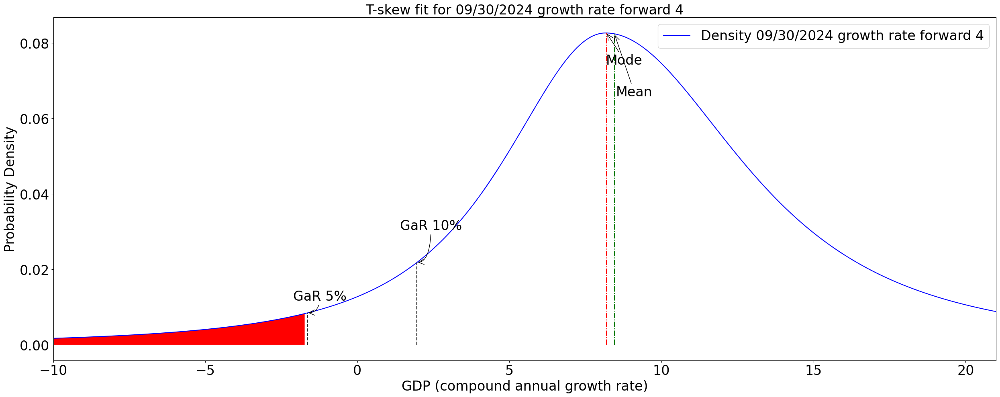

In [155]:
horizon = 4
plot_date = latest_date
method = 'T-skew'
mpi_shock = 0
pred_index = (horizon, plot_date, mpi_shock)
dist_index = (horizon, plot_date, method, mpi_shock)

x_list, yvals, ycdf = prediction_dfpdf.loc[dist_index].values.T
q5_index = np.argmin(np.abs(ycdf - 0.05))
q10_index = np.argmin(np.abs(ycdf - 0.1))
q40_index = np.argmin(np.abs(ycdf - 0.4))
q50_index = np.argmin(np.abs(ycdf - 0.5))
x_inc = (yvals[q40_index]-yvals[q5_index])/4
xq5 = x_list[q5_index]
yq5 = yvals[q5_index]
xq10 = x_list[q10_index]
yq10 = yvals[q10_index]
xq50 = x_list[q50_index]
yq50 = yvals[q50_index]

fig, ax = plt.subplots(1, 1, figsize=(25, 10))
titlestr = f"{method} fit for "+plot_date.strftime('%m/%d/%Y')+" "+"growth rate"+" forward "+str(horizon)
lablestr = "Density "+plot_date.strftime('%m/%d/%Y')+" "+"growth rate"+" forward "+str(horizon)
ax.fill_between(x_list[:q5_index], 0, yvals[:q5_index],  facecolor='red', interpolate=True)
ax.plot(x_list, yvals, 'b-', label=lablestr)

# plot design
ax.set_title(titlestr, fontsize=24)
ax.legend(fontsize=24)
ax.tick_params(labelsize=24)
# ax.set_ylim(0, 1.3 * max(yvals))
# ax.set_xlim(xq5-2, xq50+4)
plt.ylabel('Probability Density', fontsize=24)
plt.xlabel('GDP (compound annual growth rate)', fontsize=24)

# plot mod
modx = x_list[np.argmax(yvals)]
mody = yvals.max()
ax.plot([modx, modx], [0, mody], 'r-.')
ax.annotate('Mode', xy=(modx, mody), xycoords='data',
            xytext=(modx-x_inc, mody*0.9), textcoords='data',
            arrowprops=dict(arrowstyle="->",
            connectionstyle="arc3"), fontsize=24)

# plot mean
meanx = x_list @ (yvals/yvals.sum())
meany = yvals[np.argmin(np.abs(x_list-meanx))]
ax.plot([meanx, meanx], [0, meany], 'g-.')
ax.annotate('Mean', xy=(meanx, meany), xycoords='data',
            xytext=(meanx+x_inc*3, meany*0.8), textcoords='data',
            arrowprops=dict(arrowstyle="->",
            connectionstyle="arc3"), fontsize=24)

# plot tails
ax.plot([xq5, xq5], [0, yq5], 'k--')
ax.annotate('GaR 5%', xy=(xq5, yq5), xycoords='data',
            xytext=(xq5-x_inc*25, yq5*1.4), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="angle3,angleA=90,angleB=0"), fontsize=24)
ax.plot([xq10, xq10], [0, yq10], 'k--')
ax.annotate('GaR 10%', xy=(xq10, yq10), xycoords='data',
            xytext=(xq10-x_inc*30, yq10*1.4), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="angle3,angleA=90,angleB=0"), fontsize=24)
plt.xlim((-10, 21))
plt.tight_layout()
plt.savefig('../results/arm_bqr_gdp_dist.png', bbox_inches='tight', dpi=300)
plt.show()

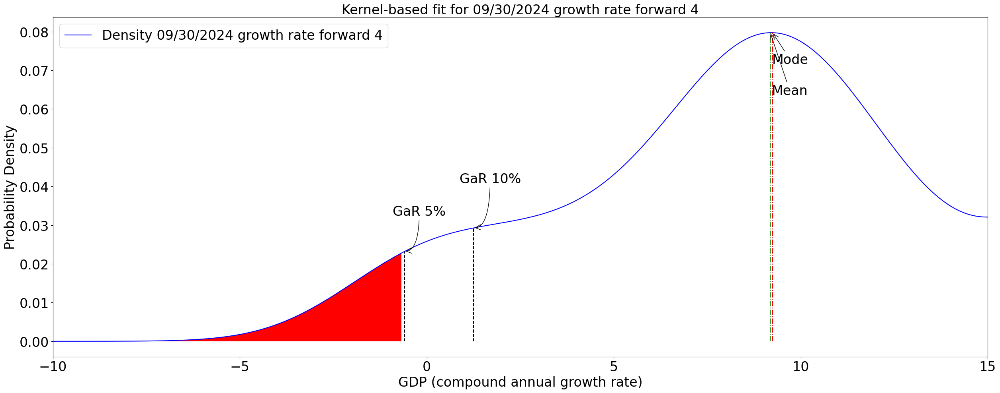

In [150]:
horizon = 4
plot_date = latest_date
method = 'Kernel-based'
mpi_shock = 0
pred_index = (horizon, plot_date, mpi_shock)
dist_index = (horizon, plot_date, method, mpi_shock)

x_list, yvals, ycdf = prediction_dfpdf.loc[dist_index].values.T
q5_index = np.argmin(np.abs(ycdf - 0.05))
q10_index = np.argmin(np.abs(ycdf - 0.1))
q40_index = np.argmin(np.abs(ycdf - 0.4))
q50_index = np.argmin(np.abs(ycdf - 0.5))
x_inc = (yvals[q40_index]-yvals[q5_index])/4
xq5 = x_list[q5_index]
yq5 = yvals[q5_index]
xq10 = x_list[q10_index]
yq10 = yvals[q10_index]
xq50 = x_list[q50_index]
yq50 = yvals[q50_index]

fig, ax = plt.subplots(1, 1, figsize=(25, 10))
titlestr = f"{method} fit for "+plot_date.strftime('%m/%d/%Y')+" "+"growth rate"+" forward "+str(horizon)
lablestr = "Density "+plot_date.strftime('%m/%d/%Y')+" "+"growth rate"+" forward "+str(horizon)
ax.fill_between(x_list[:q5_index], 0, yvals[:q5_index],  facecolor='red', interpolate=True)
ax.plot(x_list, yvals, 'b-', label=lablestr)

# plot design
ax.set_title(titlestr, fontsize=24)
ax.legend(fontsize=24)
ax.tick_params(labelsize=24)
# ax.set_ylim(0, 1.3 * max(yvals))
# ax.set_xlim(xq5-2, xq50+4)
plt.ylabel('Probability Density', fontsize=24)
plt.xlabel('GDP (compound annual growth rate)', fontsize=24)

# plot mod
modx = x_list[np.argmax(yvals)]
mody = yvals.max()
ax.plot([modx, modx], [0, mody], 'r-.')
ax.annotate('Mode', xy=(modx, mody), xycoords='data',
            xytext=(modx-x_inc, mody*0.9), textcoords='data',
            arrowprops=dict(arrowstyle="->",
            connectionstyle="arc3"), fontsize=24)

# plot mean
meanx = x_list @ (yvals/yvals.sum())
meany = yvals[np.argmin(np.abs(x_list-meanx))]
ax.plot([meanx, meanx], [0, meany], 'g-.')
ax.annotate('Mean', xy=(meanx, meany), xycoords='data',
            xytext=(meanx+x_inc*3, meany*0.8), textcoords='data',
            arrowprops=dict(arrowstyle="->",
            connectionstyle="arc3"), fontsize=24)

# plot tails
ax.plot([xq5, xq5], [0, yq5], 'k--')
ax.annotate('GaR 5%', xy=(xq5, yq5), xycoords='data',
            xytext=(xq5-x_inc*25, yq5*1.4), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="angle3,angleA=90,angleB=0"), fontsize=24)
ax.plot([xq10, xq10], [0, yq10], 'k--')
ax.annotate('GaR 10%', xy=(xq10, yq10), xycoords='data',
            xytext=(xq10-x_inc*30, yq10*1.4), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="angle3,angleA=90,angleB=0"), fontsize=24)
plt.tight_layout()
plt.xlim((-10, 15))
# plt.savefig('../results/arm_qr_gdp_kde_dist.png', bbox_inches='tight', dpi=300)
plt.show()

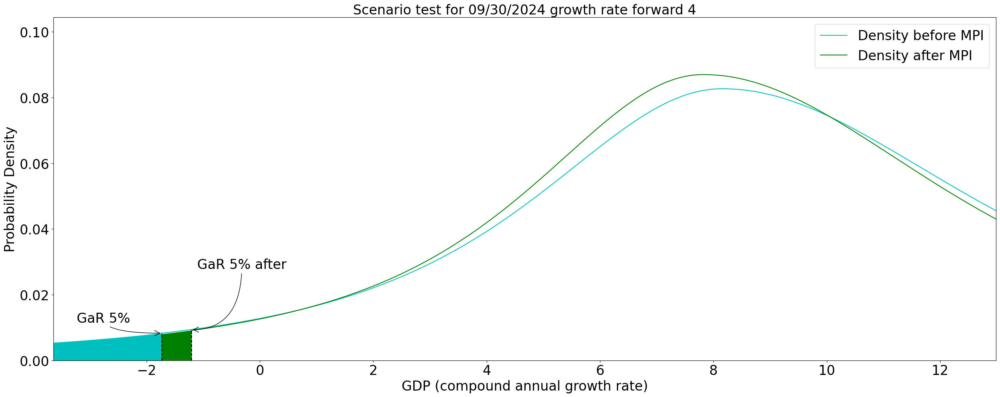

In [151]:
horizon = 4
plot_date = latest_date
method = 'T-skew'
mpi_shock = 0.5
dist_index = (horizon, plot_date, method)

plot_cols = prediction_dfpdf.loc[dist_index].loc[[0, mpi_shock]].unstack(level=0).iloc[:, [0, 2, 3, 4, 5]]
x_list, yvals, yvals_shocked, ycdf, ycdf_shocked = plot_cols.values.T
q5_index = np.argmin(np.abs(ycdf - 0.05))
q5_index_shock = np.argmin(np.abs(ycdf_shocked - 0.05))
q50_index = np.argmin(np.abs(ycdf - 0.5))
q50_index_shock = np.argmin(np.abs(ycdf_shocked - 0.5))
x_tail = np.min([x_list[q5_index], x_list[q5_index_shock]])
x_front = np.max([x_list[q50_index], x_list[q50_index_shock]])

fig, ax = plt.subplots(1, 1, figsize=(25, 10))
titlestr = "Scenario test for "+plot_date.strftime('%m/%d/%Y')+" "+"growth rate"+" forward "+str(horizon)
lablestr = "Density before MPI"
lablestr_shocked = "Density after MPI"

ax.plot(x_list[q5_index-1:], yvals[q5_index-1:], 'c-', label=lablestr)
ax.plot(x_list[q5_index_shock-1:], yvals_shocked[q5_index_shock-1:], 'g-', label=lablestr_shocked)
if yvals[q5_index] > yvals_shocked[q5_index_shock]:
    ax.fill_between(x_list[:q5_index], 0, yvals[:q5_index],  facecolor='c', interpolate=True)
    ax.fill_between(x_list[:q5_index_shock], 0, yvals_shocked[:q5_index_shock],  facecolor='g', interpolate=True)
else:
    ax.fill_between(x_list[:q5_index_shock], 0, yvals_shocked[:q5_index_shock],  facecolor='g', interpolate=True)
    ax.fill_between(x_list[:q5_index], 0, yvals[:q5_index],  facecolor='c', interpolate=True)

# plot design
ax.set_title(titlestr, fontsize=24)
ax.legend(fontsize=24)
ax.tick_params(labelsize=24)
ax.set_xlim(x_tail-2, x_front+4)
ax.set_ylim(0, max(max(yvals), max(yvals_shocked))*1.2)
ax.set_ylabel('Probability Density', fontsize=24)
ax.set_xlabel('GDP (compound annual growth rate)', fontsize=24)

# plot tails
xq5 = x_list[q5_index-1]
yq5 = yvals[q5_index-1]
xq5_shock = x_list[q5_index_shock-1]
yq5_shock = yvals_shocked[q5_index_shock]
ax.plot([xq5, xq5], [0, yq5], 'k--')
ax.annotate('GaR 5%', xy=(xq5, yq5), xycoords='data',
            xytext=(xq5-1.5, yq5*1.4), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="angle3,angleA=90,angleB=0"), fontsize=24)
ax.plot([xq5_shock, xq5_shock], [0, yq5_shock], 'k--')
ax.annotate('GaR 5% after', xy=(xq5_shock, yq5_shock), xycoords='data',
            xytext=(xq5_shock+0.1, yq5_shock*3), textcoords='data',
            arrowprops=dict(arrowstyle="->",
                            connectionstyle="angle3,angleA=90,angleB=0"), fontsize=24)
# ax.legend([])
plt.tight_layout()
# plt.savefig('../results/arm_qr_gdp_dist_MPI_direct_shock.png', bbox_inches='tight', dpi=300)
plt.show()

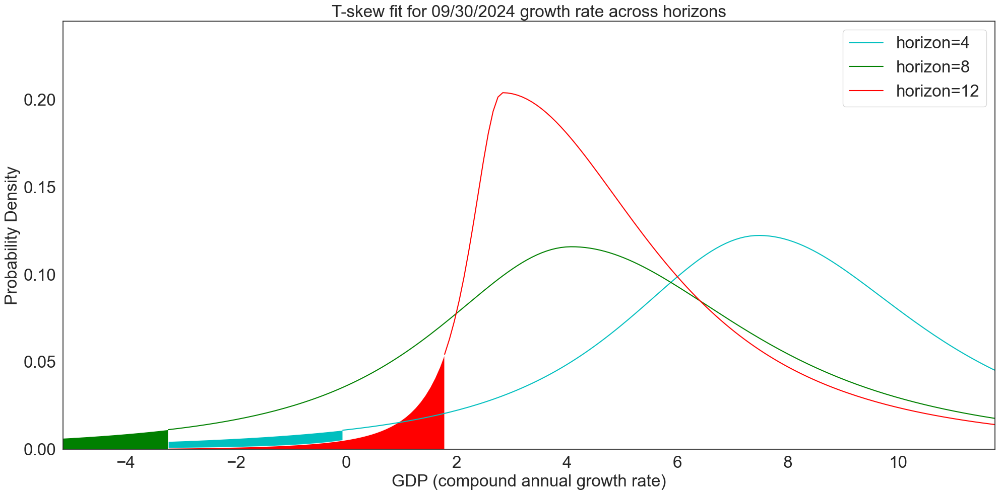

In [158]:
plot_date = latest_date
method = 'T-skew'
mpi_shocked = 0

dist_index_h4 = (4, plot_date - pd.DateOffset(years=1), method, mpi_shocked)
dist_index_h8 = (8, plot_date - pd.DateOffset(years=2), method, mpi_shocked)
dist_index_h12 = (12, plot_date - pd.DateOffset(years=3), method, mpi_shocked)
dist_index_h16 = (16, plot_date - pd.DateOffset(years=3), method, mpi_shocked)
dist_index_h20 = (20, plot_date - pd.DateOffset(years=3), method, mpi_shocked)

x_list, yvals_h4, ycdf_h4 = prediction_dfpdf.loc[dist_index_h4].values.T
x_list, yvals_h8, ycdf_h8 = prediction_dfpdf.loc[dist_index_h8].values.T
x_list, yvals_h12, ycdf_h12 = prediction_dfpdf.loc[dist_index_h12].values.T
x_list, yvals_h16, ycdf_h16 = prediction_dfpdf.loc[dist_index_h16].values.T
x_list, yvals_h20, ycdf_h20 = prediction_dfpdf.loc[dist_index_h20].values.T

q5h4_index = np.argmin(np.abs(ycdf_h4 - 0.05))
q5h8_index = np.argmin(np.abs(ycdf_h8 - 0.05))
q5h12_index = np.argmin(np.abs(ycdf_h12 - 0.05))
q5h16_index = np.argmin(np.abs(ycdf_h16 - 0.05))
q5h20_index = np.argmin(np.abs(ycdf_h20 - 0.05))

q50h4_index = np.argmin(np.abs(ycdf_h4 - 0.5))
q50h8_index = np.argmin(np.abs(ycdf_h8 - 0.5))
q50h12_index = np.argmin(np.abs(ycdf_h12 - 0.5))
q50h16_index = np.argmin(np.abs(ycdf_h16 - 0.5))
q50h20_index = np.argmin(np.abs(ycdf_h20 - 0.5))

x_tail = np.min([x_list[q5h4_index], x_list[q5h8_index], x_list[q5h12_index], x_list[q5h16_index], x_list[q5h20_index]])
x_front = np.max([x_list[q50h4_index], x_list[q50h8_index], x_list[q50h12_index], x_list[q50h16_index], x_list[q50h20_index]])

fig, ax = plt.subplots(1, 1, figsize=(20, 10))
titlestr = f"{method} fit for "+plot_date.strftime('%m/%d/%Y')+" "+"growth rate across horizons"
hz = "horizon={h}".format

ax.plot(x_list[q5h4_index-1:], yvals_h4[q5h4_index-1:], 'c-', label=hz(h=4))
ax.plot(x_list[q5h8_index-1:], yvals_h8[q5h8_index-1:], 'g-', label=hz(h=8))
ax.plot(x_list[q5h12_index-1:], yvals_h12[q5h12_index-1:], 'r-', label=hz(h=12))

ax.fill_between(x_list[:q5h4_index], 0, yvals_h4[:q5h4_index],  facecolor='c', interpolate=True)
ax.fill_between(x_list[:q5h12_index], 0, yvals_h12[:q5h12_index],  facecolor='r', interpolate=True)
ax.fill_between(x_list[:q5h8_index], 0, yvals_h8[:q5h8_index],  facecolor='g', interpolate=True)

# plot design
ax.set_title(titlestr, fontsize=24)
ax.legend(fontsize=24)
ax.tick_params(labelsize=24)
ax.set_xlim(x_tail-2, x_front+4)
ax.set_ylim(0, max(max(yvals_h4), max(yvals_h8), max(yvals_h12))*1.2)
ax.set_ylabel('Probability Density', fontsize=24)
ax.set_xlabel('GDP (compound annual growth rate)', fontsize=24)

plt.tight_layout()
# plt.savefig('../results/arm_qr_pred_dist_horizons.png', bbox_inches='tight', dpi=300)
plt.show()

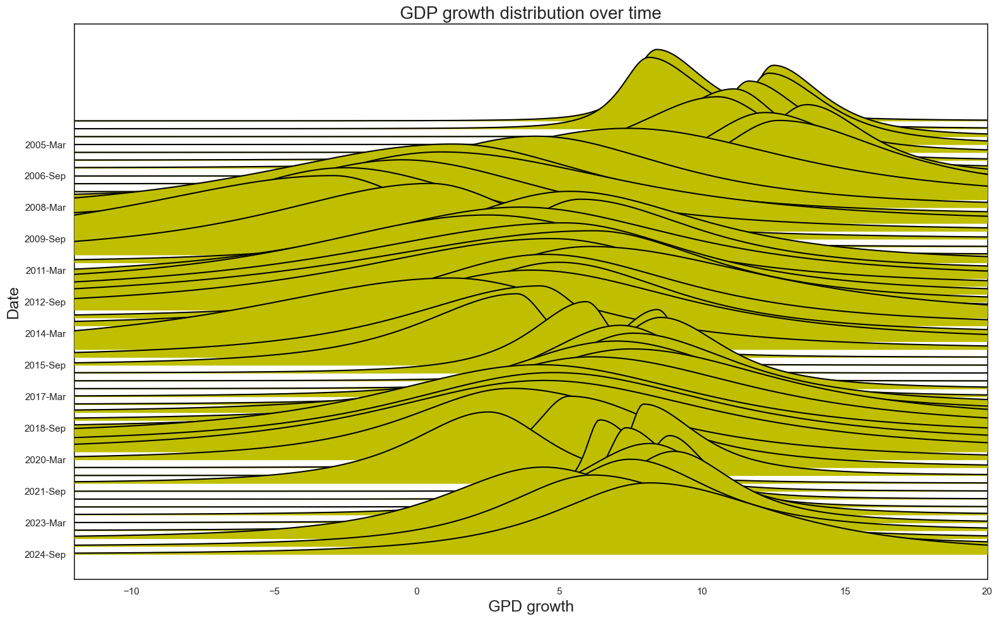

In [163]:
# data setup
horizon = 4
method = 'T-skew'
mpi_shock = 0
dist_index = (horizon, method, mpi_shock)

plot_data = prediction_dfpdf.reorder_levels(['horizon', 'method', 'MPI_shock', 'date', 'index']).sort_index().loc[dist_index]
plot_data = plot_data.reset_index('index', drop=True)
target_max = plot_data.groupby('date')['PDF_y'].max().median()
plot_data['PDF_y'] = plot_data['PDF_y'].groupby('date').apply(lambda x: (x / x.max()) * target_max).values

# plotting
plt.figure(figsize=(16, 10))
ridgeline_custom(plot_data['PDF_x'], plot_data['PDF_y'], overlap=0.99, fill=True,
                 outline=True, inline=False, y_fontsize=14, y_interval=4,
                 dist_density=3, line_color='k', fill_color='y')
plt.title('GDP growth distribution over time', fontsize=20)
plt.xlabel('GPD growth', fontsize=18)
plt.ylabel('Date', fontsize=18)
plt.xlim(-12, 20)
plt.tight_layout()
# plt.savefig('../results/arm_qr_gdp_dist_ridge.png', bbox_inches='tight', dpi=300)
plt.show()

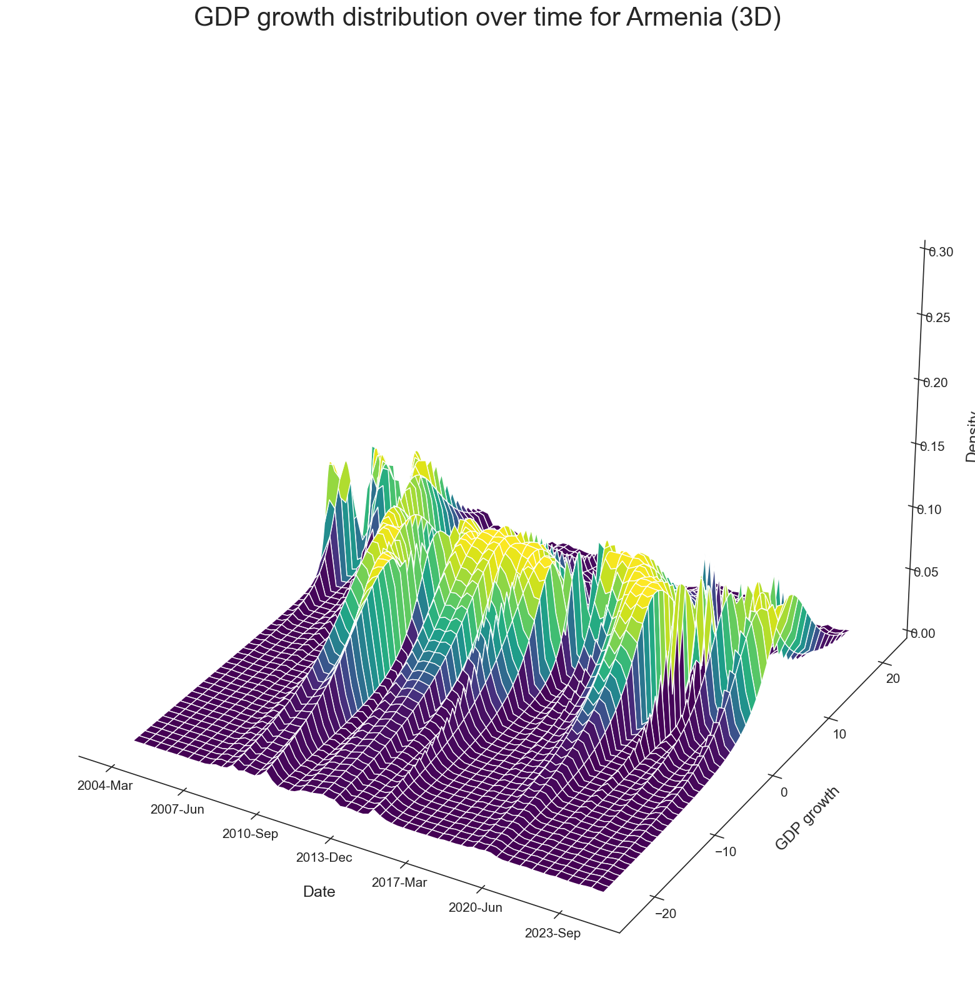

In [164]:
# custom outline
sns.set_theme(style="white", palette='viridis')

# Data preparation
gdp_growth = plot_data['PDF_x'].groupby('date').apply(lambda x: list(x)).apply(lambda x: pd.Series(x))
gdp_density = plot_data['PDF_y'].groupby('date').apply(lambda x: list(x)).apply(lambda x: pd.Series(x))
dates = gdp_growth.index
dates_grid = np.repeat(dates, len(gdp_growth.columns)).to_numpy().reshape(-1, len(gdp_growth.columns))
dates_grid_values = np.repeat(np.arange(len(dates)), len(gdp_growth.columns)).reshape(-1, len(gdp_growth.columns))

# 3D plotting
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(dates_grid_values, gdp_growth, gdp_density, cmap=cm.viridis,
                norm=matcolors.SymLogNorm(linthresh=0.02, linscale=0.03))
ax.set_xticks(np.arange(len(dates))[0::13])
ax.set_xticklabels(dates[0::13].strftime('%Y-%b'))
ax.set_xlabel('Date', fontsize=18, labelpad=20)
ax.set_ylabel('GDP growth', fontsize=18, labelpad=20)
ax.set_zlabel('Density', fontsize=18, labelpad=20)
ax.tick_params(axis='both', which='major', labelsize=15)
ax.set_title('GDP growth distribution over time for Armenia (3D)', fontsize=30)

# make the panes transparent
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))

# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] = (1, 1, 1, 0)
ax.yaxis._axinfo["grid"]['color'] = (1, 1, 1, 0)
ax.zaxis._axinfo["grid"]['color'] = (1, 1, 1, 0)
ax.set_zlim(0, 0.3)
# plt.savefig('../results/GDP_growth_dist_3D_for_Armenia.png', bbox_inches='tight', dpi=300)
plt.show()

# Optimal policy

## setup

In [30]:
# theme setup and data loading
sns.set_theme(style='white')
horizons = list(range(4, 20+1, 4))
horizons_short = list(range(4, 12+1, 4))
quantiles = np.arange(0.05, 0.95, 0.05).round(2)
arm_bqcoef_nie = pd.read_pickle('../data/working_data/arm_bqcoef_nie.pkl')
gdp_dist_details = pd.read_pickle('../data/working_data/arm_gdp_dist_details.pkl')
prediction_dist_fit = pd.read_pickle('../data/working_data/arm_prediction_dist_fit.pkl')
prediction_dfpdf = pd.read_pickle('../data/working_data/arm_prediction_dfpdf.pkl')
exog = pd.read_pickle('../data/working_data/arm_exog.pkl')
X_selected = pd.read_pickle('../data/working_data/arm_X_selected.pkl')
Y = pd.read_pickle('../data/working_data/arm_Y.pkl')
Ar = pd.read_pickle('../data/working_data/arm_Ar.pkl')

# loading predictions
prediction = pd.read_pickle('../data/working_data/arm_prediction.pkl')
prediction_fitted = pd.read_pickle('../data/working_data/arm_prediction_fitted.pkl')

In [31]:
def suarez_utility(m, g, w):
    u = m - 0.5*w*(g**2)
    u.name = 'Utility'
    return u


def suarez_indifference_curve(g, w, u):
    return u+w*g**2/2

In [32]:
# fixing the optimal w
w_fixed = 0.08

# base
latest_date = parser.parse('2024-09-30')
ref_crisis_date = parser.parse('2020-03-31')

In [33]:
# tightening effects
effect_index_order = ['horizon', 'date', 'policy_type', 'MPI_shock', 'quantile']
report_index_order = ['date', 'quantile', 'MPI_shock', 'horizon', 'policy_type']

stable_tightening = prediction.loc[horizons_short].reset_index()
stable_tightening['policy_type'] = 'stable tightening'
stable_tightening = stable_tightening.set_index(effect_index_order)['pred']
stable_tightening.name = 'stable_tightening'

# loosening effects
crisis_loosening = prediction.loc[horizons_short].reset_index()
crisis_loosening['horizon'] = crisis_loosening['horizon'] + 8
crisis_loosening['MPI_shock'] = -1*crisis_loosening['MPI_shock']
crisis_loosening['policy_type'] = 'crisis loosening'
crisis_loosening = crisis_loosening.set_index(effect_index_order)['pred'].sort_index()
crisis_loosening_values = crisis_loosening.xs(ref_crisis_date + pd.DateOffset(years=1), level='date').values.copy()
crisis_loosening = crisis_loosening.unstack('date')
crisis_loosening.loc[:, :] = np.array([crisis_loosening_values]*crisis_loosening.shape[1]).T
crisis_loosening = crisis_loosening.stack('date').reorder_levels(effect_index_order).sort_index()
crisis_loosening.name = 'crisis_loosening'

# MPI effects
mpi_policy_effects = pd.concat([stable_tightening, crisis_loosening]).sort_index().unstack('MPI_shock')
mpi_policy_effects = mpi_policy_effects.sub(mpi_policy_effects[0], axis=0).stack('MPI_shock')
mpi_policy_effects = mpi_policy_effects.reorder_levels(report_index_order).sort_index()
mpi_policy_effects.name = 'deta'
mpi_effects = mpi_policy_effects.groupby(report_index_order[:-1]).sum().sort_index()
mpi_effects_index = mpi_effects.index
mpi_effects = pd.merge(mpi_effects, prediction.xs(0, level='MPI_shock').rename('No policy'), 'left', on=['date', 'quantile', 'horizon'])
mpi_effects.index = mpi_effects_index
mpi_effects['pred'] = mpi_effects['deta'] + mpi_effects['No policy']

In [34]:
# setup
suarez_weights = np.linspace(0.01, 1, 100).round(4)
q_names = {0.1: 'GaR', 0.5: 'GDPq50'}

# estimation
growth_possibilities = prediction.unstack('quantile').rename(columns=q_names)[q_names.values()]
growth_possibilities['Gap'] = (growth_possibilities['GDPq50'] - growth_possibilities['GaR']).clip(0)
growth_possibilities_today = growth_possibilities.loc[4, latest_date].copy()

# calculating utility
growth_options = []
for w in suarez_weights:
    gp = growth_possibilities.copy()
    gp['Utility'] = suarez_utility(gp['GDPq50'], gp['Gap'], w)
    gp['w'] = w
    gp.set_index('w', append=True, inplace=True)
    growth_options.append(gp)
growth_options = pd.concat(growth_options)
growth_options = growth_options.reorder_levels(['horizon', 'date', 'w', 'MPI_shock'])
growth_options = growth_options.sort_index()

# utility choice set
growth_welfare = growth_options['Utility'].unstack(['horizon']).copy()

# possibility line comparison
possibility_line = growth_possibilities.unstack('horizon')
possibility_line_today = possibility_line.loc[latest_date]

In [35]:
growth_possibilities_tl = mpi_effects['pred'].reorder_levels(prediction.index.names).sort_index()
growth_possibilities_tl = growth_possibilities_tl.unstack('quantile').rename(columns=q_names)[q_names.values()]
growth_possibilities_tl['Gap'] = (growth_possibilities_tl['GDPq50'] - growth_possibilities_tl['GaR']).clip(0)

# calculating utility
growth_options_tl = []
for w in suarez_weights:
    gp = growth_possibilities_tl.copy()
    gp['Utility'] = suarez_utility(gp['GDPq50'], gp['Gap'], w)
    gp['w'] = w
    gp.set_index('w', append=True, inplace=True)
    growth_options_tl.append(gp)
growth_options_tl = pd.concat(growth_options_tl)
growth_options_tl = growth_options_tl.reorder_levels(['horizon', 'date', 'w', 'MPI_shock'])
growth_options_tl = growth_options_tl.sort_index()

# utility choice set
growth_welfare_tl = growth_options_tl['Utility'].unstack(['horizon']).copy()

# possibility line comparison
possibility_line_tl = growth_possibilities_tl.unstack('horizon')
possibility_line_tl_today = possibility_line_tl.loc[latest_date]

In [36]:
# deriving mpi choices
u_cols = [4, 8, 12]
# u_cols = [4, 12]
# u_cols = [4]
u_choices = growth_welfare[4].copy()
utility_choices = growth_welfare[u_cols].mean(axis=1)
u_choices.name = 'Utility'
utility_choices.name = 'Utility'
u_opt = u_choices.reset_index(u_choices.index.names[:-1]).groupby(u_choices.index.names[:-1]).max()
U_opt = utility_choices.reset_index(utility_choices.index.names[:-1]).groupby(utility_choices.index.names[:-1]).max()
u_opt_today = u_opt.loc[latest_date, w_fixed].item()
U_opt_today = U_opt.loc[latest_date, w_fixed].item()
mpi_choices = utility_choices.copy()
mpi_choices.name = 'MPI'
mpi_choices = mpi_choices.reset_index(mpi_choices.index.names[:-1]).groupby(mpi_choices.index.names[:-1]).idxmax()
mpi_choice_today = mpi_choices.loc[latest_date].squeeze()
s_opt_today = mpi_choice_today.loc[w_fixed]
print('MPI optimal', s_opt_today)

MPI optimal 0.5


In [37]:
# deriving mpi choices while accounting for the benefits of future loosening
u_cols = [4, 8, 12]
utility_choices_tl = growth_welfare_tl[u_cols].mean(axis=1)
utility_choices_tl.name = 'Utility'
U_opt_tl = utility_choices_tl.reset_index(utility_choices_tl.index.names[:-1]).groupby(utility_choices_tl.index.names[:-1]).max()
U_opt_tl_today = U_opt_tl.loc[latest_date, w_fixed].item()
mpi_choices_tl = utility_choices_tl.copy()
mpi_choices_tl.name = 'MPI'
mpi_choices_tl = mpi_choices_tl.reset_index(mpi_choices_tl.index.names[:-1]).groupby(mpi_choices_tl.index.names[:-1]).idxmax()
mpi_choices_tl_today = mpi_choices_tl.loc[latest_date].squeeze()
s_opt_tl_today = mpi_choices_tl_today.loc[w_fixed]
print('MPI optimal', s_opt_tl_today)

MPI optimal 1.25


In [38]:
# MPI today
q_names = {0.1: 'tail', 0.5: 'median'}
qn_names = {"GaR": 'tail', "GDPq50": 'median'}
mpi_policy_effects_today = mpi_policy_effects.unstack('quantile').rename(columns=q_names)[q_names.values()]
mpi_policy_effects_today = mpi_policy_effects_today.loc[latest_date, s_opt_today]
mpi_policy_effects_today = mpi_policy_effects_today.stack().unstack('horizon').fillna(0)

# # growth today
go_h = growth_options_tl[['GaR', 'GDPq50', 'Gap']].rename(columns=qn_names).copy()
growth_options_today_np = go_h.stack().unstack('horizon').loc[latest_date, w_fixed, 0].round(2)
growth_options_today_np["action"] = "No Policy"
growth_options_today_np = growth_options_today_np.set_index("action", append=True)
growth_options_today_p = go_h.stack().unstack('horizon').loc[latest_date, w_fixed, s_opt_today].round(2)
growth_options_today_p["action"] = "Policy"
growth_options_today_p = growth_options_today_p.set_index("action", append=True)
growth_options_today = pd.concat([growth_options_today_np, growth_options_today_p])

In [39]:
# deriving indifference curve
gpt = growth_possibilities_today.copy()
growth_possibilities_today['GDPq50_u_IC'] = suarez_indifference_curve(gpt['Gap'], w_fixed, u_opt_today)
growth_possibilities_today['GDPq50_U_IC'] = suarez_indifference_curve(gpt['Gap'], w_fixed, U_opt_today)

# estimating other indifference curves
u_range = 3
indifference_curves = growth_possibilities_today[['Gap']].copy()
visible_Us = np.linspace(U_opt_today-u_range, U_opt_today+u_range, 5).round(2)
for u in visible_Us:
    indifference_curves[f'GDPq50_{u}'] = suarez_indifference_curve(gpt['Gap'], w_fixed, u)

In [40]:
# deriving indifference curve
gpt = growth_possibilities_today.copy()
growth_possibilities_today['GDPq50_u_IC'] = suarez_indifference_curve(gpt['Gap'], w_fixed, u_opt_today)
growth_possibilities_today['GDPq50_U_IC'] = suarez_indifference_curve(gpt['Gap'], w_fixed, U_opt_today)
growth_possibilities_today['GDPq50_tl_U_IC'] = suarez_indifference_curve(gpt['Gap'], w_fixed, U_opt_tl_today)

# estimating other indifference curves
u_range = 3
indifference_curves = growth_possibilities_today[['Gap']].copy()
visible_Us = np.linspace(U_opt_today-u_range, U_opt_today+u_range, 5).round(2)
for u in visible_Us:
    indifference_curves[f'GDPq50_{u}'] = suarez_indifference_curve(gpt['Gap'], w_fixed, u)

## suarez utility curve

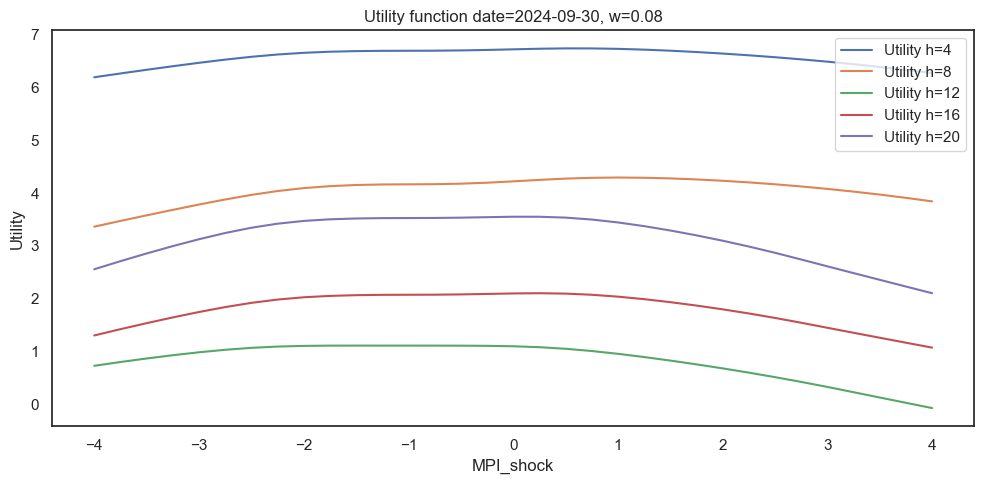

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
growth_welfare.loc[latest_date, w_fixed][4].plot(ax=ax)
growth_welfare.loc[latest_date, w_fixed][8].plot(ax=ax)
growth_welfare.loc[latest_date, w_fixed][12].plot(ax=ax)
growth_welfare.loc[latest_date, w_fixed][16].plot(ax=ax)
growth_welfare.loc[latest_date, w_fixed][20].plot(ax=ax)
ax.set_ylabel('Utility')
ax.set_title(f'Utility function date={latest_date.strftime("%Y-%m-%d")}, w={w_fixed}')
ax.legend(['Utility h=4', 'Utility h=8', 'Utility h=12', 'Utility h=16', 'Utility h=20'])
plt.tight_layout()
plt.show()

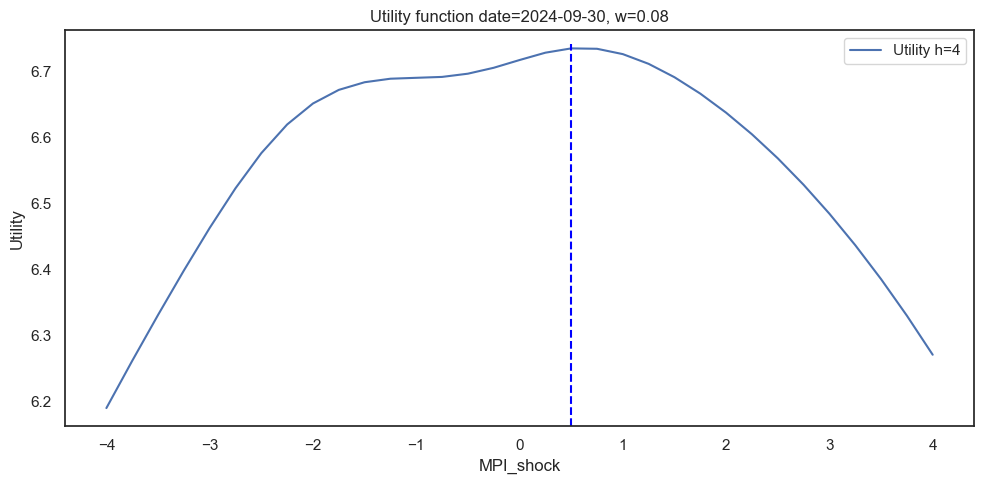

In [42]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
growth_welfare.loc[latest_date, w_fixed][4].plot(ax=ax)
u_ymin, u_ymax = ax.get_ylim()
point_offset = -0.03
ax.axvline(x=s_opt_today, ymax=u_opt_today/u_ymax+point_offset, color='blue', linestyle='--')
ax.set_ylabel('Utility')
ax.set_title(f'Utility function date={latest_date.strftime("%Y-%m-%d")}, w={w_fixed}')
ax.legend(['Utility h=4'])
plt.tight_layout()
# plt.savefig('../results/arm_suarez_utility.png', bbox_inches='tight', dpi=300)
plt.show()

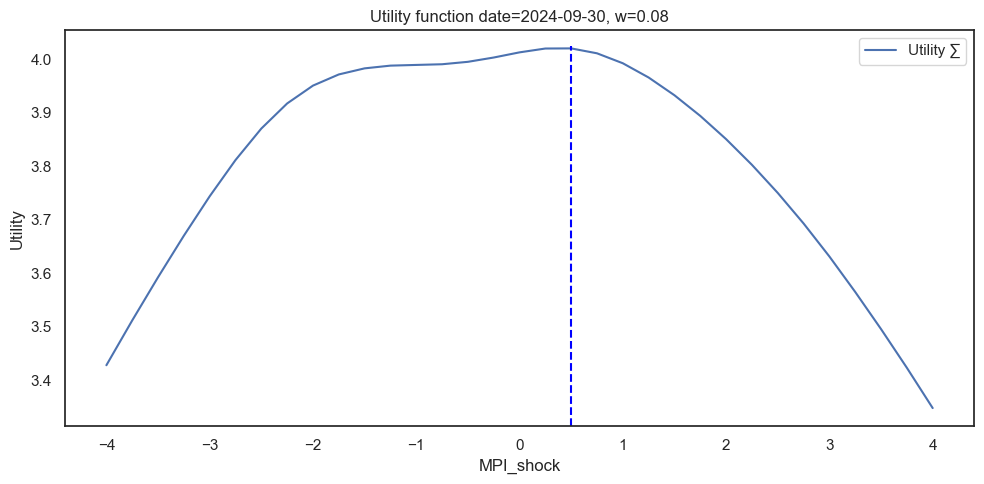

In [43]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
utility_choices.loc[latest_date, w_fixed].plot(ax=ax)
u_ymin, u_ymax = ax.get_ylim()
ax.axvline(x=s_opt_today, ymax=U_opt_today/u_ymax+point_offset, color='blue', linestyle='--')
ax.set_ylabel('Utility')
ax.set_title(f'Utility function date={latest_date.strftime("%Y-%m-%d")}, w={w_fixed}')
ax.legend(['Utility ∑'])
plt.tight_layout()
# plt.savefig('../results/arm_suarez_discounted_utility.png', bbox_inches='tight', dpi=300)
plt.show()

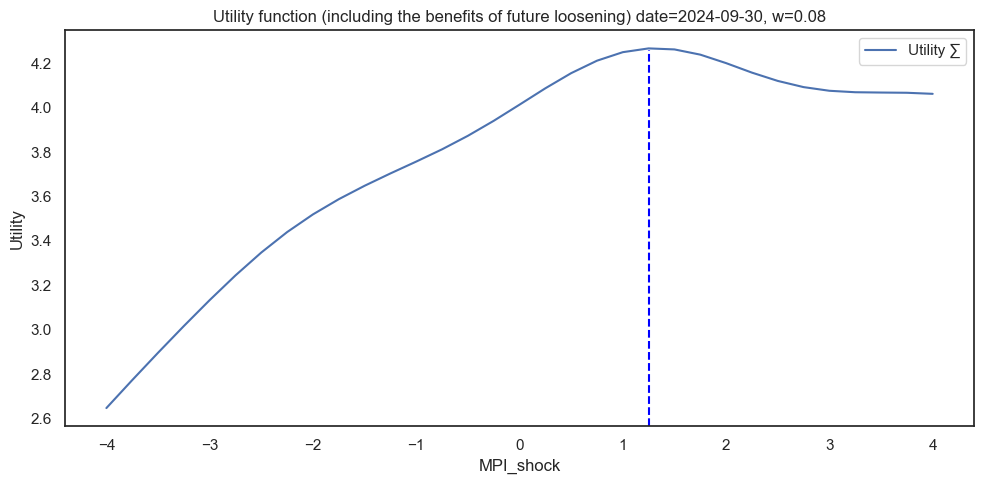

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
utility_choices_tl.loc[latest_date, w_fixed].plot(ax=ax)
u_ymin, u_ymax = ax.get_ylim()
ax.axvline(x=s_opt_tl_today, ymax=U_opt_tl_today/u_ymax+point_offset, color='blue', linestyle='--')
ax.set_ylabel('Utility')
ax.set_title(f'Utility function (including the benefits of future loosening) date={latest_date.strftime("%Y-%m-%d")}, w={w_fixed}')
ax.legend(['Utility ∑'])
plt.tight_layout()
plt.savefig('../results/arm_suarez_discounted_utility_tl.png', bbox_inches='tight', dpi=300)
plt.show()

## possibility line

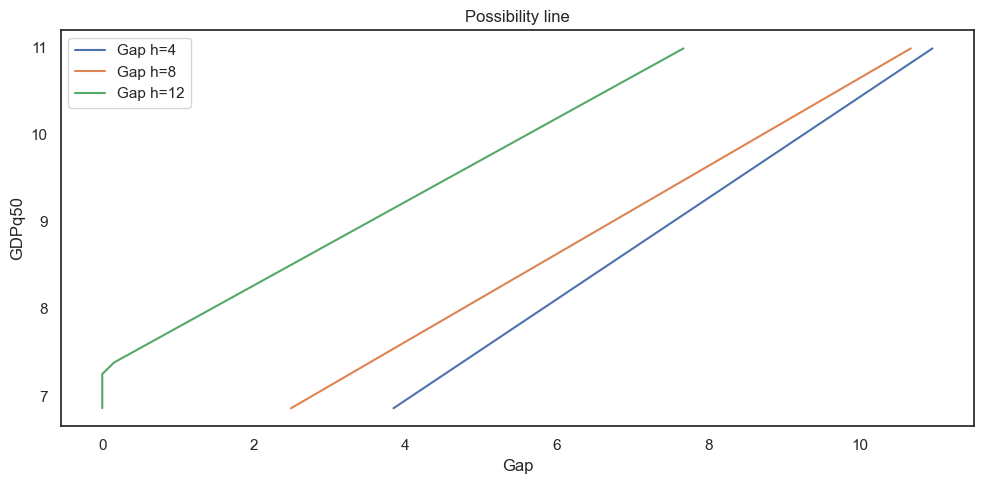

In [45]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
possibility_line_today.loc[:, [('GDPq50', 4), ('Gap', 4)]].droplevel('horizon', axis=1).set_index('Gap').plot(ax=ax)
possibility_line_today.loc[:, [('GDPq50', 4), ('Gap', 8)]].droplevel('horizon', axis=1).set_index('Gap').plot(ax=ax)
possibility_line_today.loc[:, [('GDPq50', 4), ('Gap', 12)]].droplevel('horizon', axis=1).set_index('Gap').plot(ax=ax)
ax.set_ylabel('GDPq50')
ax.legend(['Gap h=4', 'Gap h=8', 'Gap h=12'])
ax.set_title('Possibility line')
plt.tight_layout()
plt.show()

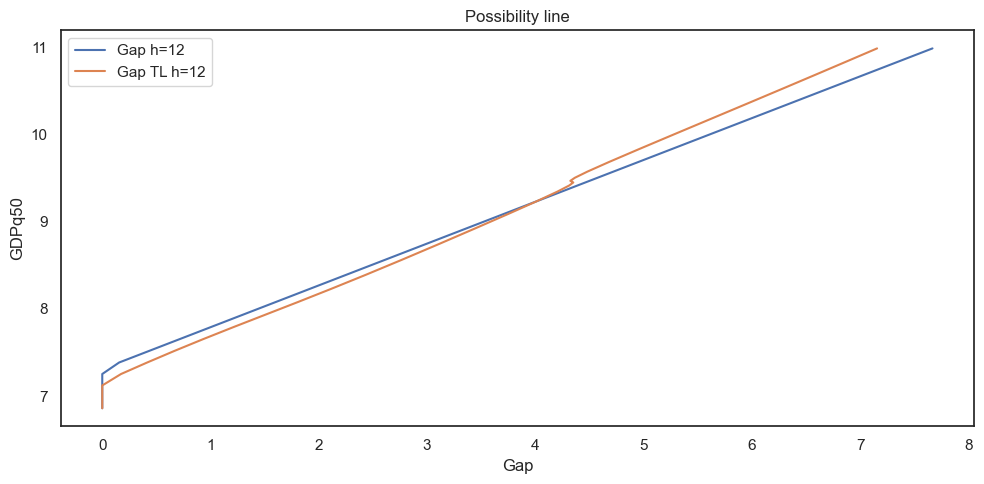

In [46]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
possibility_line_today.loc[:, [('GDPq50', 4), ('Gap', 12)]].droplevel('horizon', axis=1).set_index('Gap').plot(ax=ax)
possibility_line_tl_today.loc[:, [('GDPq50', 4), ('Gap', 12)]].droplevel('horizon', axis=1).set_index('Gap').plot(ax=ax)
ax.set_ylabel('GDPq50')
ax.legend(['Gap h=12', 'Gap TL h=12'])
ax.set_title('Possibility line')
plt.tight_layout()
plt.show()

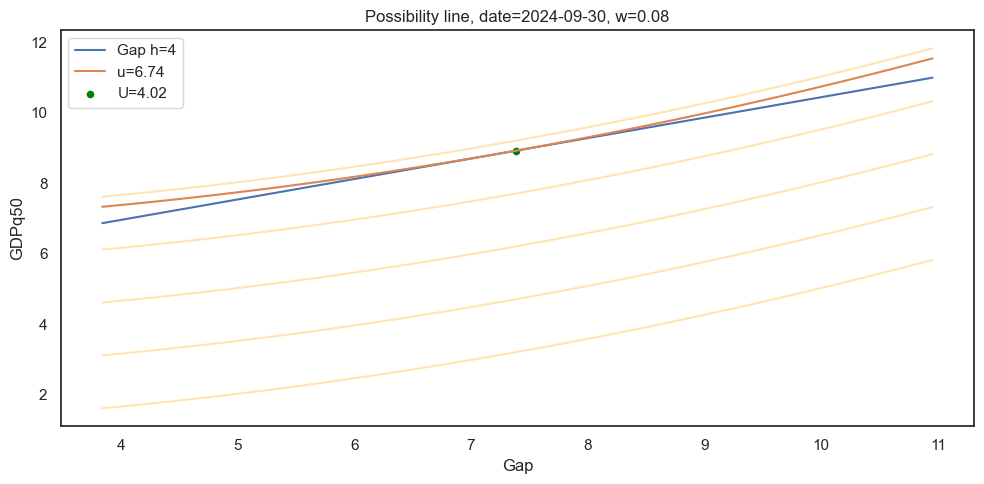

In [47]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
line_label = 'Gap h=4'
u_label = f'u={np.round(u_opt_today, 2).item()}'
U_label = f'U={np.round(U_opt_today, 2).item()}'
possibility_line_today.loc[:, [('GDPq50', 4), ('Gap', 4)]].droplevel('horizon', axis=1).set_index('Gap').plot(ax=ax)
growth_possibilities_today.set_index('Gap')['GDPq50_u_IC'].plot(ax=ax, label=u_label)
# growth_possibilities_today['GDPq50_U_IC'].plot(ax=ax, label=U_label)
growth_possibilities_today.loc[[s_opt_today]].plot(x='Gap', y='GDPq50', kind='scatter', color='green', ax=ax)
indifference_curves.set_index('Gap').plot(ax=ax, alpha=0.3, color='orange')
ax.legend([line_label, u_label, U_label])
ax.set_ylabel('GDPq50')
ax.set_title(f'Possibility line, date={latest_date.strftime("%Y-%m-%d")}, w={w_fixed}')
plt.tight_layout()
# ax.set_ylim(6, 11)
# plt.savefig('../results/arm_possibility_line.png', bbox_inches='tight', dpi=300)
plt.show()

## theory

In [48]:
fit_params = {
    'fittype': 'T-skew',
    'mode': {'constraint': 'Free', 'value': None, 'bandwidth': None},
    'qsmooth': None,
    'qsmooth_period': 4,
    'plot_mode': True,
    'plot_median': True,
    'plot_mean': True,
    'dof': {'constraint': 'Default', 'value': None},
    'var_low': {'constraint': 'Default', 'value': None},
    'var_high': {'constraint': 'Default', 'value': None},
    'skew_low': {'constraint': 'Default', 'value': None},
    'skew_high': {'constraint': 'Default', 'value': None}
}

In [49]:
# estimating the unconditional GDP growth distribution
kde_growth = sm.nonparametric.KDEUnivariate(Y['GDP_real_growth_hz_1.0y']).fit()
x_growth, y_density = (kde_growth.support, kde_growth.density)
gdp_growth_median = Y['GDP_real_growth_hz_1.0y'].median()
gdp_growth_tail = Y['GDP_real_growth_hz_1.0y'].quantile(0.1)
gdp_growth_gap = gdp_growth_median - gdp_growth_tail

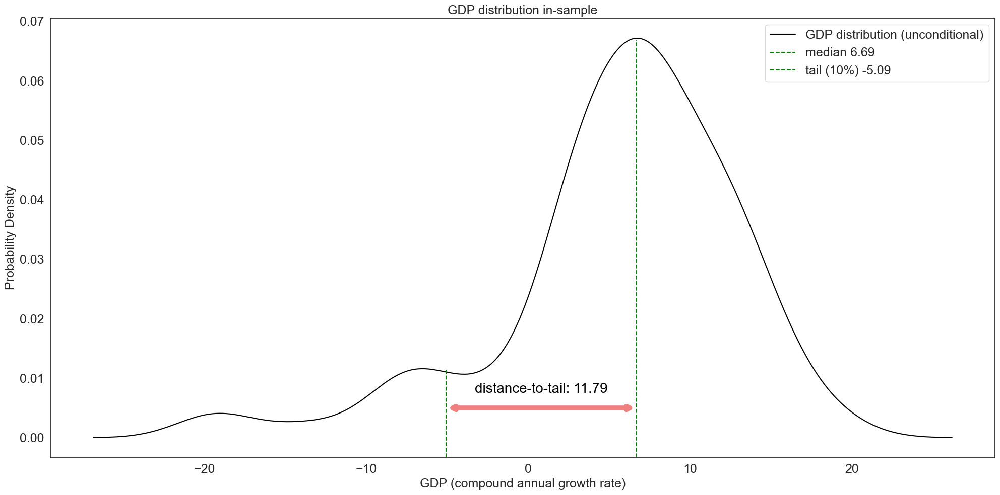

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(20, 10))
titlestr = "GDP distribution in-sample"
ax.plot(x_growth, y_density, 'black', label='GDP distribution (unconditional)')
ax.axvline(x=gdp_growth_median, ymax=0.95, color='green', linestyle='--', label=f'median {np.round(gdp_growth_median, 2)}')
ax.axvline(x=gdp_growth_tail, ymax=0.2, color='green', linestyle='--', label=f'tail (10%) {np.round(gdp_growth_tail, 2)}')
anthight = 0.005
ax.annotate('', xy=(gdp_growth_tail, anthight), xytext=(gdp_growth_median, anthight), 
            arrowprops=dict(arrowstyle="<->", color='lightcoral', lw=7))
ax.text(x=(gdp_growth_tail + gdp_growth_median) / 2, y=anthight+0.002, fontsize=20,
        s=f'distance-to-tail: {np.round(gdp_growth_gap, 2)}', color='black', ha='center', va='bottom')

# plot design
ax.set_title(titlestr, fontsize=18)
ax.legend(fontsize=18)
ax.tick_params(labelsize=18)
# ax.set_xlim(x_tail-2, x_front+4)
# ax.set_ylim(0, max(yvals)*1.05)
ax.set_ylabel('Probability Density', fontsize=18)
ax.set_xlabel('GDP (compound annual growth rate)', fontsize=18)
plt.tight_layout()
# plt.savefig('../results/theory_gdp_unconditional.png', bbox_inches='tight', dpi=300)
plt.show()

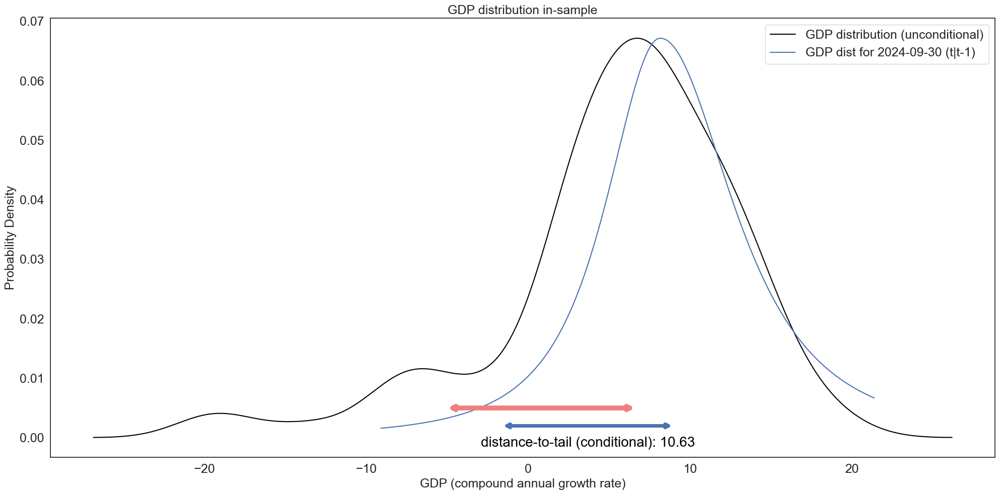

In [51]:
horizon = 4
plot_date = latest_date
method = 'T-skew'
mpi_shock = 0
dist_index = (horizon, plot_date, method, mpi_shock)

x_list, yvals, ycdf = prediction_dfpdf.loc[dist_index].values.T
q5_index = np.argmin(np.abs(ycdf - 0.05))
q50_index = np.argmin(np.abs(ycdf - 0.5))
x_tail = x_list[q5_index]
x_front = x_list[q50_index]
yvals_rescale = y_density.max()/yvals.max()
yvals = yvals*yvals_rescale

fig, ax = plt.subplots(1, 1, figsize=(20, 10))
titlestr = "GDP distribution in-sample"
lablestr_today_b = f"GDP dist for {latest_date.strftime('%Y-%m-%d')} (t|t-1)"
ax.plot(x_growth, y_density, 'black', label='GDP distribution (unconditional)')
ax.plot(x_list[q5_index-85:], yvals[q5_index-85:], 'b-', label=lablestr_today_b)

anthight_a = 0.005
anthight_b = 0.002
ax.annotate('', xy=(gdp_growth_tail, anthight_a), xytext=(gdp_growth_median, anthight_a), 
            arrowprops=dict(arrowstyle="<->", color='lightcoral', lw=7))
ax.annotate('', xy=(x_tail, anthight_b), xytext=(x_front, anthight_b), 
            arrowprops=dict(arrowstyle="<->", color='b', lw=5))
ax.text(x=(x_tail + x_front) / 2, y=anthight_b-0.004, fontsize=20,
        s=f'distance-to-tail (conditional): {np.round(x_front-x_tail, 2)}', 
        color='black', ha='center', va='bottom')

# plot design
ax.set_title(titlestr, fontsize=18)
ax.legend(fontsize=18)
ax.tick_params(labelsize=18)
# ax.set_xlim(x_tail-2, x_front+4)
# ax.set_ylim(0, max(yvals)*1.05)
ax.set_ylabel('Probability Density', fontsize=18)
ax.set_xlabel('GDP (compound annual growth rate)', fontsize=18)
plt.tight_layout()
# plt.savefig('../results/theory_gdp_conditional.png', bbox_inches='tight', dpi=300)
plt.show()

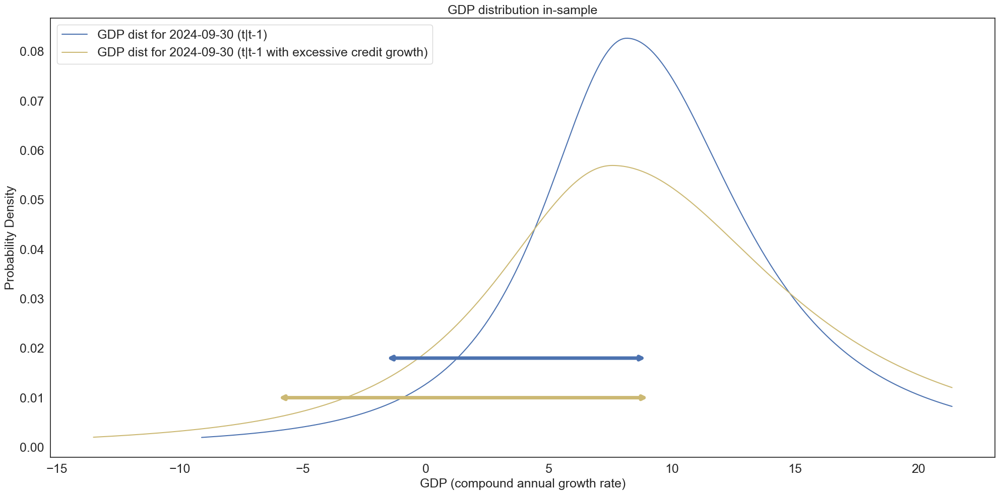

In [52]:
horizon = 4
plot_date = latest_date
method = 'T-skew'
mpi_shock = 0
dist_index = (horizon, plot_date, method, mpi_shock)

x_list, yvals, ycdf = prediction_dfpdf.loc[dist_index].values.T
q5_index = np.argmin(np.abs(ycdf - 0.05))
q50_index = np.argmin(np.abs(ycdf - 0.5))
x_tail = x_list[q5_index]
x_front = x_list[q50_index]

# estimate GDP dist in case of excessive credit growth 
gdp_dist_details_cs = gdp_dist_details.loc[horizon, plot_date].copy()
gdp_dist_details_cs = gdp_dist_details_cs.xs(mpi_shock, level='MPI_shock')
fcyi_cs = gdp_dist_details_cs.index.get_level_values('variable') == 'Financial Cycle Index'
fcyi_std = exog['Financial Cycle Index'].std()
gdp_dist_details_cs.loc[fcyi_cs, 'exog'] = gdp_dist_details_cs.loc[fcyi_cs, 'exog'] + fcyi_std*1
gdp_dist_details_cs['pred'] = gdp_dist_details_cs['exog'] * gdp_dist_details_cs['coeff']
prediction_cs = gdp_dist_details_cs.groupby('quantile')['pred'].sum()
pred_fit_cs = dist_fit(prediction_cs.to_dict(), fit_params)
pred_dfpdf_cs = gen_PDF_and_CDF(pred_fit_cs['model_fit'], fit_params['fittype'], x_list, pred_fit_cs['modx'])

x_list_cs, yvals_cs, ycdf_cs = pred_dfpdf_cs.values.T
q5_index_cs = np.argmin(np.abs(ycdf_cs - 0.05))
q50_index_cs = np.argmin(np.abs(ycdf_cs - 0.5))
x_tail_cs = x_list[q5_index_cs]
x_front_cs = x_list[q50_index_cs]

# stimate GDP dist in case of excessive credit growth with MPI tightening
mpi_shock_csm = 2
gdp_csm = gdp_dist_details.loc[horizon, plot_date].copy()
gdp_csm = gdp_csm.xs(mpi_shock_csm, level='MPI_shock')
fcyi_csm = gdp_csm.index.get_level_values('variable') == 'Financial Cycle Index'
fcyi_std = exog['Financial Cycle Index'].std()
gdp_csm.loc[fcyi_csm, 'exog'] = gdp_csm.loc[fcyi_csm, 'exog'] + fcyi_std*1
gdp_csm['pred'] = gdp_csm['exog'] * gdp_csm['coeff']
prediction_csm = gdp_csm.groupby('quantile')['pred'].sum()
pred_fit_csm = dist_fit(prediction_csm.to_dict(), fit_params)
pred_dfpdf_csm = gen_PDF_and_CDF(pred_fit_csm['model_fit'], fit_params['fittype'], x_list, pred_fit_csm['modx'])

x_list_csm, yvals_csm, ycdf_csm = pred_dfpdf_csm.values.T
q5_index_csm = np.argmin(np.abs(ycdf_csm - 0.05))
q50_index_csm = np.argmin(np.abs(ycdf_csm - 0.5))
x_tail_csm = x_list[q5_index_csm]
x_front_csm = x_list[q50_index_csm]

fig, ax = plt.subplots(1, 1, figsize=(20, 10))
titlestr = "GDP distribution in-sample"
lablestr_today_b = f"GDP dist for {latest_date.strftime('%Y-%m-%d')} (t|t-1)"
lablestr_today_cs = f"GDP dist for {latest_date.strftime('%Y-%m-%d')} (t|t-1 with excessive credit growth)"
lablestr_today_csm = f"GDP dist for {latest_date.strftime('%Y-%m-%d')} (t|t-1 with excessive credit growth and MPI)"
ax.plot(x_list[q5_index-85:], yvals[q5_index-85:], 'b-', label=lablestr_today_b)
ax.plot(x_list_cs[q5_index_cs-85:], yvals_cs[q5_index_cs-85:], 'y-', label=lablestr_today_cs)
# ax.plot(x_list_csm[q5_index_csm-85:], yvals_csm[q5_index_csm-85:], 'g-', label=lablestr_today_csm)

anthight_b = 0.018
anthight_cs = 0.010
anthight_csm = 0.002
ax.annotate('', xy=(x_tail, anthight_b), xytext=(x_front, anthight_b), 
            arrowprops=dict(arrowstyle="<->", color='b', lw=5))
ax.annotate('', xy=(x_tail_cs, anthight_cs), xytext=(x_front_cs, anthight_cs), 
            arrowprops=dict(arrowstyle="<->", color='y', lw=5))
# ax.annotate('', xy=(x_tail_csm, anthight_csm), xytext=(x_front_csm, anthight_csm), 
#             arrowprops=dict(arrowstyle="<->", color='g', lw=5))

# plot design
ax.set_title(titlestr, fontsize=18)
ax.legend(fontsize=18)
ax.tick_params(labelsize=18)
# ax.set_xlim(x_tail-2, x_front+4)
# ax.set_ylim(0, max(yvals)*1.05)
ax.set_ylabel('Probability Density', fontsize=18)
ax.set_xlabel('GDP (compound annual growth rate)', fontsize=18)
plt.tight_layout()
# plt.savefig('../results/theory_excessive_credit_growth.png', bbox_inches='tight', dpi=300)
plt.show()

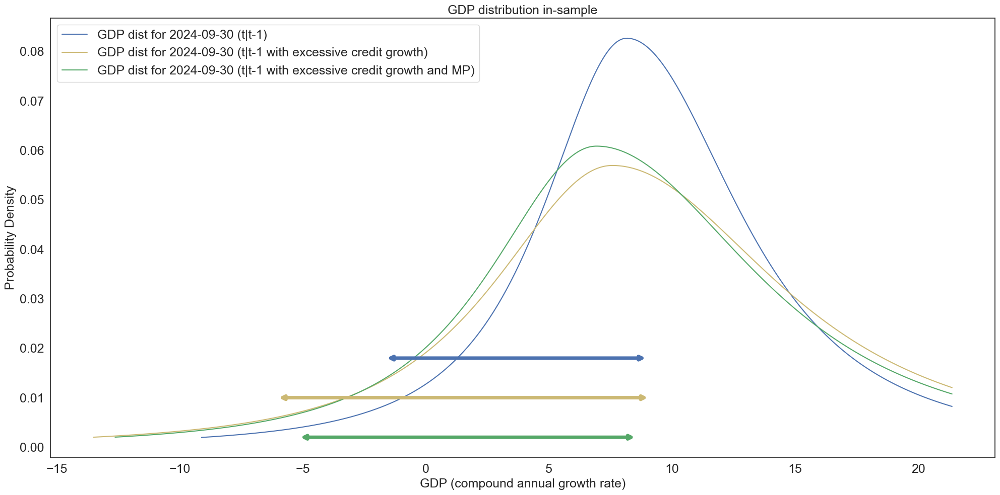

In [53]:
horizon = 4
plot_date = latest_date
method = 'T-skew'
mpi_shock = 0
dist_index = (horizon, plot_date, method, mpi_shock)

x_list, yvals, ycdf = prediction_dfpdf.loc[dist_index].values.T
q5_index = np.argmin(np.abs(ycdf - 0.05))
q50_index = np.argmin(np.abs(ycdf - 0.5))
x_tail = x_list[q5_index]
x_front = x_list[q50_index]

# estimate GDP dist in case of excessive credit growth 
gdp_dist_details_cs = gdp_dist_details.loc[horizon, plot_date].copy()
gdp_dist_details_cs = gdp_dist_details_cs.xs(mpi_shock, level='MPI_shock')
fcyi_cs = gdp_dist_details_cs.index.get_level_values('variable') == 'Financial Cycle Index'
fcyi_std = exog['Financial Cycle Index'].std()
gdp_dist_details_cs.loc[fcyi_cs, 'exog'] = gdp_dist_details_cs.loc[fcyi_cs, 'exog'] + fcyi_std*1
gdp_dist_details_cs['pred'] = gdp_dist_details_cs['exog'] * gdp_dist_details_cs['coeff']
prediction_cs = gdp_dist_details_cs.groupby('quantile')['pred'].sum()
pred_fit_cs = dist_fit(prediction_cs.to_dict(), fit_params)
pred_dfpdf_cs = gen_PDF_and_CDF(pred_fit_cs['model_fit'], fit_params['fittype'], x_list, pred_fit_cs['modx'])

x_list_cs, yvals_cs, ycdf_cs = pred_dfpdf_cs.values.T
q5_index_cs = np.argmin(np.abs(ycdf_cs - 0.05))
q50_index_cs = np.argmin(np.abs(ycdf_cs - 0.5))
x_tail_cs = x_list[q5_index_cs]
x_front_cs = x_list[q50_index_cs]

# stimate GDP dist in case of excessive credit growth with MPI tightening
mpi_shock_csm = 2
gdp_csm = gdp_dist_details.loc[horizon, plot_date].copy()
gdp_csm = gdp_csm.xs(mpi_shock_csm, level='MPI_shock')
fcyi_csm = gdp_csm.index.get_level_values('variable') == 'Financial Cycle Index'
fcyi_std = exog['Financial Cycle Index'].std()
gdp_csm.loc[fcyi_csm, 'exog'] = gdp_csm.loc[fcyi_csm, 'exog'] + fcyi_std*1
gdp_csm['pred'] = gdp_csm['exog'] * gdp_csm['coeff']
prediction_csm = gdp_csm.groupby('quantile')['pred'].sum()
pred_fit_csm = dist_fit(prediction_csm.to_dict(), fit_params)
pred_dfpdf_csm = gen_PDF_and_CDF(pred_fit_csm['model_fit'], fit_params['fittype'], x_list, pred_fit_csm['modx'])

x_list_csm, yvals_csm, ycdf_csm = pred_dfpdf_csm.values.T
q5_index_csm = np.argmin(np.abs(ycdf_csm - 0.05))
q50_index_csm = np.argmin(np.abs(ycdf_csm - 0.5))
x_tail_csm = x_list[q5_index_csm]
x_front_csm = x_list[q50_index_csm]

fig, ax = plt.subplots(1, 1, figsize=(20, 10))
titlestr = "GDP distribution in-sample"
lablestr_today_b = f"GDP dist for {latest_date.strftime('%Y-%m-%d')} (t|t-1)"
lablestr_today_cs = f"GDP dist for {latest_date.strftime('%Y-%m-%d')} (t|t-1 with excessive credit growth)"
lablestr_today_csm = f"GDP dist for {latest_date.strftime('%Y-%m-%d')} (t|t-1 with excessive credit growth and MP)"
ax.plot(x_list[q5_index-85:], yvals[q5_index-85:], 'b-', label=lablestr_today_b)
ax.plot(x_list_cs[q5_index_cs-85:], yvals_cs[q5_index_cs-85:], 'y-', label=lablestr_today_cs)
ax.plot(x_list_csm[q5_index_csm-85:], yvals_csm[q5_index_csm-85:], 'g-', label=lablestr_today_csm)

anthight_b = 0.018
anthight_cs = 0.010
anthight_csm = 0.002
ax.annotate('', xy=(x_tail, anthight_b), xytext=(x_front, anthight_b), 
            arrowprops=dict(arrowstyle="<->", color='b', lw=5))
ax.annotate('', xy=(x_tail_cs, anthight_cs), xytext=(x_front_cs, anthight_cs), 
            arrowprops=dict(arrowstyle="<->", color='y', lw=5))
ax.annotate('', xy=(x_tail_csm, anthight_csm), xytext=(x_front_csm, anthight_csm), 
            arrowprops=dict(arrowstyle="<->", color='g', lw=5))

# plot design
ax.set_title(titlestr, fontsize=18)
ax.legend(fontsize=18)
ax.tick_params(labelsize=18)
# ax.set_xlim(x_tail-2, x_front+4)
# ax.set_ylim(0, max(yvals)*1.05)
ax.set_ylabel('Probability Density', fontsize=18)
ax.set_xlabel('GDP (compound annual growth rate)', fontsize=18)
plt.tight_layout()
# plt.savefig('../results/theory_policy.png', bbox_inches='tight', dpi=300)
plt.show()

##  distance-to-tail approach

In [54]:
growth = Ar['GDP_real_growth_1.0y']

# predictions for gaps
pred_q = prediction.unstack('quantile')
pred_gap = (pred_q[0.5] - pred_q[0.1]).clip(0).reset_index()
pred_gap['quantile'] = 'gap'
pred_gap = pred_gap.set_index(prediction.index.names).squeeze()
prediction_gap = pd.concat([prediction, pred_gap]).sort_index()
prediction_gap.name = 'pred'
prediction_gap = prediction_gap.reset_index().set_index(['horizon', 'MPI_shock', 'quantile', 'date']).squeeze().sort_index()

# predictions for the fitted gaps
pred_fitted_q = prediction_fitted.unstack('quantile')
pred_fitted_gap = (pred_fitted_q[0.5] - pred_fitted_q[0.1]).clip(0).reset_index()
pred_fitted_gap['quantile'] = 'gap'
pred_fitted_gap = pred_fitted_gap.set_index(prediction_fitted.index.names).squeeze()
prediction_fitted_gap = pd.concat([prediction_fitted, pred_fitted_gap]).sort_index()
prediction_fitted_gap.name = 'pred'
prediction_fitted_gap = prediction_fitted_gap.reset_index()
prediction_fitted_gap = prediction_fitted_gap.set_index(['horizon', 'method', 'MPI_shock', 'quantile', 'date'])
prediction_fitted_gap = prediction_fitted_gap.squeeze().sort_index()

# detailed predictions for gaps
mpi_name_mapper = {m: 'MPI (conditional)' for m in ['MPI', 'MPI x FCI', 'MPI x FCyI']}
gdp_pred_q = gdp_dist_details.unstack('quantile')['pred'].copy()
gdp_pred_gap = (gdp_pred_q[0.5] - gdp_pred_q[0.1]).reset_index()
gdp_pred_gap['quantile'] = 'gap'
gdp_pred_gap = gdp_pred_gap.set_index(gdp_dist_details.index.names).squeeze()
gdp_dist_pred_gap = pd.concat([gdp_dist_details['pred'], gdp_pred_gap]).sort_index().reset_index()
gdp_dist_pred_gap['variable'] = gdp_dist_pred_gap['variable'].replace(mpi_name_mapper)
gdp_dist_pred_gap = gdp_dist_pred_gap.groupby(['horizon', 'MPI_shock', 'quantile', 'variable', 'date']).sum().squeeze().sort_index()

In [55]:
hz = 4
gap_series_raw = prediction_gap.loc[hz, 0, 'gap'].rename('distance-to-tail')
gap_series = smooth_series(prediction_gap.loc[hz, 0, 'gap'], window=4).rename('distance-to-tail')
gap_Tfitted_series = prediction_fitted_gap.loc[hz, 'T-skew', 0, 'gap'].rename('distance-to-tail')
gap_Kfitted_series = prediction_fitted_gap.loc[hz, 'Kernel-based', 0, 'gap'].rename('distance-to-tail')
gap_stack_series = gdp_dist_pred_gap.loc[hz, 0, 'gap'].unstack('variable')
gap_stack_series = pd.concat([gap_series, gap_stack_series], axis=1)
gap_stack_series.index = gap_stack_series.index.strftime('%b-%Y')
gap_shared_cols = set(gap_stack_series.columns) & set(exog.columns)
gap_missing_cols = set(gap_stack_series.columns) - {*set(exog.columns), 'distance-to-tail'}
gap_col_order = [c for c in exog if c in gap_shared_cols] + [c for c in gap_stack_series.columns if c in gap_missing_cols]
gap_col_order = ['distance-to-tail'] + gap_col_order
gap_qstack_series = gap_stack_series[gap_col_order].copy()
gap_qstack_series = gap_qstack_series.drop(columns=['const', 'autoregressive'])

In [56]:
# comparison of historical risks before major crises
gap_stack_series = gdp_dist_pred_gap.loc[hz, 0, 'gap'].unstack('variable')

# Great Recession
# 2007-12-31
# 2008-09-30
great_rec_dates = ['2006-03-31', '2007-12-31']
great_rec_risks = gap_stack_series.loc[great_rec_dates].diff().iloc[-1]
great_rec_risks.name = 'Great Recession'

# Russian oil+sanctions crisis 2014
rus_oil_crisis_dates = ['2012-03-31', '2013-06-30']
rus_oil_crisis_riks = gap_stack_series.loc[rus_oil_crisis_dates].diff().iloc[-1]
rus_oil_crisis_riks.name = 'Russian crisis 2014'

# Covid+War
# 2019-09-30
# 2019-12-31
covid_and_war_dates = ['2018-09-30', '2019-09-30']
covid_and_war_riks = gap_stack_series.loc[covid_and_war_dates].diff().iloc[-1]
covid_and_war_riks.name = 'Covid and Karabakh war'

# Ukraine war
# 2021-12-31
# 2021-09-30
ukraine_war_dates = ['2020-09-30', '2021-12-31']
ukraine_war_riks = gap_stack_series.loc[ukraine_war_dates].diff().iloc[-1]
ukraine_war_riks.name = 'Ukraine war'

# Risks before major crises
arm_risks_before_crises = pd.concat([great_rec_risks, rus_oil_crisis_riks, covid_and_war_riks, ukraine_war_riks], axis=1)
arm_risks_before_crises = arm_risks_before_crises.loc[gap_col_order[1:]].T.copy()

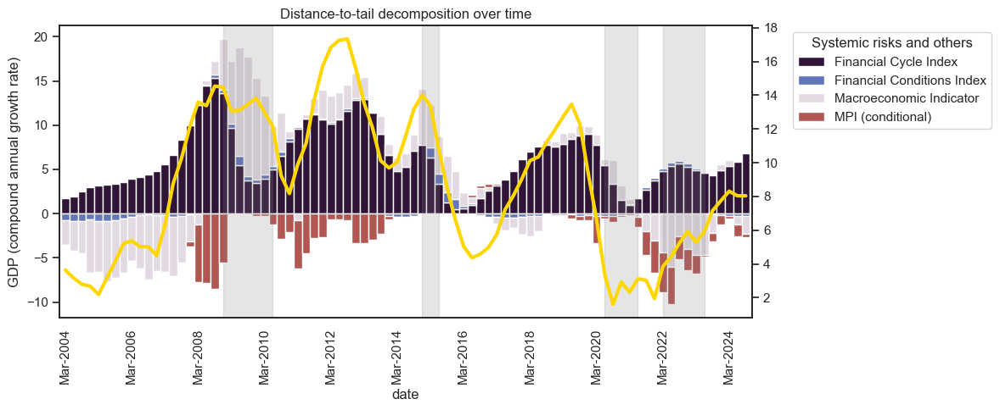

In [57]:
# plotting
fig, ax = plt.subplots(figsize=(12, 5))
colormap = cm.twilight_shifted
num_colors = gap_qstack_series.shape[1] - 1
colors = [colormap(i / num_colors) for i in range(num_colors)]
# colors = ['green'] + colors[1:]
gap_qstack_series[['distance-to-tail']].plot(kind='line', color='gold', secondary_y=True, legend=True, lw=3, ax=ax)
gap_qstack_series.iloc[:, 1:].plot(kind='bar', stacked=True, color=colors, ax=ax, legend=True, width=1)
ax.set_xticks(range(0, len(gap_series.index), 8))
ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1), title='Systemic risks and others')
ax.axvspan(gap_series.index.get_loc('2008-12-31'), gap_series.index.get_loc('2010-06-30'), alpha=0.2, color='grey')
ax.axvspan(gap_series.index.get_loc('2014-12-31'), gap_series.index.get_loc('2015-06-30'), alpha=0.2, color='grey')
ax.axvspan(gap_series.index.get_loc('2020-06-30'), gap_series.index.get_loc('2021-06-30'), alpha=0.2, color='grey')
ax.axvspan(gap_series.index.get_loc('2022-03-31'), gap_series.index.get_loc('2023-06-30'), alpha=0.2, color='grey')
ax.set_ylabel('GDP (compound annual growth rate)')
plt.title('Distance-to-tail decomposition over time')
plt.tight_layout()
# plt.savefig('../results/distance_to_tail_decomposition.png', bbox_inches='tight', dpi=300)
plt.show()

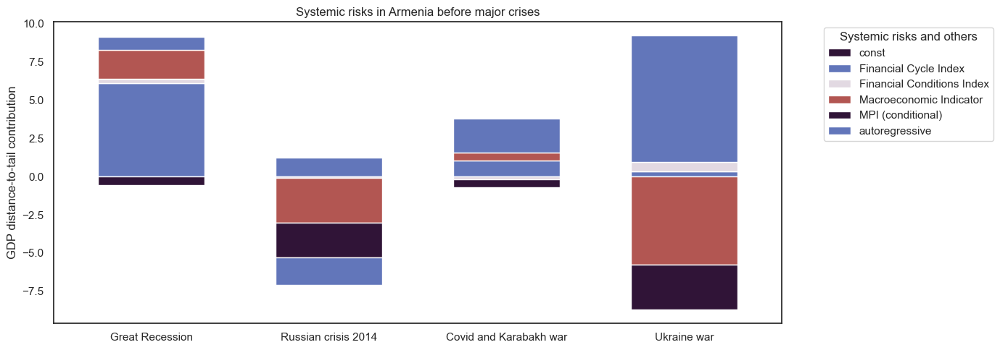

In [58]:
fig, ax = plt.subplots(figsize=(14, 5))
arm_risks_before_crises.plot(kind='bar', stacked=True, color=colors, legend=True, width=0.6, rot=0, ax=ax)
ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1), title='Systemic risks and others')
ax.set_ylabel('GDP distance-to-tail contribution')
plt.title('Systemic risks in Armenia before major crises')
plt.tight_layout()
plt.savefig('../results/distance_to_tail_changes_before_crises.png', bbox_inches='tight', dpi=300)
plt.show()

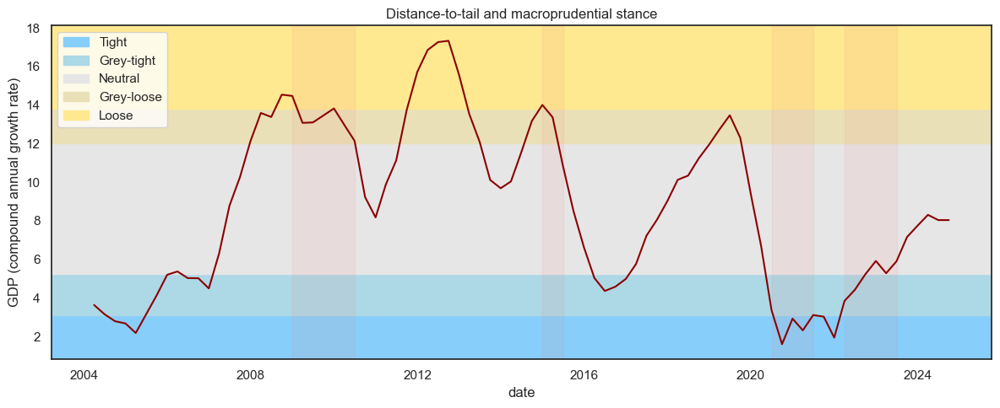

In [59]:
fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(gap_series.index, gap_series, color='darkred')

# Fill in area under the curve and the horizontal lines
date_min, date_max = ax.get_xlim()
gap_min, gap_max = ax.get_ylim()
gap_q01 = gap_series.quantile(0.1)
gap_q03 = gap_series.quantile(0.3)
gap_q07 = gap_series.quantile(0.7)
gap_q09 = gap_series.quantile(0.9)

ax.fill_between(x=ax.get_xticks(), y1=gap_q01, y2=gap_min, label='Tight', color='lightskyblue', interpolate=True, alpha=1)
ax.fill_between(x=ax.get_xticks(), y1=gap_q03, y2=gap_q01, label='Grey-tight', color='lightblue', interpolate=True, alpha=1)
ax.fill_between(x=ax.get_xticks(), y1=gap_q07, y2=gap_q03, label='Neutral', color='#e6e6e6', interpolate=True, alpha=1)
ax.fill_between(x=ax.get_xticks(), y1=gap_q09, y2=gap_q07, label='Grey-loose', color='#eae0b7', interpolate=True, alpha=1)
ax.fill_between(x=ax.get_xticks(), y1=gap_max, y2=gap_q09, label='Loose', color='#fee990', interpolate=True, alpha=1)
ax.set_xlim(date_min, date_max)
ax.set_ylim(gap_min, gap_max)
ax.axvspan('2008-12-31', '2010-06-30', alpha=0.1, color='lightcoral')
ax.axvspan('2014-12-31', '2015-06-30', alpha=0.1, color='lightcoral')
ax.axvspan('2020-06-30', '2021-06-30', alpha=0.1, color='lightcoral')
ax.axvspan('2022-03-31', '2023-06-30', alpha=0.1, color='lightcoral')
plt.xlabel('date')
plt.ylabel('GDP (compound annual growth rate)')
ax.legend(loc='upper left')
plt.title('Distance-to-tail and macroprudential stance')
plt.tight_layout()
# plt.savefig('../results/distance_to_tail_stance.png', bbox_inches='tight', dpi=300)
plt.show()

## suarez w calibration

In [60]:
def basel_ccyb_rule(gap):
    return (0.3125 * (gap - 0.02)).clip(0)


def czech_ccyb_rule(fcyi_index):
    fcyi = fcyi_index.values.copy()
    conds = [
        (fcyi >= 0) & (fcyi < 0.09),
        (fcyi >= 0.09) & (fcyi < 0.11),
        (fcyi >= 0.11) & (fcyi < 0.12),
        (fcyi >= 0.12) & (fcyi < 0.15),
        (fcyi >= 0.15) & (fcyi < 0.17),
        (fcyi >= 0.17) & (fcyi < 0.19),
        (fcyi >= 0.19) & (fcyi < 0.22),
        (fcyi >= 0.22) & (fcyi < 0.26),
        (fcyi >= 0.26) & (fcyi < 0.29),
        (fcyi >= 0.29) & (fcyi < 0.33),
        (fcyi >= 0.33) & (fcyi < 1),
    ]
    p = [
        0, 0.0025, 0.005, 0.0075, 0.01, 0.0125, 
        0.015, 0.0175, 0.02, 0.0225, 0.025
    ]
    return pd.Series(np.piecewise(fcyi, conds, p), index=fcyi_index.index)

In [61]:
# MP data
ss = StandardScalerDF()
mp_actual = X_selected['MP'].copy()
mpi_actual = X_selected.loc[exog.index, 'MPI'].rename('MPI_actual').copy()
credit_gap = X_selected.loc[exog.index, 'Credit GDP gap'].copy()
fcyi_actual = X_selected.loc[exog.index, 'Financial Cycle Index'].copy()

# policy choices
ccyb_policy_basel = basel_ccyb_rule(credit_gap)
ccyb_policy_czech = czech_ccyb_rule(fcyi_actual)

# optimal MPI choices
# mp_to_ccyb_rate = 1 / 0.0087
mp_to_ccyb_rate = 1 / 0.005
ccyb_actions_basel = ccyb_policy_basel.diff().fillna(0)
mp_basel = ccyb_actions_basel * mp_to_ccyb_rate
mpi_basel = mp_basel.rolling(window=4, min_periods=1).sum().rename('MPI_basel')
ccyb_actions_czech = ccyb_policy_czech.diff().fillna(0)
mp_czech = ccyb_actions_czech * mp_to_ccyb_rate
mpi_czech = mp_czech.rolling(window=4, min_periods=1).sum().rename('MPI_czech')

# scenarios for MPI
loss_types = ['MPI_loss_actual', 'MPI_loss_basel', 'MPI_loss_czech']
mpi_scenarios = pd.concat([mpi_actual, mpi_basel, mpi_czech], axis=1)

# optimal MPI: tightening
mpi_optimals = mpi_choices.rename(columns={'MPI': 'MPI_detla'}).copy()
mpi_optimals = pd.merge(mpi_optimals.reset_index(), mpi_scenarios, how='left', on='date').set_index(mpi_optimals.index.names)
mpi_optimals['MPI_loss_actual'] = mpi_optimals['MPI_detla']**2
mpi_optimals['MPI_loss_basel'] = (mpi_optimals['MPI_detla'] + mpi_optimals['MPI_actual'] - mpi_optimals['MPI_basel'])**2
mpi_optimals['MPI_loss_czech'] = (mpi_optimals['MPI_detla'] + mpi_optimals['MPI_actual'] - mpi_optimals['MPI_czech'])**2
mpi_w_choices = mpi_optimals.groupby(['w']).sum()[loss_types].copy()
mpi_w_choices_best = mpi_w_choices.iloc[10:].idxmin()


# optimal MPI: tightening+loosening
mpi_optimals_tl = mpi_choices_tl.rename(columns={'MPI': 'MPI_detla'}).copy()
mpi_optimals_tl = pd.merge(mpi_optimals_tl.reset_index(), mpi_scenarios, how='left', on='date').set_index(mpi_optimals_tl.index.names)
mpi_optimals_tl['MPI_loss_actual'] = mpi_optimals_tl['MPI_detla']**2
mpi_optimals_tl['MPI_loss_basel'] = (mpi_optimals_tl['MPI_detla'] + mpi_optimals_tl['MPI_actual'] - mpi_optimals_tl['MPI_basel'])**2
mpi_optimals_tl['MPI_loss_czech'] = (mpi_optimals_tl['MPI_detla'] + mpi_optimals_tl['MPI_actual'] - mpi_optimals_tl['MPI_czech'])**2
mpi_w_choices_tl = mpi_optimals_tl.groupby(['w']).sum()[loss_types].copy()
mpi_w_choices_tl_best = mpi_w_choices_tl.iloc[10:].idxmin()

# optimal w: tightening
w_actual = mpi_w_choices_best.loc['MPI_loss_actual']
w_basel = mpi_w_choices_best.loc['MPI_loss_basel']
w_czech = mpi_w_choices_best.loc['MPI_loss_czech']

# optimal w: tightening+loosening
w_actual_tl = mpi_w_choices_tl_best.loc['MPI_loss_actual']
w_basel_tl = mpi_w_choices_tl_best.loc['MPI_loss_basel']
w_czech_tl = mpi_w_choices_tl_best.loc['MPI_loss_czech']

# dynamic optimal w
w_series_actual = mpi_choices.abs().reset_index().set_index('w').groupby(['date'])['MPI'].idxmin()
w_series_actual_tl = mpi_choices_tl.abs().reset_index().set_index('w').groupby(['date'])['MPI'].idxmin()

# dynamic optimal w mod: tightening
gkde = gaussian_kde(w_series_actual)
gpdf = pd.Series(gkde(w_series_actual), index=w_series_actual)
gpdf = gpdf.sort_index()
w_dynamic_mod = gpdf.idxmax()

# dynamic optimal w mod: tightening+loosening
gkde = gaussian_kde(w_series_actual_tl)
gpdf = pd.Series(gkde(w_series_actual_tl), index=w_series_actual_tl)
gpdf = gpdf.sort_index()
w_dynamic_mod_tl = gpdf.idxmax()

# deriving optimal policy
mpi_optimal = mpi_actual + mpi_choices.xs(w_fixed, level='w')['MPI']
mpi_optimal_tl = mpi_actual + mpi_choices_tl.xs(w_fixed, level='w')['MPI']

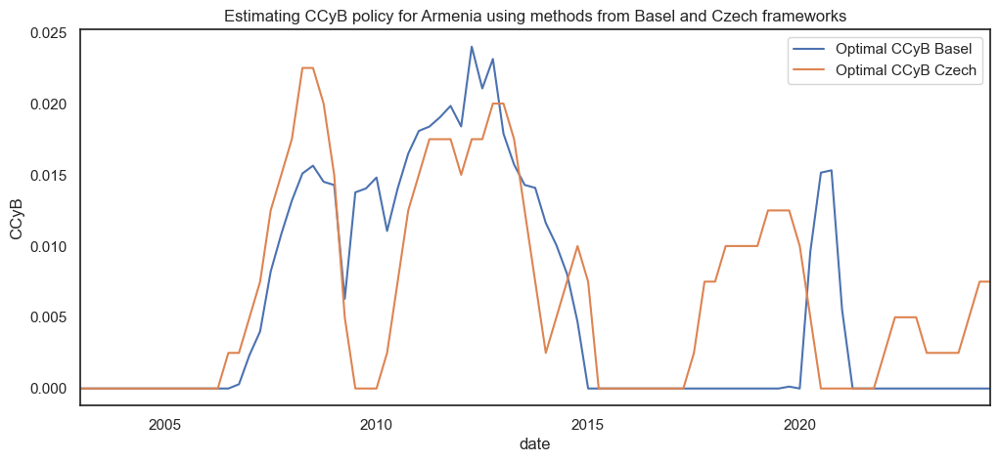

In [62]:
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
ccyb_policy_basel.plot(ax=ax)
ccyb_policy_czech.plot(ax=ax)
ax.set_ylabel('CCyB')
ax.set_title('Estimating CCyB policy for Armenia using methods from Basel and Czech frameworks')
plt.legend(['Optimal CCyB Basel', 'Optimal CCyB Czech'])
# plt.savefig('../results/arm_ccyb_simulation.png', bbox_inches='tight', dpi=300)
plt.show()

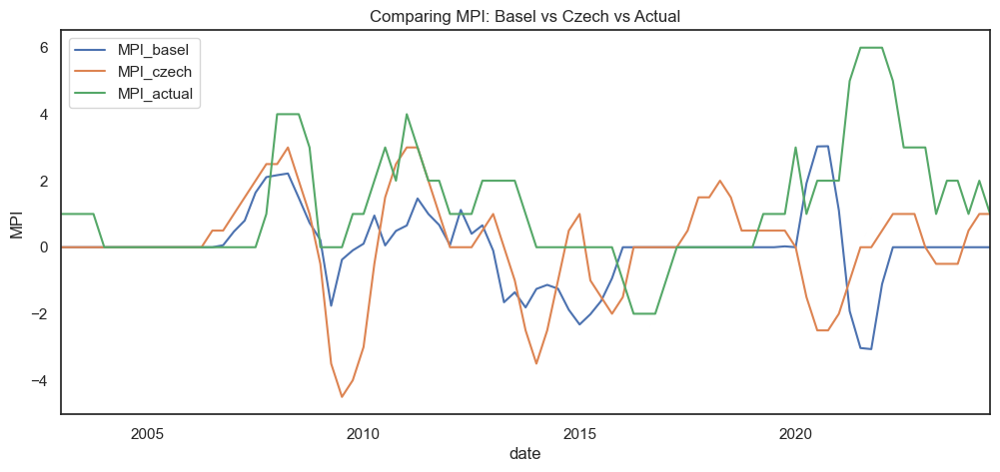

In [63]:
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
mpi_basel.plot(ax=ax)
mpi_czech.plot(ax=ax)
mpi_actual.plot(ax=ax)
ax.set_title('Comparing MPI: Basel vs Czech vs Actual')
ax.set_ylabel('MPI')
plt.legend()
# plt.savefig('../results/arm_mpi_simulation.png', bbox_inches='tight', dpi=300)
plt.show()

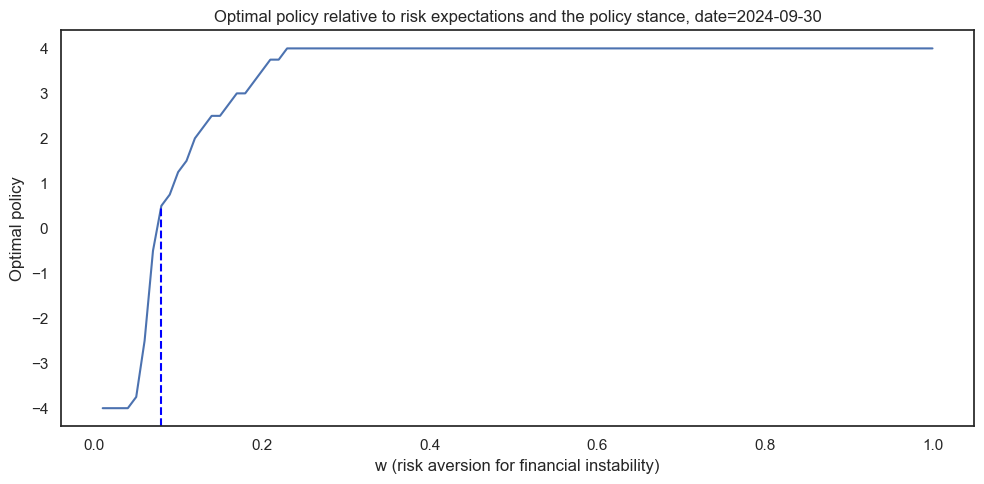

In [64]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
s_opt_today = mpi_choice_today.loc[w_fixed]
mpi_choice_today.plot(ax=ax)
y_min, y_max = ax.get_ylim()
mpi_optimal_loc = (s_opt_today - y_min) / (y_max - y_min)
ax.axvline(x=w_fixed, ymax=mpi_optimal_loc, color='blue', linestyle='--')
ax.set_title(f'Optimal policy relative to risk expectations and the policy stance, date={latest_date.strftime("%Y-%m-%d")}')
ax.set_ylabel('Optimal policy')
ax.set_xlabel('w (risk aversion for financial instability)')
plt.tight_layout()
# plt.savefig('../results/arm_risk_aversion.png', bbox_inches='tight', dpi=300)
plt.show()

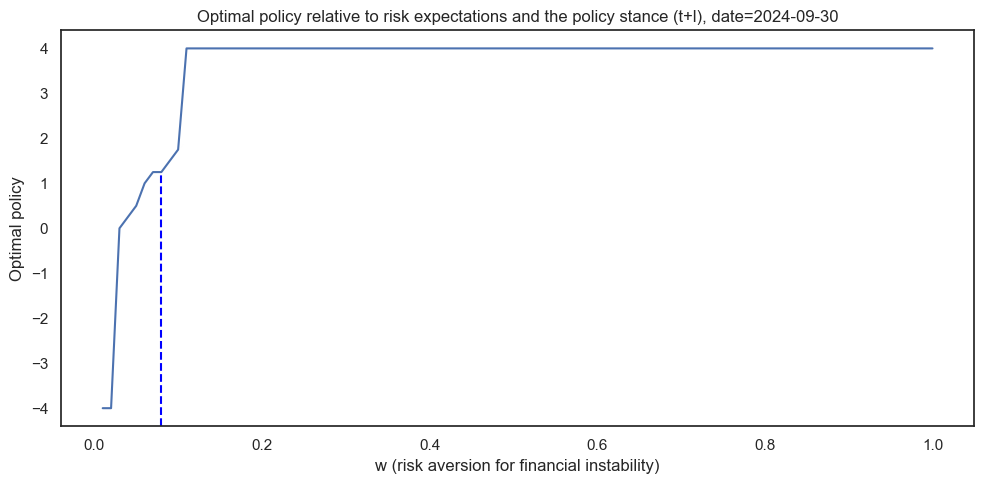

In [65]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
s_opt_tl_today = mpi_choices_tl_today.loc[w_fixed]
mpi_choices_tl_today.plot(ax=ax)
y_min, y_max = ax.get_ylim()
mpi_optimal_loc = (s_opt_tl_today - y_min) / (y_max - y_min)
ax.axvline(x=w_fixed, ymax=mpi_optimal_loc, color='blue', linestyle='--')
ax.set_title(f'Optimal policy relative to risk expectations and the policy stance (t+l), date={latest_date.strftime("%Y-%m-%d")}')
ax.set_ylabel('Optimal policy')
ax.set_xlabel('w (risk aversion for financial instability)')
plt.tight_layout()
plt.savefig('../results/arm_risk_aversion_tl.png', bbox_inches='tight', dpi=300)
plt.show()

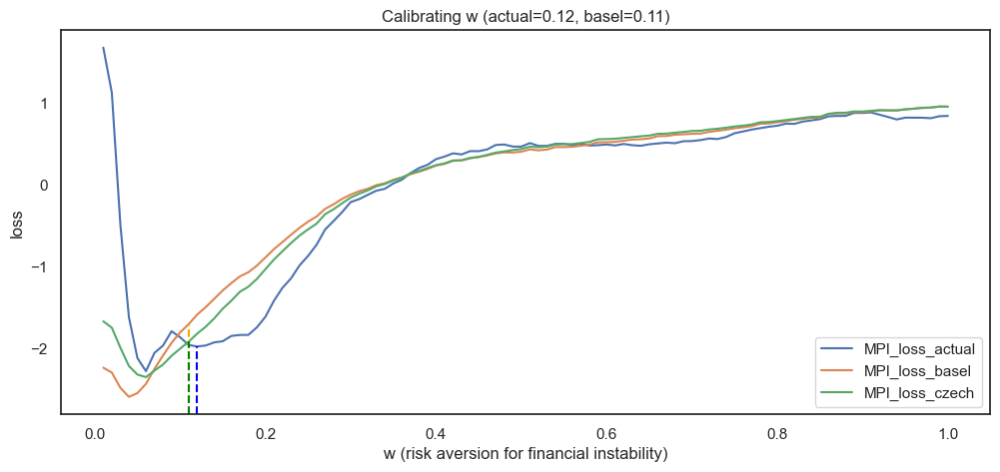

In [66]:
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
loss_plot_data = ss.fit_transform(mpi_w_choices)
loss_plot_data.plot(ax=ax)
y_min, y_max = ax.get_ylim()
mpi_actual_loc = (loss_plot_data.loc[w_actual, 'MPI_loss_actual'] - y_min) / (y_max - y_min)
mpi_basel_loc = (loss_plot_data.loc[w_basel, 'MPI_loss_basel'] - y_min) / (y_max - y_min)
mpi_czech_loc = (loss_plot_data.loc[w_czech, 'MPI_loss_czech'] - y_min) / (y_max - y_min)
ax.axvline(x=w_actual, ymax=mpi_actual_loc, color='blue', linestyle='--')
ax.axvline(x=w_basel, ymax=mpi_basel_loc, color='orange', linestyle='--')
ax.axvline(x=w_czech, ymax=mpi_czech_loc, color='green', linestyle='--')
ax.set_title(f'Calibrating w (actual={w_actual}, basel={w_basel})')
ax.set_ylabel('loss')
ax.set_xlabel('w (risk aversion for financial instability)')
plt.savefig('../results/arm_w_calibration.png', bbox_inches='tight', dpi=300)
plt.show()

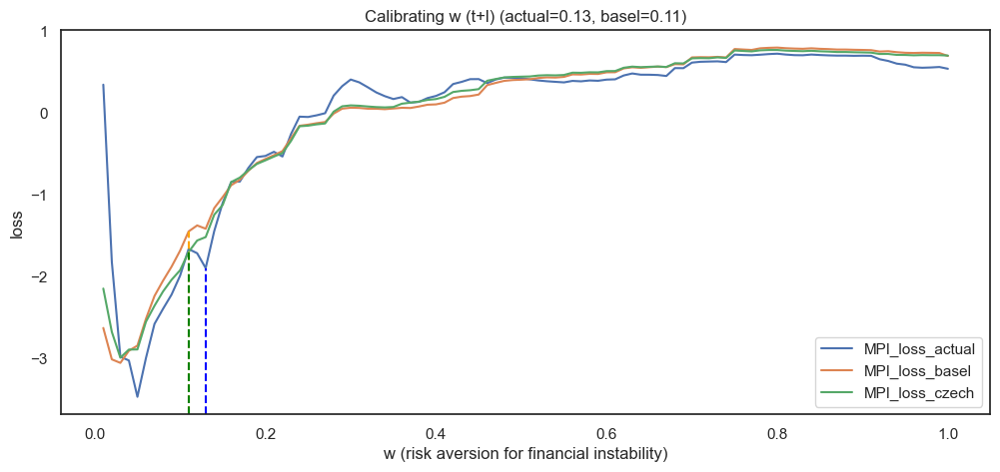

In [67]:
fig, ax = plt.subplots(1, 1, figsize=(12, 5))
loss_plot_data = ss.fit_transform(mpi_w_choices_tl)
loss_plot_data.plot(ax=ax)
y_min, y_max = ax.get_ylim()
mpi_actual_loc = (loss_plot_data.loc[w_actual_tl, 'MPI_loss_actual'] - y_min) / (y_max - y_min)
mpi_basel_loc = (loss_plot_data.loc[w_basel_tl, 'MPI_loss_basel'] - y_min) / (y_max - y_min)
mpi_czech_loc = (loss_plot_data.loc[w_czech_tl, 'MPI_loss_czech'] - y_min) / (y_max - y_min)
ax.axvline(x=w_actual_tl, ymax=mpi_actual_loc, color='blue', linestyle='--')
ax.axvline(x=w_basel_tl, ymax=mpi_basel_loc, color='orange', linestyle='--')
ax.axvline(x=w_czech_tl, ymax=mpi_czech_loc, color='green', linestyle='--')
ax.set_title(f'Calibrating w (t+l) (actual={w_actual_tl}, basel={w_basel_tl})')
ax.set_ylabel('loss')
ax.set_xlabel('w (risk aversion for financial instability)')
# plt.savefig('../results/arm_w_calibration_direct.png', bbox_inches='tight', dpi=300)
plt.show()

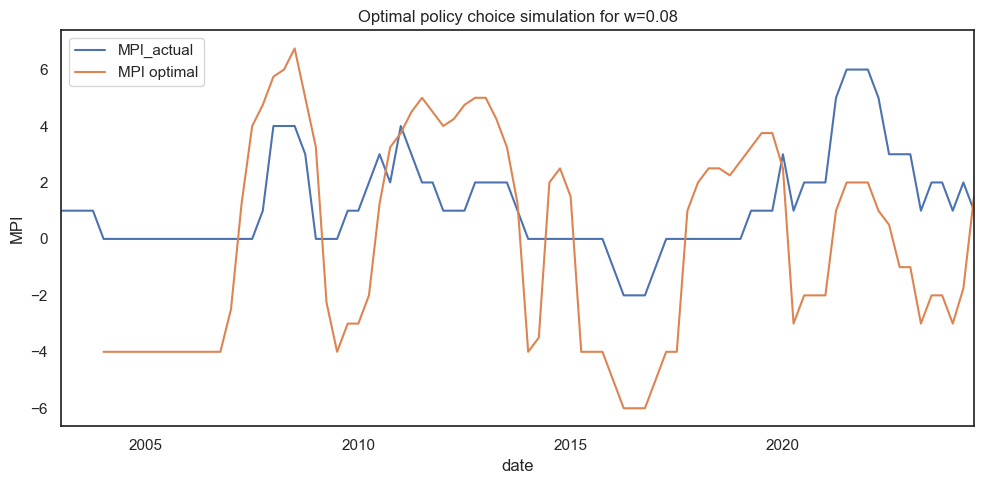

In [68]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
mpi_actual.plot()
mpi_optimal.rename('MPI optimal').plot()
ax.set_ylabel('MPI')
ax.legend()
ax.set_title(f'Optimal policy choice simulation for w={w_fixed}')
plt.tight_layout()
# plt.savefig('../results/arm_policy_simulation_direct.png', bbox_inches='tight', dpi=300)
plt.show()

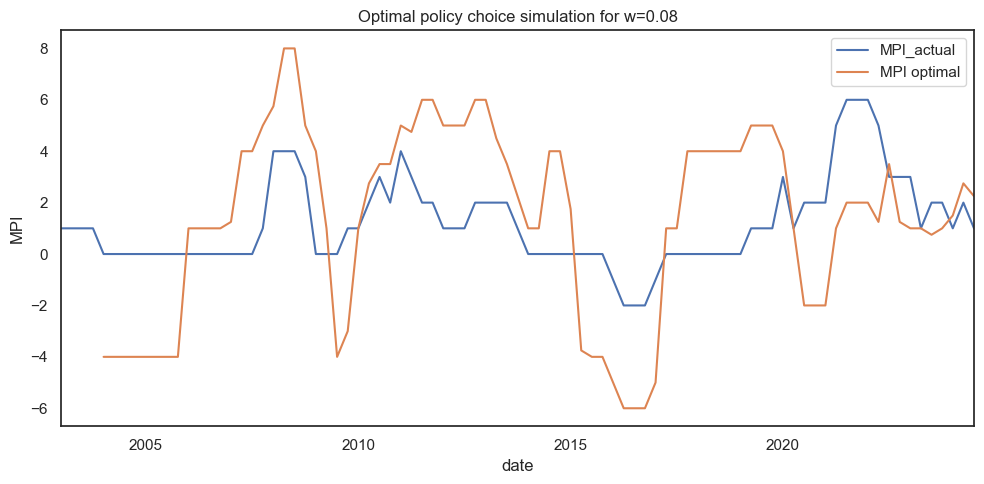

In [69]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
mpi_actual.plot()
mpi_optimal_tl.rename('MPI optimal').plot()
ax.set_ylabel('MPI')
ax.legend()
ax.set_title(f'Optimal policy choice simulation for w={w_fixed}')
plt.tight_layout()
# # plt.savefig('../results/arm_policy_simulation_direct.png', bbox_inches='tight', dpi=300)
plt.show()

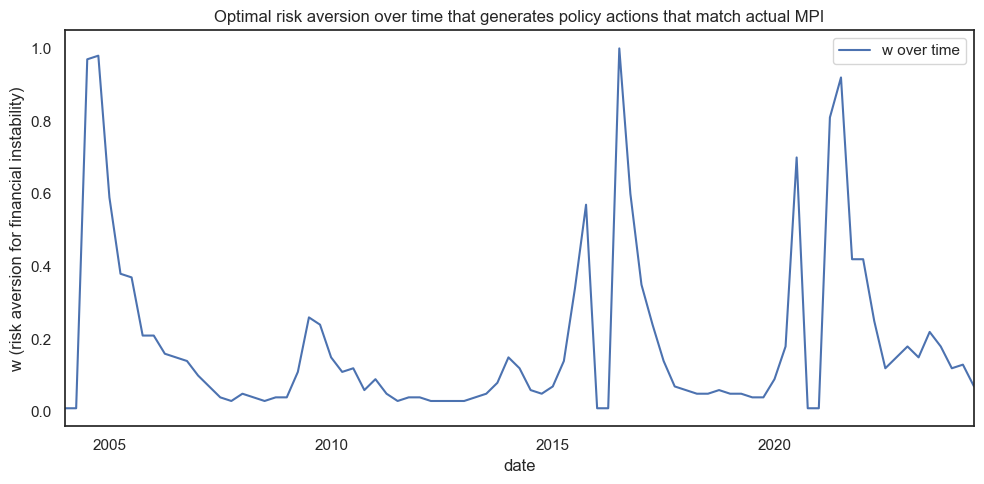

In [70]:
fig, ax = plt.subplots(1, 1, figsize=(10, 5))
w_series_actual.plot(ax=ax)
ax.set_ylabel('w (risk aversion for financial instability)')
ax.legend(['w over time'])
ax.set_title('Optimal risk aversion over time that generates policy actions that match actual MPI')
plt.tight_layout()
# plt.savefig('../results/arm_w_dynamic_series.png', bbox_inches='tight', dpi=300)
plt.show()

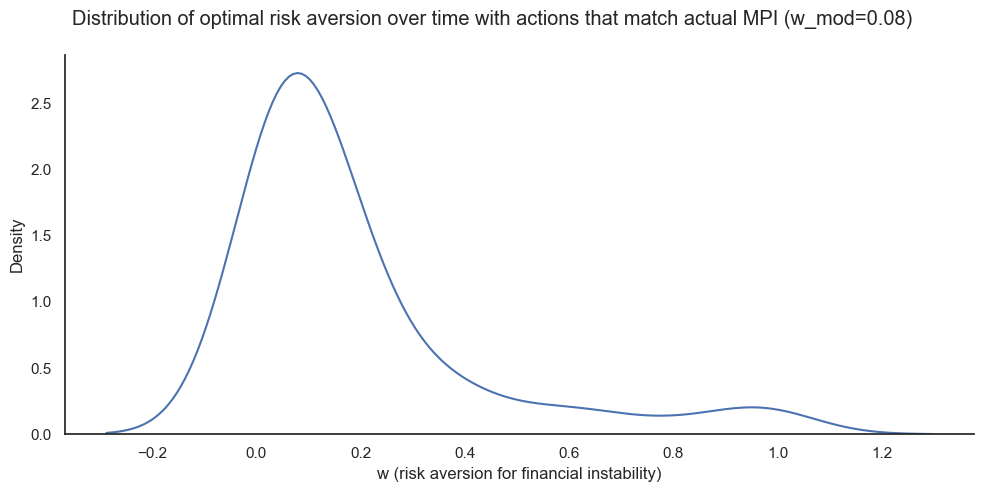

In [71]:
w_col_name = {'MPI': 'w (risk aversion for financial instability)'}
plot_data = pd.DataFrame(w_series_actual).rename(columns=w_col_name)
ax = sns.displot(plot_data,
                 x="w (risk aversion for financial instability)",
                 kind="kde",
                 height=5,
                 aspect=2,
                 common_norm=False,
                 facet_kws={'sharey': False})
w_mod_test = f' (w_mod={w_dynamic_mod})'
ax.fig.suptitle('Distribution of optimal risk aversion over time with actions that match actual MPI'+w_mod_test)
plt.tight_layout()
# plt.savefig('../results/arm_w_dynamic_dist.png', bbox_inches='tight', dpi=300)
plt.show()

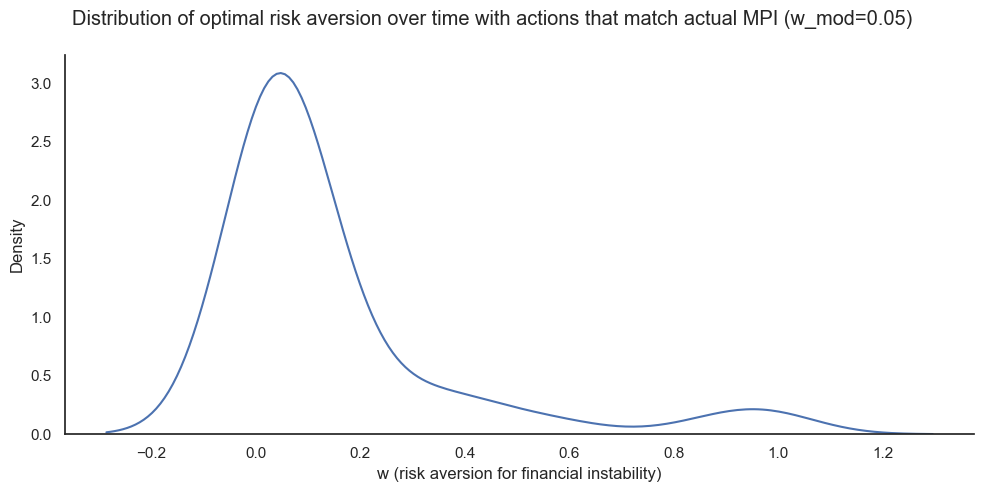

In [72]:
w_col_name = {'MPI': 'w (risk aversion for financial instability)'}
plot_data = pd.DataFrame(w_series_actual_tl).rename(columns=w_col_name)
ax = sns.displot(plot_data,
                 x="w (risk aversion for financial instability)",
                 kind="kde",
                 height=5,
                 aspect=2,
                 common_norm=False,
                 facet_kws={'sharey': False})
w_mod_test = f' (w_mod={w_dynamic_mod_tl})'
ax.fig.suptitle('Distribution of optimal risk aversion over time with actions that match actual MPI'+w_mod_test)
plt.tight_layout()
# plt.savefig('../results/arm_w_dynamic_dist.png', bbox_inches='tight', dpi=300)
plt.show()

## policy outcomes

In [73]:
date_today = latest_date
date_old = latest_date - pd.DateOffset(years=1)
gap_col_order

exog_col_order = gap_qstack_series.columns[1:].copy()
variable_effects = gdp_dist_details.xs(0, level='MPI_shock')
variable_index_order = ['horizon', 'date', 'quantile', 'variable']
variable_effects = variable_effects.reorder_levels(variable_index_order).sort_index()

# estimating changes
variable_effects_old = variable_effects.xs(date_old, level='date').sort_index()
variable_effects_today = variable_effects.xs(date_today, level='date').sort_index()
variable_effects_diff = (variable_effects_today - variable_effects_old).sort_index()

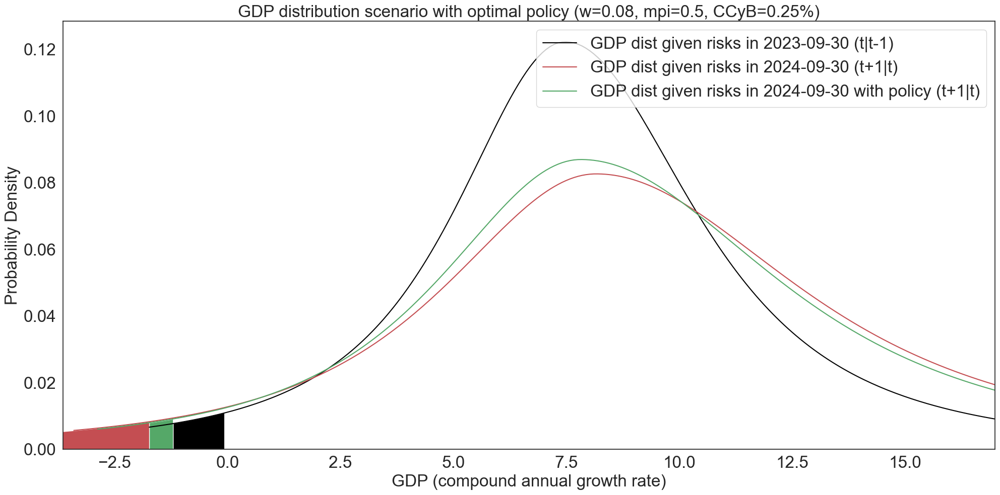

quantile
GaR        0.229187
GDPq50    -0.317032
Gap       -0.546219
Utility    0.017675
Name: (4.0, 2024-09-30 00:00:00, 0.08, 0.5), dtype: float64


quantile                                GaR    GDPq50       Gap   Utility
horizon date       w    MPI_shock                                        
4.0     2023-09-30 0.08 0.0        2.207452  7.888828  5.681376  6.597706
                        0.5        2.213908  7.536576  5.322668  6.403344
        2024-09-30 0.08 0.0        1.302323  9.235048  7.932725  6.717923
                        0.5        1.531510  8.918016  7.386506  6.735597

In [74]:
horizon = 4
plot_date_today = latest_date - pd.DateOffset(years=1)
plot_date_tomorrow = latest_date
method = 'T-skew'
mpi_shock_passive = 0

# estimating optimal policy given our forecast and weight
optimal_policy = mpi_choice_today.loc[w_fixed]
policy_cases = growth_options.loc[horizon, plot_date_tomorrow, w_fixed, [0, optimal_policy]]
policy_outcomes = policy_cases.diff().iloc[-1]

dist_index_today = (horizon, plot_date_today, method, mpi_shock_passive)
dist_index_tomorrow = (horizon, plot_date_tomorrow, method, mpi_shock_passive)
dist_index_tomorrow_policy = (horizon, plot_date_tomorrow, method, optimal_policy)

x_list_today, yvals_today, ycdf_today = prediction_dfpdf.loc[dist_index_today].values.T
x_list_tomorrow, yvals_tomorrow, ycdf_tomorrow = prediction_dfpdf.loc[dist_index_tomorrow].values.T
x_list_tp, yvals_tp, ycdf_tp = prediction_dfpdf.loc[dist_index_tomorrow_policy].values.T

q5_index_today = np.argmin(np.abs(ycdf_today - 0.05))
q5_index_tomorrow = np.argmin(np.abs(ycdf_tomorrow - 0.05))
q5_index_tp = np.argmin(np.abs(ycdf_tp - 0.05))
q50_index_today = np.argmin(np.abs(ycdf_today - 0.5))
q50_index_tomorrow = np.argmin(np.abs(ycdf_tomorrow - 0.5))
q50_index_tp = np.argmin(np.abs(ycdf_tp - 0.5))
x_tail = np.min([x_list_today[q5_index_today], x_list_today[q5_index_tomorrow], x_list_today[q5_index_tp]])
x_front = np.max([x_list_today[q50_index_today], x_list_today[q50_index_tomorrow], x_list_today[q50_index_tp]])

fig, ax = plt.subplots(1, 1, figsize=(20, 10))
titlestr = f'GDP distribution scenario with optimal policy (w={w_fixed}, mpi={optimal_policy}, CCyB={optimal_policy*0.5}%)'
lablestr_today = f'GDP dist given risks in {plot_date_today.strftime("%Y-%m-%d")} (t|t-1)'
lablestr_tomorrow = f'GDP dist given risks in {plot_date_tomorrow.strftime("%Y-%m-%d")} (t+1|t)'
lablestr_tp = f'GDP dist given risks in {plot_date_tomorrow.strftime("%Y-%m-%d")} with policy (t+1|t)'

ax.plot(x_list_today[q5_index_today-20:], yvals_today[q5_index_today-20:], 'black', label=lablestr_today)
ax.plot(x_list_today[q5_index_tomorrow-20:], yvals_tomorrow[q5_index_tomorrow-20:], 'r-', label=lablestr_tomorrow)
ax.plot(x_list_today[q5_index_tp-20:], yvals_tp[q5_index_tp-20:], 'g-', label=lablestr_tp)

if yvals_today[q5_index_today] > yvals_tomorrow[q5_index_tomorrow]:
    ax.fill_between(x_list_today[:q5_index_today], 0, yvals_today[:q5_index_today],  facecolor='black', interpolate=True)
    ax.fill_between(x_list_today[:q5_index_tp], 0, yvals_tp[:q5_index_tp],  facecolor='g', interpolate=True)
    ax.fill_between(x_list_today[:q5_index_tomorrow], 0, yvals_tomorrow[:q5_index_tomorrow],  facecolor='r', interpolate=True)
else:
    ax.fill_between(x_list_today[:q5_index_tomorrow], 0, yvals_tomorrow[:q5_index_tomorrow],  facecolor='r', interpolate=True)
    ax.fill_between(x_list_today[:q5_index_tp], 0, yvals_tp[:q5_index_tp],  facecolor='g', interpolate=True)
    ax.fill_between(x_list_today[:q5_index_today], 0, yvals_today[:q5_index_today],  facecolor='black', interpolate=True)

# plot design
ax.set_title(titlestr, fontsize=24)
ax.legend(loc='upper right', fontsize=24)
ax.tick_params(labelsize=24)
ax.set_xlim(x_tail-2, x_front+8)
ax.set_ylim(0, max(max(yvals_today), max(yvals_tomorrow), max(yvals_tp))*1.05)
ax.set_ylabel('Probability Density', fontsize=24)
ax.set_xlabel('GDP (compound annual growth rate)', fontsize=24)
plt.tight_layout()
plt.savefig('../results/arm_dist_optimal_policy.png', bbox_inches='tight', dpi=300)
plt.show()
print(policy_outcomes)
display(growth_options.loc[horizon, [latest_date - pd.DateOffset(years=1), latest_date], w_fixed, [0, s_opt_today]])

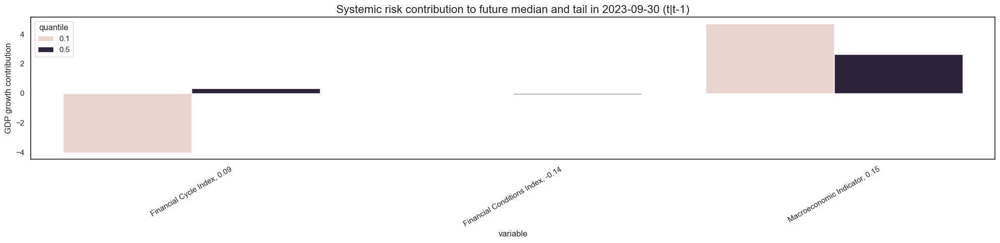

In [75]:
fig, ax = plt.subplots(1, 1, figsize=(20, 5))
titlestr = f'Systemic risk contribution to future median and tail in {date_old.strftime("%Y-%m-%d")} (t|t-1)'
plot_data = variable_effects_old.loc[4].loc[[0.1, 0.5]]
plot_data = plot_data.groupby('quantile', group_keys=False).apply(lambda x: x.reindex(exog_col_order, level='variable'))
exog_values = plot_data.loc[0.1, 'exog'].values.round(2)
var_values = plot_data.loc[0.1].index.get_level_values('variable')
x_values = {n: f"{n}, {v}" for n, v in zip(var_values, exog_values)}
plot_data = plot_data.reset_index()
plot_data['variable'] = plot_data['variable'].replace(x_values)
ax.set_title(titlestr, fontsize=16)
sns.barplot(plot_data, x="variable", y="pred", hue='quantile', order=x_values.values(), errorbar=None, ax=ax)
for item in ax.get_xticklabels():
    item.set_rotation(30)
ax.set_ylabel('GDP growth contribution')
plt.tight_layout()
# plt.savefig(f'../results/arm_dist_decomp_{date_old.strftime("%Y-%m-%d")}(t|t-1).png', bbox_inches='tight', dpi=300)
plt.show()

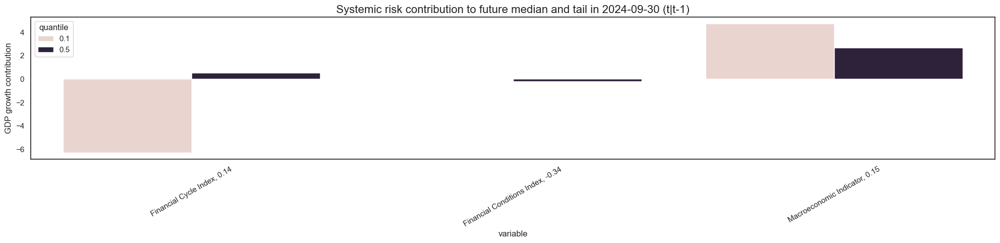

In [76]:
fig, ax = plt.subplots(1, 1, figsize=(20, 5))
titlestr = f'Systemic risk contribution to future median and tail in {date_today.strftime("%Y-%m-%d")} (t|t-1)'
plot_data = variable_effects_today.loc[4].loc[[0.1, 0.5]]
plot_data = plot_data.groupby('quantile', group_keys=False).apply(
    lambda x: x.reindex(exog_col_order, level='variable'))
exog_values = plot_data.loc[0.1, 'exog'].values.round(2)
var_values = plot_data.loc[0.1].index.get_level_values('variable')
x_values = {n: f"{n}, {v}" for n, v in zip(var_values, exog_values)}
plot_data = plot_data.reset_index()
plot_data['variable'] = plot_data['variable'].replace(x_values)
ax.set_title(titlestr, fontsize=16)
sns.barplot(plot_data, x="variable", y="pred", hue='quantile', order=x_values.values(), errorbar=None, ax=ax)
for item in ax.get_xticklabels():
    item.set_rotation(30)
ax.set_ylabel('GDP growth contribution')
plt.tight_layout()
# plt.savefig(f'../results/arm_dist_decomp_{date_today.strftime("%Y-%m-%d")}(t|t-1).png', bbox_inches='tight', dpi=300)
plt.show()

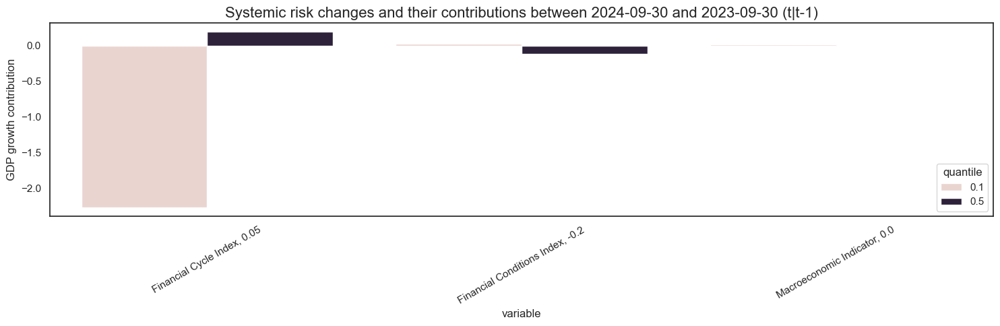

In [77]:
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
titlestr = f'Systemic risk changes and their contributions between {date_today.strftime("%Y-%m-%d")} and {date_old.strftime("%Y-%m-%d")} (t|t-1)'
plot_data = variable_effects_diff.loc[4].loc[[0.1, 0.5]]
plot_data = plot_data.groupby('quantile', group_keys=False).apply(
    lambda x: x.reindex(exog_col_order, level='variable'))
exog_values = plot_data.loc[0.1, 'exog'].values.round(2)
var_values = plot_data.loc[0.1].index.get_level_values('variable')
x_values = {n: f"{n}, {v}" for n, v in zip(var_values, exog_values)}
plot_data = plot_data.reset_index()
plot_data['variable'] = plot_data['variable'].replace(x_values)
ax.set_title(titlestr, fontsize=16)
sns.barplot(plot_data, x="variable", y="pred", hue='quantile', order=x_values.values(), errorbar=None, ax=ax)
for item in ax.get_xticklabels():
    item.set_rotation(30)
ax.set_ylabel('GDP growth contribution')
plt.tight_layout()
plt.savefig(f'../results/arm_dist_decomp_diff_{date_today.strftime("%Y-%m-%d")}(t|t-1).png', bbox_inches='tight', dpi=300)
plt.show()

In [78]:
mpi_coeff_series = gdp_dist_details['f_coeff'].loc[4].xs('MPI', level='variable').xs(0, level='MPI_shock').unstack('quantile').T
mpi_coeff_change = mpi_coeff_series[[latest_date - pd.DateOffset(years=1), latest_date]]
exog_changes = exog.loc[[latest_date - pd.DateOffset(years=1), latest_date], ['Financial Cycle Index', 'Financial Conditions Index', 'CAR excess']]
mpi_legends = [
    f"{d.strftime('%Y-%m-%d')} " +
    ", ".join(f"{n}={v:.3f}" for n, v in v.items())
    for d, v in exog_changes.to_dict('index').items()
]

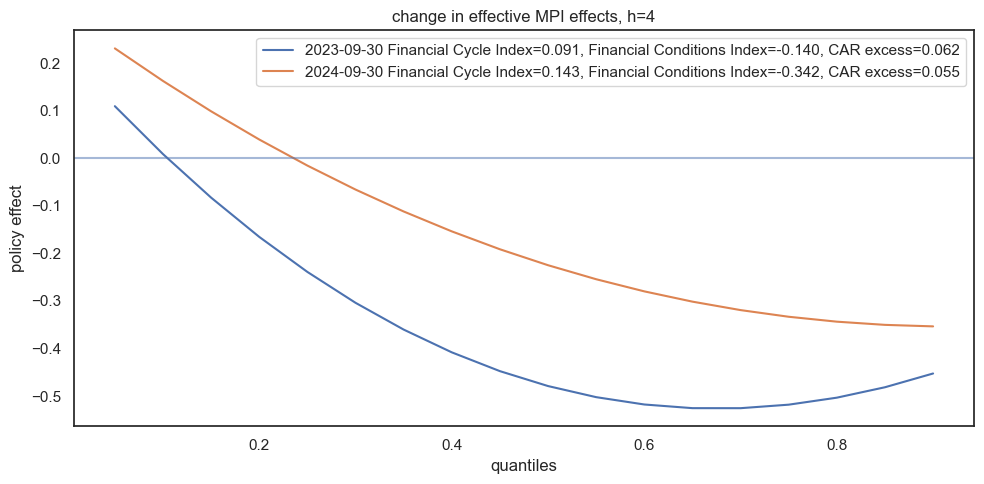

In [79]:
fig, ax = plt.subplots(figsize=(10, 5))
mpi_coeff_change.plot(ax=ax)
ax.axhline(0, alpha=0.5)
ax.set_title(f'change in effective MPI effects, h={4}')
ax.set_xlabel('quantiles')
ax.set_ylabel('policy effect')
ax.legend(mpi_legends)
plt.tight_layout()
plt.savefig('../results/arm_conditional_MPI_quantiles_change_h4.png', bbox_inches='tight', dpi=300)
plt.show()

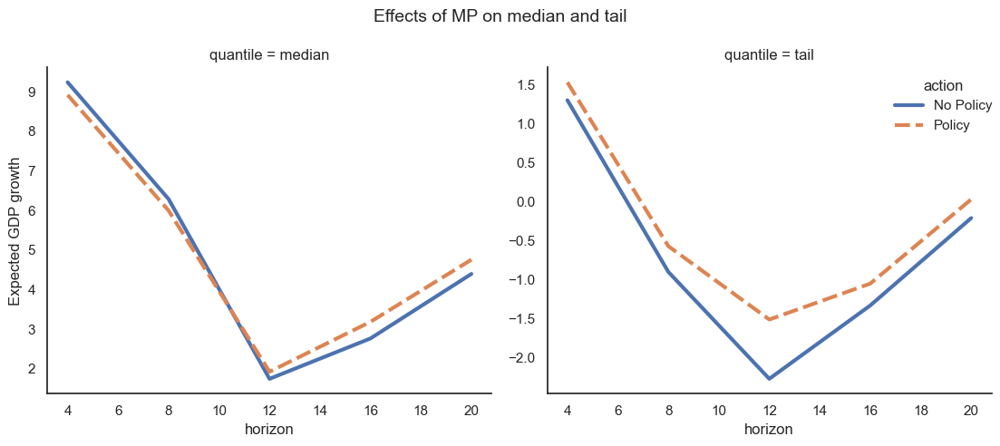

In [80]:
g = sns.relplot(data=growth_options_today.stack().loc[["median", "tail"]].reset_index().rename(columns={0:'Expected GDP growth'}),
                x="horizon", y='Expected GDP growth', col="quantile",
                hue="action", style="action", kind="line",
                linewidth = 3,
                facet_kws={'sharey': False, 'sharex': False}
)
g.fig.suptitle('Effects of MP on median and tail', fontsize=14)
g._legend.set_bbox_to_anchor([0.99, 0.75])
plt.tight_layout()
plt.savefig('../results/arm_mp_outcomes.png', bbox_inches='tight', dpi=300)
plt.show()

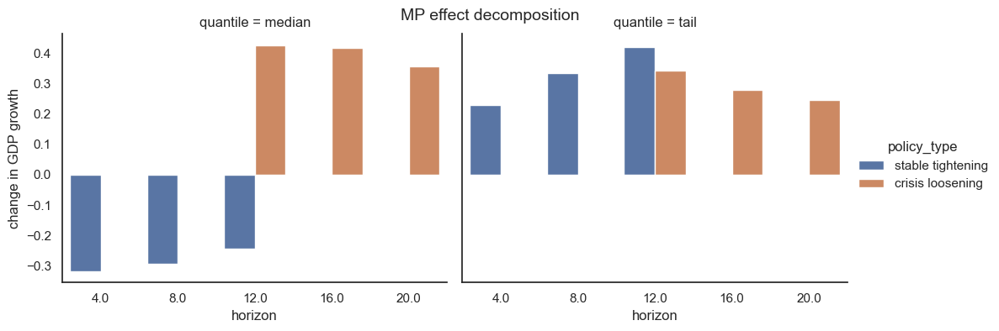

In [81]:
g = sns.catplot(data=mpi_policy_effects_today.stack().reset_index().rename(columns={0: 'change in GDP growth'}), 
                x="horizon", y='change in GDP growth', hue="policy_type",
                col="quantile", kind="bar", height=4, aspect=1.3, col_order=["median", "tail"],
                hue_order=["stable tightening", "crisis loosening"]
)
g.fig.suptitle('MP effect decomposition', fontsize=14)
plt.savefig('../results/arm_mp_effect_decomposition.png', bbox_inches='tight', dpi=300)
plt.show()